In [1]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import random
import pandas as pd
import time

<h1> Differential Evolutionary Algorithm for Gene Regulatory Network of 5 Genes <h1>
<img src="ssystemequation.png"><img>

In [1]:
df = pd.read_excel('data.xlsx')
orginal_gene_expression = np.array(df)
orginal_gene_expression[0]

NameError: name 'pd' is not defined

In [2]:
df = pd.read_excel('5gene.xlsx')
ge_original = np.array(df)
ge_original

array([[0.7    , 0.12   , 0.14   , 0.16   , 0.18   ],
       [0.77413, 0.17038, 0.68072, 0.2638 , 0.18058],
       [0.91692, 0.23761, 0.86764, 0.52215, 0.19239],
       [1.03717, 0.32601, 0.93309, 0.79176, 0.23218],
       [1.1009 , 0.42709, 0.96024, 0.98295, 0.30541],
       [1.11553, 0.5277 , 0.97369, 1.08819, 0.40153],
       [1.10067, 0.61786, 0.98137, 1.13338, 0.50515],
       [1.07136, 0.69281, 0.98623, 1.14312, 0.60428],
       [1.03644, 0.75156, 0.98954, 1.13372, 0.69192],
       [1.00064, 0.79529, 0.99191, 1.1149 , 0.76515],
       [0.96636, 0.8261 , 0.99367, 1.09223, 0.82365]])

In [3]:
t = len(ge_original)
n = 5 # number of genes 
CR = 0.5
F = 0.2
EPS = 1.0
while EPS + 1 > 1:
    EPS /= 2
EPS *= 2
ge_original

array([[0.7    , 0.12   , 0.14   , 0.16   , 0.18   ],
       [0.77413, 0.17038, 0.68072, 0.2638 , 0.18058],
       [0.91692, 0.23761, 0.86764, 0.52215, 0.19239],
       [1.03717, 0.32601, 0.93309, 0.79176, 0.23218],
       [1.1009 , 0.42709, 0.96024, 0.98295, 0.30541],
       [1.11553, 0.5277 , 0.97369, 1.08819, 0.40153],
       [1.10067, 0.61786, 0.98137, 1.13338, 0.50515],
       [1.07136, 0.69281, 0.98623, 1.14312, 0.60428],
       [1.03644, 0.75156, 0.98954, 1.13372, 0.69192],
       [1.00064, 0.79529, 0.99191, 1.1149 , 0.76515],
       [0.96636, 0.8261 , 0.99367, 1.09223, 0.82365]])

In [4]:
#generating Random Number in the bounds

def rand(l,h,shape):
    return(np.random.randint(low=l, high=h, size=shape))

In [5]:
#mutation function 
def mutation(l,h,i):
    
    r1 = rand(l,h,i.shape)
    r2 = rand(l,h,i.shape)
    r3 = rand(l,h,i.shape)
    return(r1+F*(r2-r3))

In [6]:
def checkBounds(parameters, low, high ):
    while((parameters<low).any() or (parameters>high).any()):
        InBounds=[]
        for x in np.nditer(parameters):
            if(x<low):
                InBounds.append(2*low-x)
            elif(x>high):
                InBounds.append(2*high-x)
            else:
                InBounds.append(x)
        parameters = np.array(InBounds).reshape(parameters.shape)
        #print(parameters)
    
    return(parameters)

       


In [7]:
#crossover function

def crossover(g_mutant,g_target):
    
    temp = np.empty(g_target.shape)
    j_rand = np.random.randint(0,len(g_target))
    j = rand(0,1,g_target.shape)
    i = 0
    for x,y,z,t in zip(np.nditer(j),np.nditer(g_mutant),np.nditer(g_target),np.nditer(temp)):
        if(x<=CR or x==j_rand):
            t =y
        elif(x>CR and x!=j_rand):
            t =z
    #print("===================g_mutant===b=========",temp)
    return(g_mutant)       
            
            
            

<h2>Approximating solutions Euler's Method</h2>
$y_{n+1} = y_{n}+h.f(y_{n},t_{n})$

In [127]:

def calc_dydt(alpha, beta, g, h, exp ):
    
    #exp is the gene expression of the previous time step
    
    
    #print(alpha,'*',exp[0],'^',g[0],'*',exp[1],'^',g[1],'*',exp[2],'^',g[2],'*',exp[3],'^',g[3],'*',exp[4],'^',g[4])
    
    Generation = alpha * (np.prod(pow(exp,g)))
    Degeneration = beta* (np.prod(pow(exp,h)))
    
    return (Generation-Degeneration)
    
def calc_ge(p):
    
    #print("I got here")
    #p --> learning parameters as a dictionary 
    
    #t -->is the length of time stamp
    #n --> number of Genes
    #init--> gene expression for time step 1
    
    original = ge_original.copy()
    ge_calc = [original[0]]
    H=0.01

    for i in range(t-1):
        
        
        
        single_exp=[]
        #original
        #print("original")
        #print(ge_original[i])
        #print("after change---------")
        for j in range(n):
            
            #print(original[i][j])
            
            ge_temp = original[i].copy()
            
            #print("for Gene ", j)
            value = ge_calc[i][j].copy()
            ge_temp[j]=value
            
            #print(ge_temp==ge_original[i])
            
            k1 = calc_dydt(p["A"][j],p["B"][j],p["g"][j],p["h"][j],ge_temp)
            #print(h)
            #print(ge_temp+k1*H*0.5)
            k2 = calc_dydt(p["A"][j],p["B"][j],p["g"][j],p["h"][j],ge_temp+(H*0.5*k1))
            k3 = calc_dydt(p["A"][j],p["B"][j],p["g"][j],p["h"][j],ge_temp+(H*0.5*k2))
            k4 = calc_dydt(p["A"][j],p["B"][j],p["g"][j],p["h"][j],ge_temp+(k3*H))
            next_step = value + ((1/6)*(k1+2*k2+2*k3+k4)*H)
            #next_step = value + (k1*H)

            #rangeKutta Method call
            
            
            
            
            
            single_exp.append(next_step)
            
        ge_calc.append(single_exp)
    
    return(np.array(ge_calc))

In [102]:
#Initialization of the population

def random_population():
    learning_parameters = {'A': np.random.randint(low=0, high=20, size=(n,)), 
                           'B': np.random.randint(low=0, high=20, size=(n,)), 
                           'g': np.random.randint(low=-3, high=3, size=(n,n)),
                           'h': np.random.randint(low=-3, high=3, size=(n,n))}
    
    for i in range(n):
        zero_parameters = GetRandomLocations()
        for j in zero_parameters:
            learning_parameters['g'][i][j]=0
        zero_parameters = GetRandomLocations()
        for k in zero_parameters:
            learning_parameters['h'][i][k]=0
            
            
    return learning_parameters


def GetRandomLocations():
    values = []
    while(len(values)<3):
        value = np.random.randint(low=0, high=5)
        if(value not in values):
            values.append(value)
    return(values)
random_population()

{'A': array([14, 16,  6,  2, 13]),
 'B': array([ 5,  1, 10, 13, 12]),
 'g': array([[ 0,  0, -1,  0,  0],
        [-2,  0, -2,  0,  0],
        [ 0,  0,  0,  0,  0],
        [ 0, -1,  1,  0,  0],
        [ 0,  0,  0, -3,  0]]),
 'h': array([[-1,  0,  0,  0,  0],
        [-3,  0,  0,  0, -1],
        [ 0, -2,  0,  0,  0],
        [ 1,  0,  0,  0,  0],
        [ 0,  0,  1, -1,  0]])}

In [53]:
#selecting the best generation

def selection(fitness_new, fitness_old,g_new,g_old):
    #we assume that old generation is the best
    g_temp = g_old.copy()
 
    for i in range(len(fitness_new)):
       
        if(fitness_new[i]<fitness_old[i]):
            g_temp['A'][i]=g_new['A'][i]
            g_temp['B'][i]=g_new['B'][i]
            g_temp['g'][i]=g_new['g'][i]
            g_temp['h'][i]=g_new['h'][i]
    
    
    return(g_temp)

In [11]:

#calcualting fitness CG: Calculated Genes RG: Real Genes

def fitness(CG,RG):
    fit = ((CG-RG)/RG)**2
    return((np.sum(fit, axis=0)))

In [105]:
#Making the next generation 

def next_generation(g):
    #calling mutation
    g_mutant = dict()
    g_mutant['A']=mutation(0,20,g['A']).copy()
    g_mutant['B']=mutation(0,20,g['B']).copy()
    g_mutant['g']=mutation(-3,3,g['g']).copy()
    g_mutant['h']=mutation(-3,3,g['h']).copy()
    
    for i in range(n):
        zero_parameters = GetRandomLocations()
        for j in zero_parameters:
            g_mutant['g'][i][j]=0
        zero_parameters = GetRandomLocations()
        for k in zero_parameters:
            g_mutant['h'][i][k]=0

    #calling crossover
    g_trial = dict()
    g_trial['A'] = crossover(g_mutant['A'],g['A']).copy()
    g_trial['B'] = crossover(g_mutant['B'],g['B']).copy()
    g_trial['g'] = crossover(g_mutant['g'],g['g']).copy()
    g_trial['h'] = crossover(g_mutant['h'],g['h']).copy()
    
    g_trial['A'] = checkBounds(g_trial['A'], 0, 20).copy()
    g_trial['B'] = checkBounds(g_trial['B'], 0, 20).copy()
    g_trial['g'] = checkBounds(g_trial['g'], -3, 3).copy()
    g_trial['h'] = checkBounds(g_trial['h'], -3, 3).copy()
    
    
        
    return(g_trial)

In [91]:
#Save the new generation parameters, calculated gene expression and fitness function 

def save_values(l):
    all_values.append(l)
    

def get_full_set(x):
    
    #get the gene expressions
    exp = calc_ge(x)
    #get fitness function 
    fit = fitness(exp,ge_original)
    print(x)
    #return function, fitness and gene expression
    return([x,exp,fit])
    

In [ ]:
#Main method running all the operations 

G=0
g = random_population()

all_values = []
start = time.time()
best_low=[1,1,np.array([16,16,16,16,16])]#initializing the worst fitness
temp=0

while(any(best_low[2])>0.5):
    
    #Saving expression and fitness for respective generation
    save_values(get_full_set(g))
    print
    #getting the next generation
    new_g = next_generation(g)
    #print("=================================================================================")
    #for x in range(temp):
        #print(all_values[x][0])
    #print("==================================================================================")
    
    #getting the expression and fitness for next generation 
    full_set = get_full_set(new_g)
    
    
    
    best_low = all_values[len(all_values)-1].copy()
    
    #selection the btetter generation
    g = selection(full_set[2], best_low[2],full_set[0],best_low[0]).copy()    

    #print(g)
    
    #printing the generation and fitness value whenever it changes
    if(len(all_values)>1):
        old_fitness = all_values[len(all_values)-2][2].copy()
        new_fitness = all_values[len(all_values)-1][2].copy()
        if(list(old_fitness)!=list(new_fitness)):
            print('Generation No:', len(all_values)+1) 
            print("Fitness:",new_fitness)   
    temp=temp+1            

            
#printing outcome            
total_time_taken = (time.time()-start)
G += len(all_values)
print('number of Generation:', G)
print('best_fitness:', best_low[2])
print('total time taken:', total_time_taken)

<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: invalid value encountered in power
  Generation = alpha * (np.prod(pow(exp,g)))
<ipython-input-127-b13924dc58c7>:9: RuntimeWarning: invalid value encountered in power
  Degeneration = beta* (np.prod(pow(exp,h)))
<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: overflow encountered in power
  Generation = alpha * (np.prod(pow(exp,g)))


Generation No: 3
Fitness: [1.41784854e+00 1.37674726e+03 5.65572588e-01 6.12771377e+03
 9.27313907e+01]
Generation No: 5
Fitness: [1.41784854e+00 1.37674726e+03 5.65572588e-01 2.30049413e+00
 1.45842980e+01]
Generation No: 6
Fitness: [1.41784854e+00 1.37674726e+03 5.65572588e-01 2.30049413e+00
 1.44856649e+00]
Generation No: 7
Fitness: [8.67354201e-01 1.37674726e+03 5.65572588e-01 2.30049413e+00
 1.44856649e+00]
Generation No: 8
Fitness: [0.8673542  6.79765256 0.56557259 2.30049413 1.44856649]
Generation No: 10
Fitness: [0.31342468 6.79765256 0.56557259 2.30049413 1.44856649]
Generation No: 13
Fitness: [0.31342468 6.79765256 0.56557259 3.98285927 1.44856649]
Generation No: 18
Fitness: [0.31342468 6.79765256 0.56557259 4.44629349 1.44856649]
Generation No: 21
Fitness: [0.31342468 6.79765256 0.56557259 0.34287032 1.44856649]
Generation No: 26
Fitness: [0.03821923 6.79765256 0.56557259 0.34287032 1.44856649]
Generation No: 35
Fitness: [0.03821923 9.94964299 0.56557259 0.34287032 1.4485664

<ipython-input-127-b13924dc58c7>:9: RuntimeWarning: overflow encountered in power
  Degeneration = beta* (np.prod(pow(exp,h)))


Generation No: 429
Fitness: [ 0.03520585 11.66418584  0.60866977  0.37011029  0.06283913]
Generation No: 434
Fitness: [0.03520585 1.65676448 0.60866977 0.37011029 0.06283913]
Generation No: 441
Fitness: [0.03520585 0.98513877 0.60866977 0.37011029 0.06283913]
Generation No: 504
Fitness: [0.03520585 0.98513877 2.12679078 0.37011029 0.06283913]
Generation No: 511
Fitness: [0.03520585 0.98513877 0.99696497 0.37011029 0.06283913]
Generation No: 523
Fitness: [0.03520585 0.98513877 0.43024025 0.37011029 0.06283913]
Generation No: 529
Fitness: [0.03520585 0.98513877 0.43024025 0.41473511 0.06283913]
Generation No: 531
Fitness: [0.03520585 4.1526286  0.43024025 0.41473511 0.06283913]
Generation No: 534
Fitness: [0.03520585 1.12369033 0.43024025 0.41473511 0.06283913]
Generation No: 576
Fitness: [0.03520585 0.70128678 0.43024025 0.41473511 0.06283913]
Generation No: 586
Fitness: [0.03520585 0.93019706 0.43024025 0.41473511 0.06283913]
Generation No: 591
Fitness: [0.03520585 0.93019706 0.4302402

<ipython-input-11-538ab3788744>:4: RuntimeWarning: overflow encountered in square
  fit = ((CG-RG)/RG)**2


Generation No: 2525
Fitness: [0.33915036 0.50996682 0.21785011 0.12016407 0.03323935]
Generation No: 2541
Fitness: [0.33915036 1.82440919 0.21785011 0.12016407 0.03323935]
Generation No: 2544
Fitness: [0.33915036 0.45285885 0.21785011 0.12016407 0.03323935]
Generation No: 2561
Fitness: [0.14015916 0.45285885 0.21785011 0.12016407 0.03323935]
Generation No: 2566
Fitness: [0.14015916 0.19976174 0.21785011 0.12016407 0.03323935]
Generation No: 2598
Fitness: [0.14015916 0.19976174 1.03712417 0.12016407 0.03323935]
Generation No: 2603
Fitness: [0.14015916 0.19976174 1.01351562 0.12016407 0.03323935]
Generation No: 2610
Fitness: [0.08873104 0.19976174 1.01351562 0.12016407 0.03323935]
Generation No: 2623
Fitness: [1.98693201 0.19976174 1.01351562 0.12016407 0.03323935]
Generation No: 2635
Fitness: [0.2909263  0.19976174 1.01351562 0.12016407 0.03323935]
Generation No: 2645
Fitness: [0.2909263  0.19976174 8.38839693 0.12016407 0.03323935]
Generation No: 2648
Fitness: [0.2909263  0.19976174 2.

Generation No: 3869
Fitness: [0.37346163 0.08432519 2.20576022 0.12016407 0.24444022]
Generation No: 3878
Fitness: [0.37346163 0.08432519 0.68721929 0.12016407 0.24444022]
Generation No: 3882
Fitness: [0.37346163 0.08432519 0.91267831 0.12016407 0.24444022]
Generation No: 3893
Fitness: [0.37346163 0.08432519 1.01450015 0.12016407 0.24444022]
Generation No: 3896
Fitness: [0.07748533 0.08432519 1.01450015 0.12016407 0.24444022]
Generation No: 3926
Fitness: [0.07748533 0.08432519 4.87316837 0.12016407 0.24444022]
Generation No: 3932
Fitness: [0.07748533 0.08432519 3.14954506 0.12016407 0.24444022]
Generation No: 3937
Fitness: [7.74853288e-02 8.43251910e-02 7.62856571e+03 1.20164072e-01
 2.44440220e-01]
Generation No: 3938
Fitness: [0.07748533 0.08432519 6.65248308 0.12016407 0.24444022]
Generation No: 3940
Fitness: [0.07748533 0.08432519 4.22545355 0.12016407 0.24444022]
Generation No: 3942
Fitness: [0.07748533 0.08432519 1.17053567 0.12016407 0.24444022]
Generation No: 3949
Fitness: [0.0

<ipython-input-127-b13924dc58c7>:11: RuntimeWarning: invalid value encountered in double_scalars
  return (Generation-Degeneration)


Generation No: 4119
Fitness: [0.8470556  0.26977295 0.82463651 0.12016407 0.24444022]
Generation No: 4123
Fitness: [0.19203022 0.26977295 0.82463651 0.12016407 0.24444022]
Generation No: 4161
Fitness: [0.19203022 0.26977295 0.87242887 0.12016407 0.24444022]
Generation No: 4180
Fitness: [0.19203022 0.26977295 2.03967132 0.12016407 0.24444022]
Generation No: 4214
Fitness: [0.19203022 0.26977295 4.08214168 0.12016407 0.24444022]
Generation No: 4244
Fitness: [0.19203022 0.26977295 1.48976595 0.12016407 0.24444022]
Generation No: 4253
Fitness: [0.42092554 0.26977295 1.48976595 0.12016407 0.24444022]
Generation No: 4255
Fitness: [2.34383903 0.26977295 1.48976595 0.12016407 0.24444022]
Generation No: 4259
Fitness: [3.84829044 0.26977295 0.18031284 0.12016407 0.24444022]
Generation No: 4262
Fitness: [17.68785844  0.26977295  0.18031284  0.12016407  0.24444022]
Generation No: 4267
Fitness: [1.13301163 0.26977295 0.18031284 0.12016407 0.24444022]
Generation No: 4269
Fitness: [0.02997302 0.269772

Generation No: 6176
Fitness: [0.31204962 0.0625832  0.16153935 1.22718779 0.04195948]
Generation No: 6178
Fitness: [0.06147473 0.0625832  0.16153935 1.22718779 0.04195948]
Generation No: 6182
Fitness: [0.06147473 0.71868056 0.16153935 1.22718779 0.04195948]
Generation No: 6186
Fitness: [0.06147473 0.71868056 0.16153935 0.52246443 0.04195948]
Generation No: 6199
Fitness: [0.06147473 3.67805388 0.16153935 0.52246443 0.04195948]
Generation No: 6232
Fitness: [0.06147473 0.85968149 0.16153935 0.52246443 0.04195948]
Generation No: 6247
Fitness: [0.06147473 0.46129829 0.16153935 0.52246443 0.04195948]
Generation No: 6272
Fitness: [0.06147473 0.26821828 0.16153935 0.52246443 0.04195948]
Generation No: 6280
Fitness: [0.06147473 1.80190613 0.16153935 0.52246443 0.04195948]
Generation No: 6282
Fitness: [0.06147473 2.07264091 0.16153935 0.52246443 0.04195948]
Generation No: 6283
Fitness: [0.06147473 1.05952238 0.16153935 0.52246443 0.04195948]
Generation No: 6289
Fitness: [0.06147473 0.92660249 0.

<ipython-input-127-b13924dc58c7>:53: RuntimeWarning: invalid value encountered in double_scalars
  next_step = value + ((1/6)*(k1+2*k2+2*k3+k4)*H)


Generation No: 7282
Fitness: [7.47127454e-02 2.77115562e-02 1.61539346e-01 1.23872311e+05
 4.19594817e-02]
Generation No: 7283
Fitness: [0.07471275 0.02771156 0.16153935 4.04266952 0.04195948]
Generation No: 7292
Fitness: [0.07471275 0.02771156 0.16153935 0.83274125 0.04195948]
Generation No: 7294
Fitness: [0.07471275 0.02771156 0.16153935 0.8675901  0.04195948]
Generation No: 7303
Fitness: [0.07471275 0.02771156 0.16153935 0.80094794 0.04195948]
Generation No: 7384
Fitness: [0.07471275 0.02771156 0.20703593 0.80094794 0.04195948]
Generation No: 7402
Fitness: [0.07471275 0.02771156 2.86760649 0.80094794 0.04195948]
Generation No: 7405
Fitness: [0.33111998 0.02771156 2.86760649 0.80094794 0.04195948]
Generation No: 7407
Fitness: [0.33111998 0.02771156 5.44152958 0.80094794 0.04195948]
Generation No: 7415
Fitness: [0.33111998 0.02771156 3.99992423 0.80094794 0.04195948]
Generation No: 7416
Fitness: [0.10443025 0.02771156 3.99992423 0.80094794 0.04195948]
Generation No: 7429
Fitness: [0.1

<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: divide by zero encountered in power
  Generation = alpha * (np.prod(pow(exp,g)))
<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: invalid value encountered in double_scalars
  Generation = alpha * (np.prod(pow(exp,g)))


Generation No: 7907
Fitness: [0.04871099 0.05602538 0.32769349 0.1970137  0.04195948]
Generation No: 7920
Fitness: [0.05588183 0.05602538 0.32769349 0.1970137  0.04195948]
Generation No: 7925
Fitness: [0.05588183 0.05602538 9.04710264 0.1970137  0.04195948]
Generation No: 7928
Fitness: [0.05588183 0.05602538 5.99220717 0.1970137  0.04195948]
Generation No: 7946
Fitness: [0.03351489 0.05602538 5.99220717 0.1970137  0.04195948]
Generation No: 7947
Fitness: [ 0.03351489  0.05602538 14.457132    0.1970137   0.04195948]
Generation No: 7948
Fitness: [ 0.03351489  0.05602538 11.86716493  0.1970137   0.04195948]
Generation No: 7951
Fitness: [0.03351489 0.05602538 1.61773657 0.1970137  0.04195948]
Generation No: 7954
Fitness: [0.03351489 0.05602538 0.34224783 0.1970137  0.04195948]
Generation No: 8051
Fitness: [ 0.03351489  0.05602538 28.45838441  0.1970137   0.04195948]
Generation No: 8058
Fitness: [0.03351489 0.05602538 4.76364744 0.1970137  0.04195948]
Generation No: 8064
Fitness: [0.0335148

Generation No: 9110
Fitness: [1.50404143e+00 5.60253846e-02 5.97904050e+01 1.97013700e-01
 3.70816846e-02]
Generation No: 9111
Fitness: [2.37989002e-01 5.60253846e-02 5.97904050e+01 1.97013700e-01
 3.70816846e-02]
Generation No: 9112
Fitness: [ 0.237989    0.05602538 11.67595648  0.1970137   0.03708168]
Generation No: 9113
Fitness: [2.37989002e-01 5.60253846e-02 3.21326398e+02 1.97013700e-01
 3.70816846e-02]
Generation No: 9114
Fitness: [0.237989   0.05602538 4.92441291 0.1970137  0.03708168]
Generation No: 9123
Fitness: [0.13657678 0.05602538 4.92441291 0.1970137  0.03708168]
Generation No: 9125
Fitness: [0.13657678 0.05602538 8.06148548 0.1970137  0.03708168]
Generation No: 9127
Fitness: [0.13657678 0.05602538 6.23471905 0.1970137  0.03708168]
Generation No: 9133
Fitness: [0.13657678 0.05602538 1.91434908 0.1970137  0.03708168]
Generation No: 9154
Fitness: [0.13657678 0.05602538 2.51516483 0.1970137  0.03708168]
Generation No: 9167
Fitness: [0.13657678 0.05602538 1.12226577 0.1970137

Generation No: 10946
Fitness: [0.07163556 0.08687499 1.90502032 5.58742698 0.2318346 ]
Generation No: 10954
Fitness: [0.07163556 0.08687499 1.90502032 3.64777357 0.2318346 ]
Generation No: 10968
Fitness: [0.07163556 0.08687499 4.52387154 3.64777357 0.2318346 ]
Generation No: 10973
Fitness: [0.07163556 0.08687499 4.52387154 3.0733139  0.2318346 ]
Generation No: 10976
Fitness: [0.07163556 0.08687499 4.52387154 0.51040169 0.2318346 ]
Generation No: 10983
Fitness: [0.07163556 0.08687499 1.36950461 0.51040169 0.2318346 ]
Generation No: 11059
Fitness: [0.07163556 0.08687499 1.36950461 0.52555107 0.2318346 ]
Generation No: 11090
Fitness: [0.07163556 0.08687499 1.36950461 1.27979213 0.2318346 ]
Generation No: 11114
Fitness: [0.07163556 0.08687499 2.89985853 1.27979213 0.2318346 ]
Generation No: 11117
Fitness: [0.07163556 0.08687499 2.89985853 0.66880663 0.2318346 ]
Generation No: 11124
Fitness: [0.07163556 0.08687499 1.27526112 0.66880663 0.2318346 ]
Generation No: 11157
Fitness: [0.07163556 0

Generation No: 12676
Fitness: [0.10902455 0.03820058 1.85066264 0.15305154 0.07223631]
Generation No: 12679
Fitness: [0.10902455 0.03820058 1.73745396 0.15305154 0.07223631]
Generation No: 12705
Fitness: [0.10902455 0.03820058 2.22903284 0.15305154 0.07223631]
Generation No: 12711
Fitness: [0.10902455 0.03820058 2.21149399 0.15305154 0.07223631]
Generation No: 12724
Fitness: [0.10902455 0.03820058 3.42552786 0.15305154 0.07223631]
Generation No: 12725
Fitness: [ 0.10902455  0.03820058 26.05021193  0.15305154  0.07223631]
Generation No: 12726
Fitness: [0.10902455 0.03820058 7.01738891 0.15305154 0.07223631]
Generation No: 12741
Fitness: [3.23934282 0.03820058 7.01738891 0.15305154 0.07223631]
Generation No: 12743
Fitness: [3.23934282 0.03820058 1.05135604 0.15305154 0.07223631]
Generation No: 12747
Fitness: [3.23934282 0.03820058 1.34383699 0.15305154 0.07223631]
Generation No: 12751
Fitness: [2.68688911 0.03820058 1.34383699 0.15305154 0.07223631]
Generation No: 12764
Fitness: [2.68688

Generation No: 13733
Fitness: [0.1523606  0.03820058 0.32033398 0.28131215 0.04796631]
Generation No: 13745
Fitness: [0.06813926 0.03820058 0.32033398 0.28131215 0.04796631]
Generation No: 13766
Fitness: [0.09477008 0.03820058 0.32033398 0.28131215 0.04796631]
Generation No: 13843
Fitness: [0.09477008 0.03820058 0.2431956  0.28131215 0.04796631]
Generation No: 13921
Fitness: [0.09477008 0.03820058 0.19575976 0.28131215 0.04796631]
Generation No: 13957
Fitness: [0.09477008 0.03820058 0.19575976 0.36257738 0.04796631]
Generation No: 13998
Fitness: [0.09477008 0.03820058 0.19575976 1.75638816 0.04796631]
Generation No: 14004
Fitness: [0.09477008 0.03820058 0.19575976 6.37800222 0.04796631]
Generation No: 14012
Fitness: [0.09477008 0.03820058 0.19575976 3.37897246 0.04796631]
Generation No: 14017
Fitness: [0.09477008 0.03820058 0.19575976 0.64279583 0.04796631]
Generation No: 14063
Fitness: [1.4984108  0.03820058 0.19575976 0.64279583 0.04796631]
Generation No: 14064
Fitness: [5.92788687 0

Generation No: 15800
Fitness: [0.03191461 0.03820058 0.01931371 0.30475603 1.07592912]
Generation No: 15835
Fitness: [0.03191461 0.03820058 0.01931371 0.30475603 0.80235045]
Generation No: 15850
Fitness: [0.03191461 0.03820058 0.01931371 0.30475603 0.80724938]
Generation No: 15942
Fitness: [0.03191461 0.03820058 0.01931371 0.30475603 0.97439111]
Generation No: 15948
Fitness: [0.03191461 0.03820058 0.01931371 0.30475603 0.0995488 ]
Generation No: 15972
Fitness: [0.03191461 0.03820058 0.01931371 9.08044564 0.0995488 ]
Generation No: 15976
Fitness: [0.03191461 0.03820058 0.01931371 2.73147331 0.0995488 ]
Generation No: 15979
Fitness: [0.03191461 0.03820058 0.01931371 0.81182445 0.0995488 ]
Generation No: 15986
Fitness: [0.03191461 0.03820058 0.01931371 0.60049751 0.0995488 ]
Generation No: 16031
Fitness: [0.03191461 0.03820058 0.01931371 0.18269193 0.0995488 ]
Generation No: 16243
Fitness: [0.03191461 0.03820058 0.01931371 0.63561058 0.0995488 ]
Generation No: 16254
Fitness: [0.03191461 0

Generation No: 17370
Fitness: [1.434174   0.03820058 0.01931371 0.45519369 0.0995488 ]
Generation No: 17380
Fitness: [1.30820079 0.03820058 0.01931371 0.45519369 0.0995488 ]
Generation No: 17392
Fitness: [0.6444506  0.03820058 0.01931371 0.45519369 0.0995488 ]
Generation No: 17396
Fitness: [0.09272524 0.03820058 0.01931371 0.45519369 0.0995488 ]
Generation No: 17405
Fitness: [0.09272524 0.03820058 0.01931371 8.32014019 0.0995488 ]
Generation No: 17408
Fitness: [0.09272524 0.03820058 0.01931371 5.8766021  0.0995488 ]
Generation No: 17411
Fitness: [0.09272524 0.03820058 0.01931371 5.90228298 0.0995488 ]
Generation No: 17422
Fitness: [0.09272524 0.03820058 0.01931371 2.47584925 0.0995488 ]
Generation No: 17431
Fitness: [0.09272524 0.03820058 0.01931371 1.05760382 0.0995488 ]
Generation No: 17442
Fitness: [0.38674704 0.03820058 0.01931371 1.05760382 0.0995488 ]
Generation No: 17449
Fitness: [0.97719774 0.03820058 0.01931371 1.05760382 0.0995488 ]
Generation No: 17465
Fitness: [0.56140432 0

Generation No: 21334
Fitness: [0.07040782 0.03820058 0.8095088  0.24943386 0.79234893]
Generation No: 21335
Fitness: [0.07040782 0.03820058 0.8095088  0.24943386 0.67406148]
Generation No: 21374
Fitness: [ 0.07040782  0.03820058 17.51220301  0.24943386  0.67406148]
Generation No: 21377
Fitness: [0.07040782 0.03820058 6.99079774 0.24943386 0.67406148]
Generation No: 21379
Fitness: [0.07040782 0.03820058 1.16159558 0.24943386 0.67406148]
Generation No: 21380
Fitness: [0.07040782 0.03820058 1.16159558 0.24943386 0.41131189]
Generation No: 21389
Fitness: [0.07040782 0.03820058 7.96297882 0.24943386 0.41131189]
Generation No: 21391
Fitness: [0.07040782 0.03820058 7.96297882 0.24943386 0.45601172]
Generation No: 21399
Fitness: [ 0.07040782  0.03820058  7.96297882  0.24943386 15.20978213]
Generation No: 21400
Fitness: [ 0.07040782  0.03820058  5.81611403  0.24943386 15.20978213]
Generation No: 21403
Fitness: [0.07040782 0.03820058 5.81611403 0.24943386 4.41034901]
Generation No: 21412
Fitness

Generation No: 23445
Fitness: [0.03593896 0.03820058 0.18219983 2.05630705 0.0338119 ]
Generation No: 23459
Fitness: [0.03593896 0.03820058 0.18219983 0.71185116 0.0338119 ]
Generation No: 23465
Fitness: [0.03593896 0.03820058 0.18219983 2.49551124 0.0338119 ]
Generation No: 23473
Fitness: [0.03593896 0.03820058 0.18219983 5.49182629 0.0338119 ]
Generation No: 23474
Fitness: [0.03593896 0.03820058 0.18219983 0.52749133 0.0338119 ]
Generation No: 23480
Fitness: [0.03593896 0.03820058 0.18219983 0.23290815 0.0338119 ]
Generation No: 23512
Fitness: [0.04503228 0.03820058 0.18219983 0.23290815 0.0338119 ]
Generation No: 23698
Fitness: [0.04503228 0.03820058 0.18219983 0.07905722 0.0338119 ]
Generation No: 23770
Fitness: [0.48873353 0.03820058 0.18219983 0.07905722 0.0338119 ]
Generation No: 23788
Fitness: [0.15129091 0.03820058 0.18219983 0.07905722 0.0338119 ]
Generation No: 23806
Fitness: [6.24417693 0.03820058 0.18219983 0.07905722 0.0338119 ]
Generation No: 23813
Fitness: [0.21957127 0

Generation No: 25338
Fitness: [1.44050354 0.18070103 0.36786285 0.07905722 0.0338119 ]
Generation No: 25340
Fitness: [0.60785173 0.18070103 0.36786285 0.07905722 0.0338119 ]
Generation No: 25372
Fitness: [0.37577353 0.18070103 0.27445563 0.07905722 0.0338119 ]
Generation No: 25386
Fitness: [0.25609628 0.18070103 0.27445563 0.07905722 0.0338119 ]
Generation No: 25437
Fitness: [0.19845888 0.18070103 0.27445563 0.07905722 0.0338119 ]
Generation No: 25454
Fitness: [0.19845888 0.18070103 0.45991757 0.07905722 0.0338119 ]
Generation No: 25472
Fitness: [0.19845888 0.18070103 5.87219628 0.07905722 0.0338119 ]
Generation No: 25475
Fitness: [0.19845888 0.18070103 1.14347698 0.07905722 0.0338119 ]
Generation No: 25480
Fitness: [1.98458879e-01 1.80701034e-01 7.20091551e+01 7.90572212e-02
 3.38119028e-02]
Generation No: 25482
Fitness: [0.19845888 0.18070103 5.56960406 0.07905722 0.0338119 ]
Generation No: 25485
Fitness: [0.19845888 0.18070103 4.09363891 0.07905722 0.0338119 ]
Generation No: 25487
F

Generation No: 27246
Fitness: [0.09525104 0.11070232 0.09112676 0.07905722 0.11714938]
Generation No: 27248
Fitness: [0.05141956 0.11070232 0.09112676 0.07905722 0.11714938]
Generation No: 27288
Fitness: [1.16749423 0.11070232 0.09112676 0.07905722 0.11714938]
Generation No: 27290
Fitness: [0.37031032 0.11070232 0.09112676 0.07905722 0.11714938]
Generation No: 27294
Fitness: [0.21009888 0.11070232 0.09112676 0.07905722 0.11714938]
Generation No: 27327
Fitness: [0.21009888 0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27353
Fitness: [1.8391391  0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27370
Fitness: [0.4999218  0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27395
Fitness: [0.90316233 0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27398
Fitness: [0.12515715 0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27500
Fitness: [1.78895894 0.11070232 0.09112676 0.07905722 0.03242436]
Generation No: 27501
Fitness: [0.27732157 0

<ipython-input-127-b13924dc58c7>:9: RuntimeWarning: invalid value encountered in double_scalars
  Degeneration = beta* (np.prod(pow(exp,h)))


Generation No: 28143
Fitness: [0.96645805 0.08122521 1.28626537 0.17629688 0.03242436]
Generation No: 28148
Fitness: [0.94162323 0.08122521 1.28626537 0.17629688 0.03242436]
Generation No: 28151
Fitness: [3.93000267e+01 8.12252085e-02 1.28626537e+00 1.76296876e-01
 3.24243551e-02]
Generation No: 28158
Fitness: [3.93000267e+01 8.12252085e-02 1.33321789e+00 1.76296876e-01
 3.24243551e-02]
Generation No: 28159
Fitness: [2.96380025 0.08122521 1.33321789 0.17629688 0.03242436]
Generation No: 28164
Fitness: [0.09246706 0.08122521 1.33321789 0.17629688 0.03242436]
Generation No: 28209
Fitness: [2.41026331 0.08122521 1.33321789 0.17629688 0.03242436]
Generation No: 28214
Fitness: [0.88659803 0.08122521 1.33321789 0.17629688 0.03242436]
Generation No: 28215
Fitness: [0.88659803 0.08122521 3.26862749 0.17629688 0.03242436]
Generation No: 28228
Fitness: [0.88659803 0.08122521 3.11556121 0.17629688 0.03242436]
Generation No: 28235
Fitness: [0.88659803 0.08122521 0.63609939 0.17629688 0.03242436]
G

Generation No: 30155
Fitness: [1.42168415 0.01622067 0.92565079 0.01492298 0.013507  ]
Generation No: 30166
Fitness: [1.00407268 0.01622067 0.92565079 0.01492298 0.013507  ]
Generation No: 30182
Fitness: [0.29791279 0.01622067 0.92565079 0.01492298 0.013507  ]
Generation No: 30185
Fitness: [0.43839607 0.01622067 0.40526307 0.01492298 0.013507  ]
Generation No: 30203
Fitness: [0.43839607 0.01622067 4.54100807 0.01492298 0.013507  ]
Generation No: 30204
Fitness: [0.43839607 0.01622067 2.26752808 0.01492298 0.013507  ]
Generation No: 30205
Fitness: [0.43839607 0.01622067 2.09573734 0.01492298 0.013507  ]
Generation No: 30219
Fitness: [0.45517835 0.01622067 2.09573734 0.01492298 0.013507  ]
Generation No: 30226
Fitness: [1.24126783 0.01622067 2.09573734 0.01492298 0.013507  ]
Generation No: 30227
Fitness: [1.24126783 0.01622067 0.87007438 0.01492298 0.013507  ]
Generation No: 30228
Fitness: [0.54133004 0.01622067 0.87007438 0.01492298 0.013507  ]
Generation No: 30248
Fitness: [0.14255461 0

Generation No: 32775
Fitness: [0.96639437 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32777
Fitness: [2.24826334 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32783
Fitness: [1.10633411 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32785
Fitness: [0.4283399  0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32815
Fitness: [7.69845829 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32817
Fitness: [0.96645805 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32818
Fitness: [0.34309257 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32853
Fitness: [0.4564995  0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32874
Fitness: [0.37872567 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32876
Fitness: [0.19968815 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 32880
Fitness: [0.06205538 0.01622067 0.04953645 0.01492298 0.013507  ]
Generation No: 33349
Fitness: [0.66107109 0

Generation No: 37030
Fitness: [0.01887533 0.01622067 3.23596185 0.01492298 0.013507  ]
Generation No: 37043
Fitness: [0.01887533 0.01622067 2.02495448 0.01492298 0.013507  ]
Generation No: 37063
Fitness: [0.01887533 0.01622067 1.31200086 0.01492298 0.013507  ]
Generation No: 37089
Fitness: [0.01887533 0.01622067 0.49333674 0.01492298 0.013507  ]
Generation No: 37107
Fitness: [0.01887533 0.01622067 9.302797   0.01492298 0.013507  ]
Generation No: 37108
Fitness: [0.01887533 0.01622067 6.31341853 0.01492298 0.013507  ]
Generation No: 37111
Fitness: [0.01887533 0.01622067 5.03237978 0.01492298 0.013507  ]
Generation No: 37124
Fitness: [0.01887533 0.01622067 5.19838976 0.01492298 0.013507  ]
Generation No: 37127
Fitness: [ 0.01887533  0.01622067 11.00634091  0.01492298  0.013507  ]
Generation No: 37130
Fitness: [0.01887533 0.01622067 3.59524634 0.01492298 0.013507  ]
Generation No: 37133
Fitness: [0.01887533 0.01622067 3.67969096 0.01492298 0.013507  ]
Generation No: 37135
Fitness: [0.01887

<ipython-input-127-b13924dc58c7>:50: RuntimeWarning: invalid value encountered in add
  k2 = calc_dydt(p["A"][j],p["B"][j],p["g"][j],p["h"][j],ge_temp+(H*0.5*k1))


Generation No: 42306
Fitness: [0.91497017 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42310
Fitness: [0.77329778 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42328
Fitness: [0.08010175 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42352
Fitness: [0.10968959 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42393
Fitness: [0.68804906 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42395
Fitness: [0.11496957 0.01622067 0.04601767 0.01492298 0.03570941]
Generation No: 42684
Fitness: [0.11496957 0.01622067 0.20318258 0.01492298 0.03570941]
Generation No: 42731
Fitness: [0.74400973 0.01622067 0.20318258 0.01492298 0.03570941]
Generation No: 42736
Fitness: [6.68073435 0.01622067 0.20318258 0.01492298 0.03570941]
Generation No: 42737
Fitness: [2.31913204 0.01622067 0.20318258 0.01492298 0.03570941]
Generation No: 42738
Fitness: [10.23349136  0.01622067  0.20318258  0.01492298  0.03570941]
Generation No: 42739
Fitness: [5.70392

Generation No: 46223
Fitness: [0.05181856 0.66137619 0.32712282 0.01492298 0.07333699]
Generation No: 46288
Fitness: [0.87640154 0.66137619 0.32712282 0.01492298 0.07333699]
Generation No: 46298
Fitness: [0.7208877  0.66137619 0.32712282 0.01492298 0.07333699]
Generation No: 46316
Fitness: [0.34437635 0.66137619 0.32712282 0.01492298 0.07333699]
Generation No: 46326
Fitness: [0.34437635 0.79764268 0.32712282 0.01492298 0.07333699]
Generation No: 46340
Fitness: [0.34437635 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46360
Fitness: [2.54736228 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46367
Fitness: [1.48939442 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46370
Fitness: [0.24199143 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46371
Fitness: [3.26698508 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46381
Fitness: [0.58756093 0.46185845 0.32712282 0.01492298 0.07333699]
Generation No: 46383
Fitness: [0.98678527 0

Generation No: 47401
Fitness: [0.35501159 0.04647695 1.01679881 0.01492298 0.01245796]
Generation No: 47406
Fitness: [3.55011590e-01 4.64769530e-02 2.84648802e+01 1.49229815e-02
 1.24579639e-02]
Generation No: 47407
Fitness: [0.35501159 0.04647695 7.231507   0.01492298 0.01245796]
Generation No: 47409
Fitness: [0.35501159 0.04647695 2.95352368 0.01492298 0.01245796]
Generation No: 47410
Fitness: [ 0.35501159  0.04647695 11.01222915  0.01492298  0.01245796]
Generation No: 47411
Fitness: [ 0.04525432  0.04647695 11.01222915  0.01492298  0.01245796]
Generation No: 47420
Fitness: [0.04525432 0.04647695 0.65517227 0.01492298 0.01245796]
Generation No: 47428
Fitness: [0.04525432 0.04647695 1.11718285 0.01492298 0.01245796]
Generation No: 47432
Fitness: [0.04525432 0.04647695 1.3935055  0.01492298 0.01245796]
Generation No: 47450
Fitness: [0.04525432 0.04647695 0.37155807 0.01492298 0.01245796]
Generation No: 47486
Fitness: [1.15868522 0.04647695 0.37155807 0.01492298 0.01245796]
Generation N

<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: overflow encountered in double_scalars
  Generation = alpha * (np.prod(pow(exp,g)))


Generation No: 50240
Fitness: [0.19749984 0.04647695 1.30215246 0.01492298 0.01245796]
Generation No: 50285
Fitness: [0.19749984 0.04647695 0.81675641 0.01492298 0.01245796]
Generation No: 50287
Fitness: [0.41911383 0.04647695 0.81675641 0.01492298 0.01245796]
Generation No: 50303
Fitness: [0.41911383 0.04647695 1.26211768 0.01492298 0.01245796]
Generation No: 50318
Fitness: [0.41911383 0.04647695 1.42728219 0.01492298 0.01245796]
Generation No: 50321
Fitness: [0.41911383 0.04647695 1.75653376 0.01492298 0.01245796]
Generation No: 50325
Fitness: [0.18099006 0.04647695 1.75653376 0.01492298 0.01245796]
Generation No: 50373
Fitness: [0.18099006 0.04647695 1.13279457 0.01492298 0.01245796]
Generation No: 50377
Fitness: [0.18099006 0.04647695 2.56021649 0.01492298 0.01245796]
Generation No: 50388
Fitness: [0.18099006 0.04647695 6.04998803 0.01492298 0.01245796]
Generation No: 50395
Fitness: [0.15388185 0.04647695 6.04998803 0.01492298 0.01245796]
Generation No: 50409
Fitness: [0.15388185 0

Generation No: 51668
Fitness: [0.04801826 0.04647695 2.76637077 0.01492298 0.01245796]
Generation No: 51676
Fitness: [0.04801826 0.04647695 3.73588734 0.01492298 0.01245796]
Generation No: 51687
Fitness: [0.04801826 0.04647695 2.68895682 0.01492298 0.01245796]
Generation No: 51688
Fitness: [0.04801826 0.04647695 2.2977921  0.01492298 0.01245796]
Generation No: 51692
Fitness: [0.04801826 0.04647695 2.25074034 0.01492298 0.01245796]
Generation No: 51700
Fitness: [0.04801826 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51764
Fitness: [1.61921411 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51779
Fitness: [0.66982124 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51780
Fitness: [0.29817507 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51802
Fitness: [0.19243552 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51808
Fitness: [0.51273199 0.04647695 1.69296799 0.01492298 0.01245796]
Generation No: 51815
Fitness: [0.51273199 0

Generation No: 54774
Fitness: [0.05857357 0.04647695 0.85567626 0.01492298 0.01245796]
Generation No: 54792
Fitness: [0.05857357 0.04647695 1.25177635 0.01492298 0.01245796]
Generation No: 54823
Fitness: [5.85735702e-02 4.64769530e-02 4.88119182e+01 1.49229815e-02
 1.24579639e-02]
Generation No: 54828
Fitness: [0.05857357 0.04647695 2.43098211 0.01492298 0.01245796]
Generation No: 54829
Fitness: [0.05857357 0.04647695 0.81330534 0.01492298 0.01245796]
Generation No: 54893
Fitness: [0.18789108 0.04647695 0.81330534 0.01492298 0.01245796]
Generation No: 54907
Fitness: [0.08266386 0.04647695 0.81330534 0.01492298 0.01245796]
Generation No: 54964
Fitness: [0.08266386 0.04647695 2.20084499 0.01492298 0.01245796]
Generation No: 54965
Fitness: [0.08266386 0.04647695 0.79505901 0.01492298 0.01245796]
Generation No: 54968
Fitness: [0.08266386 0.04647695 2.4821554  0.01492298 0.01245796]
Generation No: 54970
Fitness: [0.08266386 0.04647695 1.23979563 0.01492298 0.01245796]
Generation No: 54986
F

Generation No: 57201
Fitness: [0.15240366 0.03964157 0.76899449 0.01492298 0.01245796]
Generation No: 57226
Fitness: [0.32171268 0.03964157 0.76899449 0.01492298 0.01245796]
Generation No: 57260
Fitness: [0.32171268 0.03964157 0.79333263 0.01492298 0.01245796]
Generation No: 57347
Fitness: [0.76851244 0.03964157 0.79333263 0.01492298 0.01245796]
Generation No: 57368
Fitness: [0.76851244 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57370
Fitness: [0.50163021 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57381
Fitness: [0.96645805 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57384
Fitness: [0.36504914 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57400
Fitness: [0.74170614 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57405
Fitness: [0.60358988 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57443
Fitness: [0.47907513 0.03964157 0.20319115 0.01492298 0.01245796]
Generation No: 57478
Fitness: [0.40641132 0

Generation No: 59455
Fitness: [0.0373034  0.2597636  0.30269494 0.01492298 0.01245796]
Generation No: 59487
Fitness: [0.0373034  0.2597636  0.6138195  0.01492298 0.01245796]
Generation No: 59587
Fitness: [0.0373034  0.63059323 0.6138195  0.01492298 0.01245796]
Generation No: 59591
Fitness: [0.0373034  0.31962383 0.6138195  0.01492298 0.01245796]
Generation No: 59599
Fitness: [0.0373034  0.31962383 1.85524382 0.01492298 0.01245796]
Generation No: 59613
Fitness: [0.0373034  0.31962383 0.61921987 0.01492298 0.01245796]
Generation No: 59719
Fitness: [3.73033995e-02 3.19623827e-01 4.77050924e+01 1.49229815e-02
 1.24579639e-02]
Generation No: 59721
Fitness: [3.73033995e-02 3.19623827e-01 3.88287371e+01 1.49229815e-02
 1.24579639e-02]
Generation No: 59725
Fitness: [0.0373034  0.31962383 8.85240239 0.01492298 0.01245796]
Generation No: 59730
Fitness: [3.73033995e-02 3.19623827e-01 1.26651000e+01 1.49229815e-02
 1.24579639e-02]
Generation No: 59731
Fitness: [0.0373034  0.31962383 8.68776332 0.0

Generation No: 61146
Fitness: [3.92466945 0.35517268 0.00920837 0.01492298 0.01245796]
Generation No: 61150
Fitness: [5.13338135 0.35517268 0.00920837 0.01492298 0.01245796]
Generation No: 61153
Fitness: [2.84436549e+01 3.55172684e-01 9.20836870e-03 1.49229815e-02
 1.24579639e-02]
Generation No: 61154
Fitness: [0.5709619  0.35517268 0.00920837 0.01492298 0.01245796]
Generation No: 61171
Fitness: [1.08767747e+01 3.55172684e-01 9.20836870e-03 1.49229815e-02
 1.24579639e-02]
Generation No: 61180
Fitness: [0.22018526 0.35517268 0.00920837 0.01492298 0.01245796]
Generation No: 61204
Fitness: [0.22018526 0.6899675  0.00920837 0.01492298 0.01245796]
Generation No: 61212
Fitness: [0.22831678 0.6899675  0.00920837 0.01492298 0.01245796]
Generation No: 61282
Fitness: [0.22831678 0.46802408 0.00920837 0.01492298 0.01245796]
Generation No: 61288
Fitness: [0.22837932 0.46802408 0.00920837 0.01492298 0.01245796]
Generation No: 61298
Fitness: [0.11490985 0.46802408 0.00920837 0.01492298 0.01245796]
G

Generation No: 65026
Fitness: [0.04753131 1.92472702 0.00920837 2.90404337 0.089221  ]
Generation No: 65037
Fitness: [0.04753131 2.81558533 0.00920837 2.90404337 0.089221  ]
Generation No: 65050
Fitness: [0.04753131 3.39075033 0.00920837 2.90404337 0.089221  ]
Generation No: 65059
Fitness: [0.04753131 0.73221762 0.00920837 2.90404337 0.089221  ]
Generation No: 65061
Fitness: [0.04753131 0.73221762 0.00920837 2.90404337 0.03697166]
Generation No: 65079
Fitness: [0.04753131 0.73221762 0.00920837 0.85856753 0.03697166]
Generation No: 65100
Fitness: [0.04753131 0.73221762 0.00920837 0.16566267 0.03697166]
Generation No: 65125
Fitness: [0.04753131 5.33625077 0.00920837 0.16566267 0.03697166]
Generation No: 65131
Fitness: [0.04753131 4.40677687 0.00920837 0.16566267 0.03697166]
Generation No: 65142
Fitness: [0.04753131 0.11391558 0.00920837 0.16566267 0.03697166]
Generation No: 65225
Fitness: [0.04753131 0.11391558 0.00920837 1.49800464 0.03697166]
Generation No: 65285
Fitness: [0.04753131 0

Generation No: 67588
Fitness: [0.14591909 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67605
Fitness: [1.58841182 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67627
Fitness: [2.36904668 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67638
Fitness: [5.36246352 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67641
Fitness: [0.35008543 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67662
Fitness: [0.17599441 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67684
Fitness: [0.07695875 0.10819012 0.00920837 0.15050331 0.20913748]
Generation No: 67700
Fitness: [0.07695875 0.10819012 0.00920837 0.15050331 0.1857772 ]
Generation No: 67886
Fitness: [5.67728083 0.10819012 0.00920837 0.15050331 0.1857772 ]
Generation No: 67889
Fitness: [7.24643532 0.10819012 0.00920837 0.15050331 0.1857772 ]
Generation No: 67890
Fitness: [1.25336024 0.10819012 0.00920837 0.15050331 0.1857772 ]
Generation No: 67906
Fitness: [0.83018826 0

Generation No: 72053
Fitness: [0.03874592 0.08872747 0.00920837 0.12600001 0.37998895]
Generation No: 72157
Fitness: [0.03874592 0.08872747 0.00920837 0.12600001 0.12595795]
Generation No: 72162
Fitness: [0.03874592 0.08872747 0.00920837 0.12600001 0.09837817]
Generation No: 72296
Fitness: [0.03874592 0.61001289 0.00920837 0.12600001 0.09837817]
Generation No: 72346
Fitness: [3.87459187e-02 1.02805019e+05 9.20836870e-03 1.26000008e-01
 9.83781736e-02]
Generation No: 72348
Fitness: [0.03874592 0.43905814 0.00920837 0.12600001 0.09837817]
Generation No: 72360
Fitness: [0.03874592 0.16471012 0.00920837 0.12600001 0.09837817]
Generation No: 72373
Fitness: [0.03874592 2.88930021 0.00920837 0.12600001 0.09837817]
Generation No: 72378
Fitness: [0.03874592 1.43270208 0.00920837 0.12600001 0.09837817]
Generation No: 72400
Fitness: [0.03874592 0.60250788 0.00920837 0.12600001 0.09837817]
Generation No: 72428
Fitness: [0.03874592 0.28290678 0.00920837 0.12600001 0.09837817]
Generation No: 72464
F

Generation No: 76695
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76714
Fitness: [0.07204028 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76865
Fitness: [1.04378684 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76870
Fitness: [0.39529735 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76871
Fitness: [0.19831094 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76892
Fitness: [0.26192995 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76906
Fitness: [0.15750734 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76972
Fitness: [1.04740349 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 76989
Fitness: [0.88050527 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 77004
Fitness: [0.58570725 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 77011
Fitness: [0.20057831 0.01522152 0.00920837 0.0050305  0.041385  ]
Generation No: 77040
Fitness: [0.39897832 0

Generation No: 84195
Fitness: [0.20505458 0.01522152 0.00920837 0.0050305  0.04982105]
Generation No: 84305
Fitness: [0.04945925 0.01522152 0.00920837 0.0050305  0.04982105]
Generation No: 84320
Fitness: [0.04945925 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 84744
Fitness: [0.68243674 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 84748
Fitness: [0.26836534 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 84759
Fitness: [0.04775765 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 84919
Fitness: [0.22680103 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 84994
Fitness: [0.3275848  0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 85000
Fitness: [0.12680001 0.01522152 0.00920837 0.0050305  0.02383426]
Generation No: 85144
Fitness: [4.27791364e+01 1.52215218e-02 9.20836870e-03 5.03049787e-03
 2.38342605e-02]
Generation No: 85148
Fitness: [9.13389435e+00 1.52215218e-02 9.20836870e-03 5.03049787e-03
 2.38342605e-02]
G

<ipython-input-127-b13924dc58c7>:8: RuntimeWarning: invalid value encountered in multiply
  Generation = alpha * (np.prod(pow(exp,g)))


Generation No: 88808
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88809
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88810
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88811
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88812
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88813
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88814
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88815
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88816
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88817
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88818
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88819
Fitness: [0.06185866 0

Generation No: 88919
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88920
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88921
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88922
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88923
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88924
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88925
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88926
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88927
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88928
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88929
Fitness: [0.06185866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 88930
Fitness: [0.06185866 0

Generation No: 89015
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89016
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89017
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89018
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89019
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89020
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89021
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89022
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89023
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89024
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89025
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89026
Fitness: [0.07677565 0

Generation No: 89110
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89111
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89112
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89113
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89114
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89115
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89116
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89117
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89118
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89119
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89120
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89121
Fitness: [0.07677565 0

Generation No: 89211
Fitness: [0.07677565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89212
Fitness: [4.15752831 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89213
Fitness: [4.15752831 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89214
Fitness: [4.15752831 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89215
Fitness: [4.15752831 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89216
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89217
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89218
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89219
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89220
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89221
Fitness: [1.61648411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89222
Fitness: [1.61648411 0

Generation No: 89312
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89313
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89314
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89315
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89316
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89317
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89318
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89319
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89320
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89321
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89322
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89323
Fitness: [0.08574772 0

Generation No: 89414
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89415
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89416
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89417
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89418
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89419
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89420
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89421
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89422
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89423
Fitness: [0.08574772 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89424
Fitness: [0.04921219 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89425
Fitness: [0.04921219 0

Generation No: 89523
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89524
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89525
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89526
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89527
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89528
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89529
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89530
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89531
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89532
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89533
Fitness: [0.28273491 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89534
Fitness: [0.28273491 0

Generation No: 89633
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89634
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89635
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89636
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89637
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89638
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89639
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89640
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89641
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89642
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89643
Fitness: [0.28485406 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89644
Fitness: [0.28485406 0

Generation No: 89729
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89730
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89731
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89732
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89733
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89734
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89735
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89736
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89737
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89738
Fitness: [0.21167808 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89739
Fitness: [1.15807578 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89740
Fitness: [1.15807578 0

Generation No: 89827
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89828
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89829
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89830
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89831
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89832
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89833
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89834
Fitness: [0.13952012 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89835
Fitness: [0.16152511 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89836
Fitness: [0.16152511 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89837
Fitness: [0.16152511 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89838
Fitness: [0.16152511 0

Generation No: 89931
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89932
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89933
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89934
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89935
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89936
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89937
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89938
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89939
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89940
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89941
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 89942
Fitness: [0.12436816 0

Generation No: 90031
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90032
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90033
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90034
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90035
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90036
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90037
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90038
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90039
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90040
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90041
Fitness: [0.12436816 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90042
Fitness: [0.12436816 0

Generation No: 90127
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90128
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90129
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90130
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90131
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90132
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90133
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90134
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90135
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90136
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90137
Fitness: [1.07193835 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90138
Fitness: [1.07193835 0

Generation No: 90222
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90223
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90224
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90225
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90226
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90227
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90228
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90229
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90230
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90231
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90232
Fitness: [0.24408707 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90233
Fitness: [0.24408707 0

Generation No: 90320
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90321
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90322
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90323
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90324
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90325
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90326
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90327
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90328
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90329
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90330
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90331
Fitness: [0.09954221 0

Generation No: 90415
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90416
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90417
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90418
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90419
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90420
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90421
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90422
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90423
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90424
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90425
Fitness: [0.09954221 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90426
Fitness: [0.09954221 0

Generation No: 90510
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90511
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90512
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90513
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90514
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90515
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90516
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90517
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90518
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90519
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90520
Fitness: [0.30451604 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90521
Fitness: [0.16494447 0

Generation No: 90611
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90612
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90613
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90614
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90615
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90616
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90617
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90618
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90619
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90620
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90621
Fitness: [0.08987962 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90622
Fitness: [0.08987962 0

Generation No: 90714
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90715
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90716
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90717
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90718
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90719
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90720
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90721
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90722
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90723
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90724
Fitness: [0.08796275 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90725
Fitness: [0.08796275 0

Generation No: 90811
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90812
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90813
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90814
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90815
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90816
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90817
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90818
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90819
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90820
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90821
Fitness: [0.14431293 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90822
Fitness: [0.14431293 0

Generation No: 90911
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90912
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90913
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90914
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90915
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90916
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90917
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90918
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90919
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90920
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90921
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 90922
Fitness: [0.04288768 0

Generation No: 91016
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91017
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91018
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91019
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91020
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91021
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91022
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91023
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91024
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91025
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91026
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91027
Fitness: [0.04288768 0

Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91128
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91129
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91130
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91131
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91132
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91133
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91134
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91135
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91136
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91137
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91138
Fitness: [0.04288768 0.01522152 0.00920837 

Generation No: 91222
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91223
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91224
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91225
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91226
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91227
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91228
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91229
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91230
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91231
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91232
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91233
Fitness: [0.04288768 0

Generation No: 91322
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91323
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91324
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91325
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91326
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91327
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91328
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91329
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91330
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91331
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91332
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91333
Fitness: [0.04288768 0

Generation No: 91419
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91420
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91421
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91422
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91423
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91424
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91425
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91426
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91427
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91428
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91429
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91430
Fitness: [0.04288768 0

Generation No: 91524
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91525
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91526
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91527
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91528
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91529
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91530
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91531
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91532
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91533
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91534
Fitness: [0.04288768 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91535
Fitness: [0.04288768 0

Generation No: 91619
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91620
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91621
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91622
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91623
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91624
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91625
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91626
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91627
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91628
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91629
Fitness: [0.24781782 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91630
Fitness: [0.24781782 0

Generation No: 91720
Fitness: [0.70822652 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91721
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91722
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91723
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91724
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91725
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91726
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91727
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91728
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91729
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91730
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91731
Fitness: [0.18288688 0

Generation No: 91832
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91833
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91834
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91835
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91836
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91837
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91838
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91839
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91840
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91841
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91842
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91843
Fitness: [0.18288688 0

Generation No: 91935
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91936
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91937
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91938
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91939
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91940
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91941
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91942
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91943
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91944
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91945
Fitness: [0.18288688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 91946
Fitness: [0.18288688 0

Generation No: 92040
Fitness: [0.23691056 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92041
Fitness: [0.23691056 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92042
Fitness: [0.23691056 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92043
Fitness: [3.57478321 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92044
Fitness: [3.57478321 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92045
Fitness: [3.57478321 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92046
Fitness: [1.66633992 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92047
Fitness: [1.66633992 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92048
Fitness: [1.66633992 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92049
Fitness: [1.66633992 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92050
Fitness: [1.66633992 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92051
Fitness: [0.63168352 0

Generation No: 92138
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92139
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92140
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92141
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92142
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92143
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92144
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92145
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92146
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92147
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92148
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92149
Fitness: [0.12004277 0

Generation No: 92237
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92238
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92239
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92240
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92241
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92242
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92243
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92244
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92245
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92246
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92247
Fitness: [0.12004277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92248
Fitness: [0.12004277 0

Generation No: 92333
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92334
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92335
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92336
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92337
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92338
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92339
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92340
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92341
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92342
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92343
Fitness: [0.14870057 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92344
Fitness: [0.14870057 0

Generation No: 92429
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92430
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92431
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92432
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92433
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92434
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92435
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92436
Fitness: [2.70884507 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92437
Fitness: [2.85290266 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92438
Fitness: [2.85290266 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92439
Fitness: [2.85290266 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92440
Fitness: [2.85290266 0

Generation No: 92535
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92536
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92537
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92538
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92539
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92540
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92541
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92542
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92543
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92544
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92545
Fitness: [0.14164685 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92546
Fitness: [0.14164685 0

Generation No: 92632
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92633
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92634
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92635
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92636
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92637
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92638
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92639
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92640
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92641
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92642
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92643
Fitness: [0.06293411 0

Generation No: 92732
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92733
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92734
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92735
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92736
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92737
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92738
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92739
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92740
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92741
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92742
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92743
Fitness: [0.06293411 0

Generation No: 92831
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92832
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92833
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92834
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92835
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92836
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92837
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92838
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92839
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92840
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92841
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92842
Fitness: [0.06293411 0

Generation No: 92927
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92928
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92929
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92930
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92931
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92932
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92933
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92934
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92935
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92936
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92937
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 92938
Fitness: [0.06293411 0

Generation No: 93022
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93023
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93024
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93025
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93026
Fitness: [0.06293411 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93027
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93028
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93029
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93030
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93031
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93032
Fitness: [0.22470861 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93033
Fitness: [0.22470861 0

Generation No: 93124
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93125
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93126
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93127
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93128
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93129
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93130
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93131
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93132
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93133
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93134
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93135
Fitness: [0.10141342 0

Generation No: 93219
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93220
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93221
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93222
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93223
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93224
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93225
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93226
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93227
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93228
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93229
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93230
Fitness: [0.10141342 0

Generation No: 93333
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93334
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93335
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93336
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93337
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93338
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93339
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93340
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93341
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93342
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93343
Fitness: [0.10141342 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93344
Fitness: [0.10141342 0

Generation No: 93436
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93437
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93438
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93439
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93440
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93441
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93442
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93443
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93444
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93445
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93446
Fitness: [0.08131172 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93447
Fitness: [0.08131172 0

Generation No: 93533
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93534
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93535
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93536
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93537
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93538
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93539
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93540
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93541
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93542
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93543
Fitness: [0.15481208 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93544
Fitness: [0.15481208 0

Generation No: 93631
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93632
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93633
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93634
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93635
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93636
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93637
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93638
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93639
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93640
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93641
Fitness: [0.45832705 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93642
Fitness: [0.45832705 0

Generation No: 93729
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93730
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93731
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93732
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93733
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93734
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93735
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93736
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93737
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93738
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93739
Fitness: [0.18621147 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93740
Fitness: [0.18621147 0

Fitness: [3.74567881 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93832
Fitness: [3.74567881 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93833
Fitness: [3.74567881 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93834
Fitness: [3.74567881 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93835
Fitness: [0.39133149 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93836
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93837
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93838
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93839
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93840
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93841
Fitness: [0.1178954  0.01522152 0.00920837 0.0050305         nan]
Generation No: 93842
Fitness: [0.1178954  0.01522152 0.00920837 

Generation No: 93938
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93939
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93940
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93941
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93942
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93943
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93944
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93945
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93946
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93947
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93948
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 93949
Fitness: [0.04738156 0

Generation No: 94050
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94051
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94052
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94053
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94054
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94055
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94056
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94057
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94058
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94059
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94060
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94061
Fitness: [0.04738156 0

Generation No: 94147
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94148
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94149
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94150
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94151
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94152
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94153
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94154
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94155
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94156
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94157
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94158
Fitness: [0.04738156 0

Generation No: 94252
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94253
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94254
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94255
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94256
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94257
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94258
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94259
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94260
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94261
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94262
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94263
Fitness: [0.04738156 0

Generation No: 94360
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94361
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94362
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94363
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94364
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94365
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94366
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94367
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94368
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94369
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94370
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94371
Fitness: [0.04738156 0

Generation No: 94455
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94456
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94457
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94458
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94459
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94460
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94461
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94462
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94463
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94464
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94465
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94466
Fitness: [0.04738156 0

Generation No: 94557
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94558
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94559
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94560
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94561
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94562
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94563
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94564
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94565
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94566
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94567
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94568
Fitness: [0.04738156 0

Generation No: 94652
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94653
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94654
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94655
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94656
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94657
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94658
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94659
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94660
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94661
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94662
Fitness: [0.04738156 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94663
Fitness: [0.04738156 0

Generation No: 94761
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94762
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94763
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94764
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94765
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94766
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94767
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94768
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94769
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94770
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94771
Fitness: [0.96645805 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94772
Fitness: [0.96645805 0

Generation No: 94873
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94874
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94875
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94876
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94877
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94878
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94879
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94880
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94881
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94882
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94883
Fitness: [0.2418879  0.01522152 0.00920837 0.0050305         nan]
Generation No: 94884
Fitness: [0.2418879  0

Generation No: 94970
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94971
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94972
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94973
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94974
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94975
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94976
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94977
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94978
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94979
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94980
Fitness: [0.32559866 0.01522152 0.00920837 0.0050305         nan]
Generation No: 94981
Fitness: [0.32559866 0

Generation No: 95067
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95068
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95069
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95070
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95071
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95072
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95073
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95074
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95075
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95076
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95077
Fitness: [0.0840264  0.01522152 0.00920837 0.0050305         nan]
Generation No: 95078
Fitness: [0.0840264  0

Generation No: 95171
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95172
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95173
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95174
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95175
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95176
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95177
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95178
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95179
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95180
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95181
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95182
Fitness: [0.06900798 0

Generation No: 95269
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95270
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95271
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95272
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95273
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95274
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95275
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95276
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95277
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95278
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95279
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95280
Fitness: [0.06900798 0

Generation No: 95366
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95367
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95368
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95369
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95370
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95371
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95372
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95373
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95374
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95375
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95376
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95377
Fitness: [0.06900798 0

Generation No: 95470
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95471
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95472
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95473
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95474
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95475
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95476
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95477
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95478
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95479
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95480
Fitness: [0.06900798 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95481
Fitness: [0.06900798 0

Generation No: 95567
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95568
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95569
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95570
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95571
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95572
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95573
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95574
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95575
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95576
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95577
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95578
Fitness: [0.06739892 0

Generation No: 95663
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95664
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95665
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95666
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95667
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95668
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95669
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95670
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95671
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95672
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95673
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95674
Fitness: [0.06739892 0

Generation No: 95761
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95762
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95763
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95764
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95765
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95766
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95767
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95768
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95769
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95770
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95771
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95772
Fitness: [0.06739892 0

Generation No: 95858
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95859
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95860
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95861
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95862
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95863
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95864
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95865
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95866
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95867
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95868
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95869
Fitness: [0.06739892 0

Generation No: 95957
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95958
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95959
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95960
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95961
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95962
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95963
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95964
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95965
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95966
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95967
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 95968
Fitness: [0.06739892 0

Generation No: 96060
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96061
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96062
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96063
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96064
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96065
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96066
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96067
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96068
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96069
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96070
Fitness: [0.06739892 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96071
Fitness: [0.06739892 0

Generation No: 96163
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96164
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96165
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96166
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96167
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96168
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96169
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96170
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96171
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96172
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96173
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96174
Fitness: [0.07712287 0

Generation No: 96266
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96267
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96268
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96269
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96270
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96271
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96272
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96273
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96274
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96275
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96276
Fitness: [0.07712287 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96277
Fitness: [0.07712287 0

Generation No: 96367
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96368
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96369
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96370
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96371
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96372
Fitness: [0.41247454 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96373
Fitness: [1.03240924 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96374
Fitness: [1.03240924 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96375
Fitness: [1.03240924 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96376
Fitness: [1.03240924 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96377
Fitness: [1.03240924 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96378
Fitness: [1.03240924 0

Generation No: 96470
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96471
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96472
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96473
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96474
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96475
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96476
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96477
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96478
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96479
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96480
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96481
Fitness: [0.16078598 0

Generation No: 96577
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96578
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96579
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96580
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96581
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96582
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96583
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96584
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96585
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96586
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96587
Fitness: [0.16078598 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96588
Fitness: [0.16078598 0

Generation No: 96672
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96673
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96674
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96675
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96676
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96677
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96678
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96679
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96680
Fitness: [1.19136537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96681
Fitness: [0.6428662  0.01522152 0.00920837 0.0050305         nan]
Generation No: 96682
Fitness: [0.6428662  0.01522152 0.00920837 0.0050305         nan]
Generation No: 96683
Fitness: [0.6428662  0

Generation No: 96772
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96773
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96774
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96775
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96776
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96777
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96778
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96779
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96780
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96781
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96782
Fitness: [0.25267038 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96783
Fitness: [0.25267038 0

Generation No: 96870
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96871
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96872
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96873
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96874
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96875
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96876
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96877
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96878
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96879
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96880
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96881
Fitness: [0.01565033 0

Generation No: 96971
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96972
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96973
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96974
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96975
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96976
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96977
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96978
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96979
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96980
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96981
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 96982
Fitness: [0.01565033 0

Generation No: 97085
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97086
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97087
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97088
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97089
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97090
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97091
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97092
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97093
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97094
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97095
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97096
Fitness: [0.01565033 0

Generation No: 97181
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97182
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97183
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97184
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97185
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97186
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97187
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97188
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97189
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97190
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97191
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97192
Fitness: [0.01565033 0

Generation No: 97281
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97282
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97283
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97284
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97285
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97286
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97287
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97288
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97289
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97290
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97291
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97292
Fitness: [0.01565033 0

Generation No: 97383
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97384
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97385
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97386
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97387
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97388
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97389
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97390
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97391
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97392
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97393
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97394
Fitness: [0.01565033 0

Generation No: 97484
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97485
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97486
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97487
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97488
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97489
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97490
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97491
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97492
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97493
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97494
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97495
Fitness: [0.01565033 0

Generation No: 97581
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97582
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97583
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97584
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97585
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97586
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97587
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97588
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97589
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97590
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97591
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97592
Fitness: [0.01565033 0

Generation No: 97679
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97680
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97681
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97682
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97683
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97684
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97685
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97686
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97687
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97688
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97689
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97690
Fitness: [0.01565033 0

Generation No: 97778
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97779
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97780
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97781
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97782
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97783
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97784
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97785
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97786
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97787
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97788
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97789
Fitness: [0.01565033 0

Generation No: 97890
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97891
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97892
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97893
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97894
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97895
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97896
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97897
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97898
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97899
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97900
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97901
Fitness: [0.01565033 0

Generation No: 97991
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97992
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97993
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97994
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97995
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97996
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97997
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97998
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 97999
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98000
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98001
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98002
Fitness: [0.01565033 0

Generation No: 98089
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98090
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98091
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98092
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98093
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98094
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98095
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98096
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98097
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98098
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98099
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98100
Fitness: [0.01565033 0

Generation No: 98190
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98191
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98192
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98193
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98194
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98195
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98196
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98197
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98198
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98199
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98200
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98201
Fitness: [0.01565033 0

Generation No: 98287
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98288
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98289
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98290
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98291
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98292
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98293
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98294
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98295
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98296
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98297
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98298
Fitness: [0.01565033 0

Generation No: 98383
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98384
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98385
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98386
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98387
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98388
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98389
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98390
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98391
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98392
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98393
Fitness: [0.01565033 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98394
Fitness: [0.01565033 0

Generation No: 98483
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98484
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98485
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98486
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98487
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98488
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98489
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98490
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98491
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98492
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98493
Fitness: [0.21221202 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98494
Fitness: [0.21221202 0

Generation No: 98583
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98584
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98585
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98586
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98587
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98588
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98589
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98590
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98591
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98592
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98593
Fitness: [0.24879531 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98594
Fitness: [0.24879531 0

Generation No: 98693
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98694
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98695
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98696
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98697
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98698
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98699
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98700
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98701
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98702
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98703
Fitness: [0.11209239 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98704
Fitness: [0.11209239 0

Generation No: 98788
Fitness: [0.48405181 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98789
Fitness: [0.48405181 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98790
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98791
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98792
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98793
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98794
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98795
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98796
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98797
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98798
Fitness: [0.37617039 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98799
Fitness: [0.37617039 0

Generation No: 98893
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98894
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98895
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98896
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98897
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98898
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98899
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98900
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98901
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98902
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98903
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98904
Fitness: [0.15825277 0

Generation No: 98994
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98995
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98996
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98997
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98998
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 98999
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99000
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99001
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99002
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99003
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99004
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99005
Fitness: [0.15825277 0

Generation No: 99097
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99098
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99099
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99100
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99101
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99102
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99103
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99104
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99105
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99106
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99107
Fitness: [0.15825277 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99108
Fitness: [0.15825277 0

Generation No: 99195
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99196
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99197
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99198
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99199
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99200
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99201
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99202
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99203
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99204
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99205
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99206
Fitness: [0.21640565 0

Generation No: 99296
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99297
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99298
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99299
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99300
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99301
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99302
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99303
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99304
Fitness: [0.21640565 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99305
Fitness: [0.22695067 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99306
Fitness: [0.22695067 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99307
Fitness: [0.12392197 0

Generation No: 99407
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99408
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99409
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99410
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99411
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99412
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99413
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99414
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99415
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99416
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99417
Fitness: [0.12392197 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99418
Fitness: [0.12392197 0

Generation No: 99512
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99513
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99514
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99515
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99516
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99517
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99518
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99519
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99520
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99521
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99522
Fitness: [0.14568561 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99523
Fitness: [0.14568561 0

Generation No: 99609
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99610
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99611
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99612
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99613
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99614
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99615
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99616
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99617
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99618
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99619
Fitness: [0.24999025 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99620
Fitness: [0.24999025 0

Generation No: 99709
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99710
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99711
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99712
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99713
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99714
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99715
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99716
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99717
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99718
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99719
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99720
Fitness: [0.0497127  0

Generation No: 99808
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99809
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99810
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99811
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99812
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99813
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99814
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99815
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99816
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99817
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99818
Fitness: [0.0497127  0.01522152 0.00920837 0.0050305         nan]
Generation No: 99819
Fitness: [0.0497127  0

Generation No: 99912
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99913
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99914
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99915
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99916
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99917
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99918
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99919
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99920
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99921
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99922
Fitness: [0.11123615 0.01522152 0.00920837 0.0050305         nan]
Generation No: 99923
Fitness: [0.11123615 0

Generation No: 100011
Fitness: [5.46114451e+00 1.52215218e-02 9.20836870e-03 5.03049787e-03
            nan]
Generation No: 100012
Fitness: [5.46114451e+00 1.52215218e-02 9.20836870e-03 5.03049787e-03
            nan]
Generation No: 100013
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100014
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100015
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100016
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100017
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100018
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100019
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100020
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100021
Fitness: [0.83052481 0.01522152 0.00920837 0.0050305    

Generation No: 100123
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100124
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100125
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100126
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100127
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100128
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100129
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100130
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100131
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100132
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100133
Fitness: [0.13952898 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100134
Fitness: [

Generation No: 100224
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100225
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100226
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100227
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100228
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100229
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100230
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100231
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100232
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100233
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100234
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100235
Fitness: [

Generation No: 100318
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100319
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100320
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100321
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100322
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100323
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100324
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100325
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100326
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100327
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100328
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100329
Fitness: [

Generation No: 100415
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100416
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100417
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100418
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100419
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100420
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100421
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100422
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100423
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100424
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100425
Fitness: [0.12450043 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100426
Fitness: [

Generation No: 100513
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100514
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100515
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100516
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100517
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100518
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100519
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100520
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100521
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100522
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100523
Fitness: [0.07115323 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100524
Fitness: [

Generation No: 100619
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100620
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100621
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100622
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100623
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100624
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100625
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100626
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100627
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100628
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100629
Fitness: [0.43839607 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100630
Fitness: [

Generation No: 100722
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100723
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100724
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100725
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100726
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100727
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100728
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100729
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100730
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100731
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100732
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100733
Fitness: [

Generation No: 100817
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100818
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100819
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100820
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100821
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100822
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100823
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100824
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100825
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100826
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100827
Fitness: [0.08256901 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100828
Fitness: [

Generation No: 100919
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100920
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100921
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100922
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100923
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100924
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100925
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100926
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100927
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100928
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100929
Fitness: [0.33724504 0.01522152 0.00920837 0.0050305         nan]
Generation No: 100930
Fitness: [

Generation No: 101014
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101015
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101016
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101017
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101018
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101019
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101020
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101021
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101022
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101023
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101024
Fitness: [0.55155563 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101025
Fitness: [

Generation No: 101117
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101118
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101119
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101120
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101121
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101122
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101123
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101124
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101125
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101126
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101127
Fitness: [0.12709902 0.01522152 0.00920837 0.0050305         nan]
Generation No: 101128
Fitness: [

Generation No: 101216
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101217
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101218
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101219
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101220
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101221
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101222
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101223
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101224
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101225
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101226
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101227
Fitness: [

Generation No: 101311
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101312
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101313
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101314
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101315
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101316
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101317
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101318
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101319
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101320
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101321
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101322
Fitness: [

Generation No: 101406
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101407
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101408
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101409
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101410
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101411
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101412
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101413
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101414
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101415
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101416
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101417
Fitness: [

Generation No: 101505
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101506
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101507
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101508
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101509
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101510
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101511
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101512
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101513
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101514
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101515
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101516
Fitness: [

Generation No: 101621
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101622
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101623
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101624
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101625
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101626
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101627
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101628
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101629
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101630
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101631
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101632
Fitness: [

Generation No: 101724
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101725
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101726
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101727
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101728
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101729
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101730
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101731
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101732
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101733
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101734
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101735
Fitness: [

Generation No: 101822
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101823
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101824
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101825
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101826
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101827
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101828
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101829
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101830
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101831
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101832
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101833
Fitness: [

Generation No: 101919
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101920
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101921
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101922
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101923
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101924
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101925
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101926
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101927
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101928
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101929
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 101930
Fitness: [

Generation No: 102016
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102017
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102018
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102019
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102020
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102021
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102022
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102023
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102024
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102025
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102026
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102027
Fitness: [

Generation No: 102111
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102112
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102113
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102114
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102115
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102116
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102117
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102118
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102119
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102120
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102121
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102122
Fitness: [

Generation No: 102207
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102208
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102209
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102210
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102211
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102212
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102213
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102214
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102215
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102216
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102217
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102218
Fitness: [

Generation No: 102313
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102314
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102315
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102316
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102317
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102318
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102319
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102320
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102321
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102322
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102323
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102324
Fitness: [

Generation No: 102414
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102415
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102416
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102417
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102418
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102419
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102420
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102421
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102422
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102423
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102424
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102425
Fitness: [

Generation No: 102513
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102514
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102515
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102516
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102517
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102518
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102519
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102520
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102521
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102522
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102523
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102524
Fitness: [

Generation No: 102613
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102614
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102615
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102616
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102617
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102618
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102619
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102620
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102621
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102622
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102623
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102624
Fitness: [

Generation No: 102707
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102708
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102709
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102710
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102711
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102712
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102713
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102714
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102715
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102716
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102717
Fitness: [0.0264981  0.01522152 0.00920837 0.0050305         nan]
Generation No: 102718
Fitness: [

Generation No: 102809
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102810
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102811
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102812
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102813
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102814
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102815
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102816
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102817
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102818
Fitness: [1.39694648 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102819
Fitness: [0.32255116 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102820
Fitness: [

Generation No: 102905
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102906
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102907
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102908
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102909
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102910
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102911
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102912
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102913
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102914
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102915
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 102916
Fitness: [

Generation No: 103002
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103003
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103004
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103005
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103006
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103007
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103008
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103009
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103010
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103011
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103012
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103013
Fitness: [

Generation No: 103096
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103097
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103098
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103099
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103100
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103101
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103102
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103103
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103104
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103105
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103106
Fitness: [0.05371148 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103107
Fitness: [

Generation No: 103207
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103208
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103209
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103210
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103211
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103212
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103213
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103214
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103215
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103216
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103217
Fitness: [0.10861442 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103218
Fitness: [

Generation No: 103302
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103303
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103304
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103305
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103306
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103307
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103308
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103309
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103310
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103311
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103312
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103313
Fitness: [

Generation No: 103403
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103404
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103405
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103406
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103407
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103408
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103409
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103410
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103411
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103412
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103413
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103414
Fitness: [

Generation No: 103504
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103505
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103506
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103507
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103508
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103509
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103510
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103511
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103512
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103513
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103514
Fitness: [0.13737305 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103515
Fitness: [

Generation No: 103599
Fitness: [0.05628583 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103600
Fitness: [0.19054119 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103601
Fitness: [0.19054119 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103602
Fitness: [0.19054119 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103603
Fitness: [0.19054119 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103604
Fitness: [0.19054119 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103605
Fitness: [1.02275422 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103606
Fitness: [1.02275422 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103607
Fitness: [1.02275422 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103608
Fitness: [1.02275422 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103609
Fitness: [1.02275422 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103610
Fitness: [

Generation No: 103699
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103700
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103701
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103702
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103703
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103704
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103705
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103706
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103707
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103708
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103709
Fitness: [0.09861876 0.01522152 0.00920837 0.0050305         nan]
Generation No: 103710
Fitness: [

Generation No: 103800
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103801
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103802
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103803
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103804
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103805
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103806
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103807
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103808
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103809
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103810
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103811
Fitness: [

Generation No: 103897
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103898
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103899
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103900
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103901
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103902
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103903
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103904
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103905
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103906
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103907
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 103908
Fitness: [

Generation No: 104088
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104089
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104090
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104091
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104092
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104093
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104094
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104095
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104096
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104097
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104098
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104099
Fitness: [

Generation No: 104184
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104185
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104186
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104187
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104188
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104189
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104190
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104191
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104192
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104193
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104194
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104195
Fitness: [

Generation No: 104370
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104371
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104372
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104373
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104374
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104375
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104376
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104377
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104378
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104379
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104380
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104381
Fitness: [

Generation No: 104474
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104475
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104476
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104477
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104478
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104479
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104480
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104481
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104482
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104483
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104484
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104485
Fitness: [

Generation No: 104569
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104570
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104571
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104572
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104573
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104574
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104575
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104576
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104577
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104578
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104579
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104580
Fitness: [

Generation No: 104663
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104664
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104665
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104666
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104667
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104668
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104669
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104670
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104671
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104672
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104673
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104674
Fitness: [

Generation No: 104770
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104771
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104772
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104773
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104774
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104775
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104776
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104777
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104778
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104779
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104780
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104781
Fitness: [

Generation No: 104877
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104878
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104879
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104880
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104881
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104882
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104883
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104884
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104885
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104886
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104887
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104888
Fitness: [

Generation No: 104975
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104976
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104977
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104978
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104979
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104980
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104981
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104982
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104983
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104984
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104985
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 104986
Fitness: [

Generation No: 105070
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105071
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105072
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105073
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105074
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105075
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105076
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105077
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105078
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105079
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105080
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105081
Fitness: [

Generation No: 105169
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105170
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105171
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105172
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105173
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105174
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105175
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105176
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105177
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105178
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105179
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105180
Fitness: [

Generation No: 105264
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105265
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105266
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105267
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105268
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105269
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105270
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105271
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105272
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105273
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105274
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105275
Fitness: [

Generation No: 105359
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105360
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105361
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105362
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105363
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105364
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105365
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105366
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105367
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105368
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105369
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105370
Fitness: [

Generation No: 105461
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105462
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105463
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105464
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105465
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105466
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105467
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105468
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105469
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105470
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105471
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105472
Fitness: [

Generation No: 105555
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105556
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105557
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105558
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105559
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105560
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105561
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105562
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105563
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105564
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105565
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105566
Fitness: [

Generation No: 105653
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105654
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105655
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105656
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105657
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105658
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105659
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105660
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105661
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105662
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105663
Fitness: [0.0471025  0.01522152 0.00920837 0.0050305         nan]
Generation No: 105664
Fitness: [

Generation No: 105751
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105752
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105753
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105754
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105755
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105756
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105757
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105758
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105759
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105760
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105761
Fitness: [0.69505189 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105762
Fitness: [

Generation No: 105850
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105851
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105852
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105853
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105854
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105855
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105856
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105857
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105858
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105859
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105860
Fitness: [0.40404537 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105861
Fitness: [

Generation No: 105942
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105943
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105944
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105945
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105946
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105947
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105948
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105949
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105950
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105951
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105952
Fitness: [2.44663471 0.01522152 0.00920837 0.0050305         nan]
Generation No: 105953
Fitness: [

Generation No: 106039
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106040
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106041
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106042
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106043
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106044
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106045
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106046
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106047
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106048
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106049
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106050
Fitness: [

Generation No: 106142
Fitness: [0.06407693 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106143
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106144
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106145
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106146
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106147
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106148
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106149
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106150
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106151
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106152
Fitness: [0.46217174 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106153
Fitness: [

Generation No: 106238
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106239
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106240
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106241
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106242
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106243
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106244
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106245
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106246
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106247
Fitness: [0.72908399 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106248
Fitness: [2.48771201 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106249
Fitness: [

Generation No: 106333
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106334
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106335
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106336
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106337
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106338
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106339
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106340
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106341
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106342
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106343
Fitness: [0.12833864 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106344
Fitness: [

Generation No: 106431
Fitness: [0.48709556 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106432
Fitness: [0.48709556 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106433
Fitness: [0.48709556 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106434
Fitness: [0.48709556 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106435
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106436
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106437
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106438
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106439
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106440
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106441
Fitness: [0.112552   0.01522152 0.00920837 0.0050305         nan]
Generation No: 106442
Fitness: [

Generation No: 106628
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106629
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106630
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106631
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106632
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106633
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106634
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106635
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106636
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106637
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106638
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106639
Fitness: [

Generation No: 106731
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106732
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106733
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106734
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106735
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106736
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106737
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106738
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106739
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106740
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106741
Fitness: [0.08118203 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106742
Fitness: [

Generation No: 106830
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106831
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106832
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106833
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106834
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106835
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106836
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106837
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106838
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106839
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106840
Fitness: [0.09391961 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106841
Fitness: [

Generation No: 106930
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106931
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106932
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106933
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106934
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106935
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106936
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106937
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106938
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106939
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106940
Fitness: [0.16002629 0.01522152 0.00920837 0.0050305         nan]
Generation No: 106941
Fitness: [

Generation No: 107037
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107038
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107039
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107040
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107041
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107042
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107043
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107044
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107045
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107046
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107047
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107048
Fitness: [

Generation No: 107134
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107135
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107136
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107137
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107138
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107139
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107140
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107141
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107142
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107143
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107144
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107145
Fitness: [

Generation No: 107231
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107232
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107233
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107234
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107235
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107236
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107237
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107238
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107239
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107240
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107241
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107242
Fitness: [

Generation No: 107335
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107336
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107337
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107338
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107339
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107340
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107341
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107342
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107343
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107344
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107345
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107346
Fitness: [

Generation No: 107434
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107435
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107436
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107437
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107438
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107439
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107440
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107441
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107442
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107443
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107444
Fitness: [0.03552008 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107445
Fitness: [

Generation No: 107534
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107535
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107536
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107537
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107538
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107539
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107540
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107541
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107542
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107543
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107544
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107545
Fitness: [

Generation No: 107628
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107629
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107630
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107631
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107632
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107633
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107634
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107635
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107636
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107637
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107638
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107639
Fitness: [

Generation No: 107726
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107727
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107728
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107729
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107730
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107731
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107732
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107733
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107734
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107735
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107736
Fitness: [0.08349708 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107737
Fitness: [

Generation No: 107820
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107821
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107822
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107823
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107824
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107825
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107826
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107827
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107828
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107829
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107830
Fitness: [0.09547873 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107831
Fitness: [

Generation No: 107922
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107923
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107924
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107925
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107926
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107927
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107928
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107929
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107930
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107931
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107932
Fitness: [0.28726226 0.01522152 0.00920837 0.0050305         nan]
Generation No: 107933
Fitness: [

Generation No: 108018
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108019
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108020
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108021
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108022
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108023
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108024
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108025
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108026
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108027
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108028
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108029
Fitness: [

Generation No: 108117
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108118
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108119
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108120
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108121
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108122
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108123
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108124
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108125
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108126
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108127
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108128
Fitness: [

Generation No: 108214
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108215
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108216
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108217
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108218
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108219
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108220
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108221
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108222
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108223
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108224
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108225
Fitness: [

Generation No: 108317
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108318
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108319
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108320
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108321
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108322
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108323
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108324
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108325
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108326
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108327
Fitness: [0.03306279 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108328
Fitness: [

Generation No: 108420
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108421
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108422
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108423
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108424
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108425
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108426
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108427
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108428
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108429
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108430
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108431
Fitness: [

Generation No: 108519
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108520
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108521
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108522
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108523
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108524
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108525
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108526
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108527
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108528
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108529
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108530
Fitness: [

Generation No: 108616
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108617
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108618
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108619
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108620
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108621
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108622
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108623
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108624
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108625
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108626
Fitness: [0.01963696 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108627
Fitness: [

Generation No: 108718
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108719
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108720
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108721
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108722
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108723
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108724
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108725
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108726
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108727
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108728
Fitness: [0.10354932 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108729
Fitness: [

Generation No: 108814
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108815
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108816
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108817
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108818
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108819
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108820
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108821
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108822
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108823
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108824
Fitness: [0.4387788  0.01522152 0.00920837 0.0050305         nan]
Generation No: 108825
Fitness: [

Generation No: 108914
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108915
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108916
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108917
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108918
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108919
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108920
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108921
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108922
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108923
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108924
Fitness: [0.10029982 0.01522152 0.00920837 0.0050305         nan]
Generation No: 108925
Fitness: [

Generation No: 109111
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109112
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109113
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109114
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109115
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109116
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109117
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109118
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109119
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109120
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109121
Fitness: [0.15072939 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109122
Fitness: [

Generation No: 109209
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109210
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109211
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109212
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109213
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109214
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109215
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109216
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109217
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109218
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109219
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109220
Fitness: [

Generation No: 109316
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109317
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109318
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109319
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109320
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109321
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109322
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109323
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109324
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109325
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109326
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109327
Fitness: [

Generation No: 109417
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109418
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109419
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109420
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109421
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109422
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109423
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109424
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109425
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109426
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109427
Fitness: [0.03687688 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109428
Fitness: [

Generation No: 109518
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109519
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109520
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109521
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109522
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109523
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109524
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109525
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109526
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109527
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109528
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109529
Fitness: [

Generation No: 109613
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109614
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109615
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109616
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109617
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109618
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109619
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109620
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109621
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109622
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109623
Fitness: [0.06275474 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109624
Fitness: [

Generation No: 109716
Fitness: [0.44412862 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109717
Fitness: [0.44412862 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109718
Fitness: [0.44412862 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109719
Fitness: [0.44412862 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109720
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109721
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109722
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109723
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109724
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109725
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109726
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109727
Fitness: [

Generation No: 109817
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109818
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109819
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109820
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109821
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109822
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109823
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109824
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109825
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109826
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109827
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109828
Fitness: [

Generation No: 109920
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109921
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109922
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109923
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109924
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109925
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109926
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109927
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109928
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109929
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109930
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 109931
Fitness: [

Generation No: 110022
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110023
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110024
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110025
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110026
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110027
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110028
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110029
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110030
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110031
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110032
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110033
Fitness: [

Generation No: 110132
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110133
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110134
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110135
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110136
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110137
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110138
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110139
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110140
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110141
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110142
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110143
Fitness: [

Generation No: 110232
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110233
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110234
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110235
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110236
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110237
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110238
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110239
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110240
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110241
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110242
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110243
Fitness: [

Generation No: 110333
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110334
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110335
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110336
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110337
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110338
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110339
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110340
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110341
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110342
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110343
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110344
Fitness: [

Generation No: 110429
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110430
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110431
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110432
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110433
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110434
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110435
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110436
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110437
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110438
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110439
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110440
Fitness: [

Generation No: 110525
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110526
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110527
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110528
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110529
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110530
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110531
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110532
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110533
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110534
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110535
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110536
Fitness: [

Generation No: 110629
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110630
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110631
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110632
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110633
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110634
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110635
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110636
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110637
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110638
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110639
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110640
Fitness: [

Generation No: 110723
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110724
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110725
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110726
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110727
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110728
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110729
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110730
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110731
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110732
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110733
Fitness: [0.05139665 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110734
Fitness: [

Generation No: 110819
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110820
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110821
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110822
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110823
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110824
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110825
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110826
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110827
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110828
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110829
Fitness: [0.50321738 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110830
Fitness: [

Generation No: 110922
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110923
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110924
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110925
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110926
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110927
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110928
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110929
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110930
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110931
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110932
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 110933
Fitness: [

Generation No: 111018
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111019
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111020
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111021
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111022
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111023
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111024
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111025
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111026
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111027
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111028
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111029
Fitness: [

Generation No: 111112
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111113
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111114
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111115
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111116
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111117
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111118
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111119
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111120
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111121
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111122
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111123
Fitness: [

Generation No: 111215
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111216
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111217
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111218
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111219
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111220
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111221
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111222
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111223
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111224
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111225
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111226
Fitness: [

Generation No: 111309
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111310
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111311
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111312
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111313
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111314
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111315
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111316
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111317
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111318
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111319
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111320
Fitness: [

Generation No: 111500
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111501
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111502
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111503
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111504
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111505
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111506
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111507
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111508
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111509
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111510
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111511
Fitness: [

Generation No: 111596
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111597
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111598
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111599
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111600
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111601
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111602
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111603
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111604
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111605
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111606
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111607
Fitness: [

Generation No: 111691
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111692
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111693
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111694
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111695
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111696
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111697
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111698
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111699
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111700
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111701
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111702
Fitness: [

Generation No: 111786
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111787
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111788
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111789
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111790
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111791
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111792
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111793
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111794
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111795
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111796
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111797
Fitness: [

Generation No: 111982
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111983
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111984
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111985
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111986
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111987
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111988
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111989
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111990
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111991
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111992
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 111993
Fitness: [

Generation No: 112084
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112085
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112086
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112087
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112088
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112089
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112090
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112091
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112092
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112093
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112094
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112095
Fitness: [

Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112277
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112278
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112279
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112280
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112281
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112282
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112283
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112284
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112285
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112286
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112287
Fitness: [0.02175872 0.01522152 

Generation No: 112370
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112371
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112372
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112373
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112374
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112375
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112376
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112377
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112378
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112379
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112380
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112381
Fitness: [

Generation No: 112466
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112467
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112468
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112469
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112470
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112471
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112472
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112473
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112474
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112475
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112476
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112477
Fitness: [

Generation No: 112567
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112568
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112569
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112570
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112571
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112572
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112573
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112574
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112575
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112576
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112577
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112578
Fitness: [

Generation No: 112674
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112675
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112676
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112677
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112678
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112679
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112680
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112681
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112682
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112683
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112684
Fitness: [0.02175872 0.01522152 0.00920837 0.0050305         nan]
Generation No: 112685
Fitness: [

Generation No: 112776
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112777
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112778
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112779
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112780
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112781
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112782
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112783
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112784
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112785
Fitness: [0.02175872 0.01522152 0.6601926  0.0050305         nan]
Generation No: 112786
Fitness: [0.02175872 0.01522152        nan 0.0050305         nan]
Generation No: 112787
Fitness: [

Generation No: 112870
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112871
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112872
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112873
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112874
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112875
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112876
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112877
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112878
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112879
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112880
Fitness: [0.15986192 0.01522152        nan 0.0050305         nan]
Generation No: 112881
Fitness: [

Generation No: 112969
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112970
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112971
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112972
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112973
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112974
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112975
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112976
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112977
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112978
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112979
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 112980
Fitness: [

Generation No: 113069
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113070
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113071
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113072
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113073
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113074
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113075
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113076
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113077
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113078
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113079
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113080
Fitness: [

Generation No: 113171
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113172
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113173
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113174
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113175
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113176
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113177
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113178
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113179
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113180
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113181
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113182
Fitness: [

Generation No: 113269
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113270
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113271
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113272
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113273
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113274
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113275
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113276
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113277
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113278
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113279
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113280
Fitness: [

Generation No: 113367
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113368
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113369
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113370
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113371
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113372
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113373
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113374
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113375
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113376
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113377
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113378
Fitness: [

Generation No: 113479
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113480
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113481
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113482
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113483
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113484
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113485
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113486
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113487
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113488
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113489
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113490
Fitness: [

Generation No: 113585
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113586
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113587
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113588
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113589
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113590
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113591
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113592
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113593
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113594
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113595
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113596
Fitness: [

Generation No: 113679
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113680
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113681
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113682
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113683
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113684
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113685
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113686
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113687
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113688
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113689
Fitness: [0.05072859 0.01522152        nan 0.0050305         nan]
Generation No: 113690
Fitness: [

Generation No: 113776
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113777
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113778
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113779
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113780
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113781
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113782
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113783
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113784
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113785
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113786
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113787
Fitness: [

Generation No: 113881
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113882
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113883
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113884
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113885
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113886
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113887
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113888
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113889
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113890
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113891
Fitness: [0.19125339 0.01522152        nan 0.0050305         nan]
Generation No: 113892
Fitness: [

Generation No: 113975
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113976
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113977
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113978
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113979
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113980
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113981
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113982
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113983
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113984
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113985
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 113986
Fitness: [

Generation No: 114075
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114076
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114077
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114078
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114079
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114080
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114081
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114082
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114083
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114084
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114085
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114086
Fitness: [

Generation No: 114177
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114178
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114179
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114180
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114181
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114182
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114183
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114184
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114185
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114186
Fitness: [0.11664428 0.01522152        nan 0.0050305         nan]
Generation No: 114187
Fitness: [1.15473804 0.01522152        nan 0.0050305         nan]
Generation No: 114188
Fitness: [

Generation No: 114277
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114278
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114279
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114280
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114281
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114282
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114283
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114284
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114285
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114286
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114287
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114288
Fitness: [

Generation No: 114373
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114374
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114375
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114376
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114377
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114378
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114379
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114380
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114381
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114382
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114383
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114384
Fitness: [

Generation No: 114470
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114471
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114472
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114473
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114474
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114475
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114476
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114477
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114478
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114479
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114480
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114481
Fitness: [

Generation No: 114564
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114565
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114566
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114567
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114568
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114569
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114570
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114571
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114572
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114573
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114574
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114575
Fitness: [

Generation No: 114658
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114659
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114660
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114661
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114662
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114663
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114664
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114665
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114666
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114667
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114668
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114669
Fitness: [

Generation No: 114754
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114755
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114756
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114757
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114758
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114759
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114760
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114761
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114762
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114763
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114764
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114765
Fitness: [

Generation No: 114856
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114857
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114858
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114859
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114860
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114861
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114862
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114863
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114864
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114865
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114866
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114867
Fitness: [

Generation No: 114951
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114952
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114953
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114954
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114955
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114956
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114957
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114958
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114959
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114960
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114961
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 114962
Fitness: [

Generation No: 115051
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115052
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115053
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115054
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115055
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115056
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115057
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115058
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115059
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115060
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115061
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115062
Fitness: [

Generation No: 115150
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115151
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115152
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115153
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115154
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115155
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115156
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115157
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115158
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115159
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115160
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115161
Fitness: [

Generation No: 115343
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115344
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115345
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115346
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115347
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115348
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115349
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115350
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115351
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115352
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115353
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115354
Fitness: [

Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115542
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115543
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115544
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115545
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115546
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115547
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115548
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115549
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115550
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115551
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115552
Fitness: [0.01358204 0.01522152 

Generation No: 115643
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115644
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115645
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115646
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115647
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115648
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115649
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115650
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115651
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115652
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115653
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115654
Fitness: [

Generation No: 115749
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115750
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115751
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115752
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115753
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115754
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115755
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115756
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115757
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115758
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115759
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115760
Fitness: [

Generation No: 115862
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115863
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115864
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115865
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115866
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115867
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115868
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115869
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115870
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115871
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115872
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115873
Fitness: [

Generation No: 115963
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115964
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115965
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115966
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115967
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115968
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115969
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115970
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115971
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115972
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115973
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 115974
Fitness: [

Generation No: 116057
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116058
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116059
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116060
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116061
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116062
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116063
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116064
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116065
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116066
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116067
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116068
Fitness: [

Generation No: 116152
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116153
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116154
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116155
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116156
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116157
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116158
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116159
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116160
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116161
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116162
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116163
Fitness: [

Generation No: 116340
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116341
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116342
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116343
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116344
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116345
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116346
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116347
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116348
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116349
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116350
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116351
Fitness: [

Generation No: 116436
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116437
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116438
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116439
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116440
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116441
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116442
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116443
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116444
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116445
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116446
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116447
Fitness: [

Generation No: 116537
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116538
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116539
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116540
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116541
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116542
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116543
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116544
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116545
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116546
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116547
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116548
Fitness: [

Generation No: 116643
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116644
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116645
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116646
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116647
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116648
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116649
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116650
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116651
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116652
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116653
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116654
Fitness: [

Generation No: 116741
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116742
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116743
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116744
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116745
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116746
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116747
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116748
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116749
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116750
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116751
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116752
Fitness: [

Generation No: 116843
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116844
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116845
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116846
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116847
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116848
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116849
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116850
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116851
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116852
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116853
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116854
Fitness: [

Generation No: 116939
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116940
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116941
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116942
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116943
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116944
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116945
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116946
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116947
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116948
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116949
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 116950
Fitness: [

Generation No: 117038
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117039
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117040
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117041
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117042
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117043
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117044
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117045
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117046
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117047
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117048
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117049
Fitness: [

Generation No: 117133
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117134
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117135
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117136
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117137
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117138
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117139
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117140
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117141
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117142
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117143
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117144
Fitness: [

Generation No: 117231
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117232
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117233
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117234
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117235
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117236
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117237
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117238
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117239
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117240
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117241
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117242
Fitness: [

Generation No: 117331
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117332
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117333
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117334
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117335
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117336
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117337
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117338
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117339
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117340
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117341
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117342
Fitness: [

Generation No: 117430
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117431
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117432
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117433
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117434
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117435
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117436
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117437
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117438
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117439
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117440
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117441
Fitness: [

Generation No: 117525
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117526
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117527
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117528
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117529
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117530
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117531
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117532
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117533
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117534
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117535
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117536
Fitness: [

Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117619
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117620
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117621
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117622
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117623
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117624
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117625
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117626
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117627
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117628
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117629
Fitness: [0.01358204 0.01522152 

Generation No: 117714
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117715
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117716
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117717
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117718
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117719
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117720
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117721
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117722
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117723
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117724
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117725
Fitness: [

Generation No: 117808
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117809
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117810
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117811
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117812
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117813
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117814
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117815
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117816
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117817
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117818
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117819
Fitness: [

Generation No: 117909
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117910
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117911
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117912
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117913
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117914
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117915
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117916
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117917
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117918
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117919
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 117920
Fitness: [

Generation No: 118014
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118015
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118016
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118017
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118018
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118019
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118020
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118021
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118022
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118023
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118024
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118025
Fitness: [

Generation No: 118119
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118120
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118121
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118122
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118123
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118124
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118125
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118126
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118127
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118128
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118129
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118130
Fitness: [

Generation No: 118307
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118308
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118309
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118310
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118311
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118312
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118313
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118314
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118315
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118316
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118317
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118318
Fitness: [

Generation No: 118408
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118409
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118410
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118411
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118412
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118413
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118414
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118415
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118416
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118417
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118418
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118419
Fitness: [

Generation No: 118505
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118506
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118507
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118508
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118509
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118510
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118511
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118512
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118513
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118514
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118515
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118516
Fitness: [

Generation No: 118607
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118608
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118609
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118610
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118611
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118612
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118613
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118614
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118615
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118616
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118617
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118618
Fitness: [

Generation No: 118702
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118703
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118704
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118705
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118706
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118707
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118708
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118709
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118710
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118711
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118712
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118713
Fitness: [

Generation No: 118801
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118802
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118803
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118804
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118805
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118806
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118807
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118808
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118809
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118810
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118811
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118812
Fitness: [

Generation No: 118897
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118898
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118899
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118900
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118901
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118902
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118903
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118904
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118905
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118906
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118907
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 118908
Fitness: [

Generation No: 118999
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119000
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119001
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119002
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119003
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119004
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119005
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119006
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119007
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119008
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119009
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119010
Fitness: [

Generation No: 119102
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119103
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119104
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119105
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119106
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119107
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119108
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119109
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119110
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119111
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119112
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119113
Fitness: [

Generation No: 119200
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119201
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119202
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119203
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119204
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119205
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119206
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119207
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119208
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119209
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119210
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119211
Fitness: [

Generation No: 119388
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119389
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119390
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119391
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119392
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119393
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119394
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119395
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119396
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119397
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119398
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119399
Fitness: [

Generation No: 119490
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119491
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119492
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119493
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119494
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119495
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119496
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119497
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119498
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119499
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119500
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119501
Fitness: [

Generation No: 119588
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119589
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119590
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119591
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119592
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119593
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119594
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119595
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119596
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119597
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119598
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119599
Fitness: [

Generation No: 119682
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119683
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119684
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119685
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119686
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119687
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119688
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119689
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119690
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119691
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119692
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119693
Fitness: [

Generation No: 119778
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119779
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119780
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119781
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119782
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119783
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119784
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119785
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119786
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119787
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119788
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119789
Fitness: [

Generation No: 119874
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119875
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119876
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119877
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119878
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119879
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119880
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119881
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119882
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119883
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119884
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119885
Fitness: [

Generation No: 119976
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119977
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119978
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119979
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119980
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119981
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119982
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119983
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119984
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119985
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119986
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 119987
Fitness: [

Generation No: 120075
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120076
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120077
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120078
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120079
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120080
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120081
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120082
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120083
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120084
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120085
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120086
Fitness: [

Generation No: 120182
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120183
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120184
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120185
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120186
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120187
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120188
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120189
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120190
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120191
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120192
Fitness: [0.01358204 0.01522152        nan 0.0050305         nan]
Generation No: 120193
Fitness: [

Generation No: 120286
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120287
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120288
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120289
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120290
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120291
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120292
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120293
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120294
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120295
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120296
Fitness: [0.01358204 0.17071002        nan 0.0050305         nan]
Generation No: 120297
Fitness: [

Generation No: 120388
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120389
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120390
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120391
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120392
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120393
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120394
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120395
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120396
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120397
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120398
Fitness: [0.01358204 0.34100535        nan 0.0050305         nan]
Generation No: 120399
Fitness: [

Generation No: 120485
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120486
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120487
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120488
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120489
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120490
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120491
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120492
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120493
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120494
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120495
Fitness: [0.01358204 0.98842022        nan 0.0050305         nan]
Generation No: 120496
Fitness: [

Generation No: 120583
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120584
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120585
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120586
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120587
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120588
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120589
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120590
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120591
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120592
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120593
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120594
Fitness: [

Generation No: 120687
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120688
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120689
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120690
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120691
Fitness: [0.01358204 0.63059323        nan 0.0050305         nan]
Generation No: 120692
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120693
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120694
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120695
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120696
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120697
Fitness: [0.01358204 0.96305959        nan 0.0050305         nan]
Generation No: 120698
Fitness: [

Generation No: 120788
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120789
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120790
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120791
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120792
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120793
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120794
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120795
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120796
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120797
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120798
Fitness: [0.01358204 1.38925793        nan 0.0050305         nan]
Generation No: 120799
Fitness: [

Generation No: 120900
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120901
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120902
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120903
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120904
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120905
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120906
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120907
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120908
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120909
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120910
Fitness: [0.01358204 0.64241164        nan 0.0050305         nan]
Generation No: 120911
Fitness: [

Generation No: 120995
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 120996
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 120997
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 120998
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 120999
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121000
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121001
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121002
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121003
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121004
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121005
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121006
Fitness: [

Generation No: 121096
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121097
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121098
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121099
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121100
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121101
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121102
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121103
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121104
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121105
Fitness: [0.01358204 0.15927017        nan 0.0050305         nan]
Generation No: 121106
Fitness: [0.09743317 0.15927017        nan 0.0050305         nan]
Generation No: 121107
Fitness: [

Generation No: 121193
Fitness: [0.96645805 0.15927017        nan 0.0050305         nan]
Generation No: 121194
Fitness: [0.96645805 0.15927017        nan 0.0050305         nan]
Generation No: 121195
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121196
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121197
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121198
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121199
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121200
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121201
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121202
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121203
Fitness: [1.67432657 0.15927017        nan 0.0050305         nan]
Generation No: 121204
Fitness: [

Generation No: 121286
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121287
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121288
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121289
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121290
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121291
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121292
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121293
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121294
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121295
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121296
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121297
Fitness: [

Generation No: 121381
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121382
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121383
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121384
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121385
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121386
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121387
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121388
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121389
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121390
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121391
Fitness: [0.03460025 0.15927017        nan 0.0050305         nan]
Generation No: 121392
Fitness: [

Generation No: 121481
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121482
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121483
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121484
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121485
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121486
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121487
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121488
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121489
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121490
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121491
Fitness: [0.03460025 0.05977413        nan 0.0050305         nan]
Generation No: 121492
Fitness: [

Generation No: 121579
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121580
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121581
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121582
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121583
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121584
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121585
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121586
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121587
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121588
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121589
Fitness: [0.22349925 0.05977413        nan 0.0050305         nan]
Generation No: 121590
Fitness: [

Generation No: 121676
Fitness: [2.28973784 0.05977413        nan 0.0050305         nan]
Generation No: 121677
Fitness: [2.28973784 0.05977413        nan 0.0050305         nan]
Generation No: 121678
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121679
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121680
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121681
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121682
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121683
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121684
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121685
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121686
Fitness: [0.9360587  0.05977413        nan 0.0050305         nan]
Generation No: 121687
Fitness: [

Generation No: 121775
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121776
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121777
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121778
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121779
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121780
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121781
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121782
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121783
Fitness: [0.85054935 0.05977413        nan 0.0050305         nan]
Generation No: 121784
Fitness: [0.62251852 0.05977413        nan 0.0050305         nan]
Generation No: 121785
Fitness: [0.62251852 0.05977413        nan 0.0050305         nan]
Generation No: 121786
Fitness: [

Generation No: 121869
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121870
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121871
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121872
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121873
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121874
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121875
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121876
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121877
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121878
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121879
Fitness: [0.12931533 0.05977413        nan 0.0050305         nan]
Generation No: 121880
Fitness: [

Generation No: 121967
Fitness: [2.61034678 0.05977413        nan 0.0050305         nan]
Generation No: 121968
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121969
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121970
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121971
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121972
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121973
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121974
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121975
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121976
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121977
Fitness: [0.61775838 0.05977413        nan 0.0050305         nan]
Generation No: 121978
Fitness: [

Generation No: 122065
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122066
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122067
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122068
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122069
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122070
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122071
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122072
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122073
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122074
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122075
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122076
Fitness: [

Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122255
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122256
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122257
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122258
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122259
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122260
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122261
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122262
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122263
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122264
Fitness: [0.10278824 0.05977413        nan 0.0050305         nan]
Generation No: 122265
Fitness: [0.10278824 0.05977413 

Generation No: 122354
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122355
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122356
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122357
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122358
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122359
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122360
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122361
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122362
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122363
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122364
Fitness: [0.39998603 0.05977413        nan 0.0050305         nan]
Generation No: 122365
Fitness: [

Generation No: 122449
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122450
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122451
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122452
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122453
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122454
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122455
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122456
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122457
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122458
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122459
Fitness: [0.20340533 0.05977413        nan 0.0050305         nan]
Generation No: 122460
Fitness: [

Generation No: 122552
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122553
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122554
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122555
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122556
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122557
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122558
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122559
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122560
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122561
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122562
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122563
Fitness: [

Generation No: 122650
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122651
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122652
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122653
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122654
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122655
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122656
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122657
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122658
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122659
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122660
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122661
Fitness: [

Generation No: 122753
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122754
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122755
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122756
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122757
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122758
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122759
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122760
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122761
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122762
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122763
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122764
Fitness: [

Generation No: 122848
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122849
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122850
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122851
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122852
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122853
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122854
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122855
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122856
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122857
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122858
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122859
Fitness: [

Generation No: 122947
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122948
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122949
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122950
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122951
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122952
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122953
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122954
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122955
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122956
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122957
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 122958
Fitness: [

Generation No: 123045
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123046
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123047
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123048
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123049
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123050
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123051
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123052
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123053
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123054
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123055
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123056
Fitness: [

Generation No: 123150
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123151
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123152
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123153
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123154
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123155
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123156
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123157
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123158
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123159
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123160
Fitness: [0.05443888 0.05977413        nan 0.0050305         nan]
Generation No: 123161
Fitness: [

Generation No: 123247
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123248
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123249
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123250
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123251
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123252
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123253
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123254
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123255
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123256
Fitness: [0.54414455 0.05977413        nan 0.0050305         nan]
Generation No: 123257
Fitness: [0.43839607 0.05977413        nan 0.0050305         nan]
Generation No: 123258
Fitness: [

Generation No: 123346
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123347
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123348
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123349
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123350
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123351
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123352
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123353
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123354
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123355
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123356
Fitness: [0.19424418 0.05977413        nan 0.0050305         nan]
Generation No: 123357
Fitness: [

Generation No: 123437
Fitness: [0.30686295 0.05977413        nan 0.0050305         nan]
Generation No: 123438
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123439
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123440
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123441
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123442
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123443
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123444
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123445
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123446
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123447
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123448
Fitness: [

Generation No: 123531
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123532
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123533
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123534
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123535
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123536
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123537
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123538
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123539
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123540
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123541
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123542
Fitness: [

Generation No: 123626
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123627
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123628
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123629
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123630
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123631
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123632
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123633
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123634
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123635
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123636
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123637
Fitness: [

Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123720
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123721
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123722
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123723
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123724
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123725
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123726
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123727
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123728
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123729
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123730
Fitness: [0.03638588 0.05977413 

Generation No: 123824
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123825
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123826
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123827
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123828
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123829
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123830
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123831
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123832
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123833
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123834
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123835
Fitness: [

Generation No: 123925
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123926
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123927
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123928
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123929
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123930
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123931
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123932
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123933
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123934
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123935
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 123936
Fitness: [

Generation No: 124024
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124025
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124026
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124027
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124028
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124029
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124030
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124031
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124032
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124033
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124034
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124035
Fitness: [

Generation No: 124219
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124220
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124221
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124222
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124223
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124224
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124225
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124226
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124227
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124228
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124229
Fitness: [0.03638588 0.05977413        nan 0.0050305         nan]
Generation No: 124230
Fitness: [

Generation No: 124315
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124316
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124317
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124318
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124319
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124320
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124321
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124322
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124323
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124324
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124325
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124326
Fitness: [

Generation No: 124419
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124420
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124421
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124422
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124423
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124424
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124425
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124426
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124427
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124428
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124429
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124430
Fitness: [

Generation No: 124530
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124531
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124532
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124533
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124534
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124535
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124536
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124537
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124538
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124539
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124540
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124541
Fitness: [

Generation No: 124629
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124630
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124631
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124632
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124633
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124634
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124635
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124636
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124637
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124638
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124639
Fitness: [0.03638588 0.21636996        nan 0.0050305         nan]
Generation No: 124640
Fitness: [

Generation No: 124732
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124733
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124734
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124735
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124736
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124737
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124738
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124739
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124740
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124741
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124742
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124743
Fitness: [

Generation No: 124833
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124834
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124835
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124836
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124837
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124838
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124839
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124840
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124841
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124842
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124843
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124844
Fitness: [

Generation No: 124936
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124937
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124938
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124939
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124940
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124941
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124942
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124943
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124944
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124945
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124946
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 124947
Fitness: [

Generation No: 125032
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125033
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125034
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125035
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125036
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125037
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125038
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125039
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125040
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125041
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125042
Fitness: [0.03638588 0.31736006        nan 0.0050305         nan]
Generation No: 125043
Fitness: [

Generation No: 125127
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125128
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125129
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125130
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125131
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125132
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125133
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125134
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125135
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125136
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125137
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125138
Fitness: [

Generation No: 125222
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125223
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125224
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125225
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125226
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125227
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125228
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125229
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125230
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125231
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125232
Fitness: [0.03638588 0.24886265        nan 0.0050305         nan]
Generation No: 125233
Fitness: [

Generation No: 125328
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125329
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125330
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125331
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125332
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125333
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125334
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125335
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125336
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125337
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125338
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125339
Fitness: [

Generation No: 125426
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125427
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125428
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125429
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125430
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125431
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125432
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125433
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125434
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125435
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125436
Fitness: [0.03638588 0.803036          nan 0.0050305         nan]
Generation No: 125437
Fitness: [

Generation No: 125528
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125529
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125530
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125531
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125532
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125533
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125534
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125535
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125536
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125537
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125538
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125539
Fitness: [

Generation No: 125627
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125628
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125629
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125630
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125631
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125632
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125633
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125634
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125635
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125636
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125637
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125638
Fitness: [

Generation No: 125722
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125723
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125724
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125725
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125726
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125727
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125728
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125729
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125730
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125731
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125732
Fitness: [0.03638588 0.1223147         nan 0.0050305         nan]
Generation No: 125733
Fitness: [

Generation No: 125824
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125825
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125826
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125827
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125828
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125829
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125830
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125831
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125832
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125833
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125834
Fitness: [0.98377257 0.1223147         nan 0.0050305         nan]
Generation No: 125835
Fitness: [

Generation No: 125923
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125924
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125925
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125926
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125927
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125928
Fitness: [0.15130641 0.1223147         nan 0.0050305         nan]
Generation No: 125929
Fitness: [0.69030199 0.1223147         nan 0.0050305         nan]
Generation No: 125930
Fitness: [0.69030199 0.1223147         nan 0.0050305         nan]
Generation No: 125931
Fitness: [0.69030199 0.1223147         nan 0.0050305         nan]
Generation No: 125932
Fitness: [0.69030199 0.1223147         nan 0.0050305         nan]
Generation No: 125933
Fitness: [0.69030199 0.1223147         nan 0.0050305         nan]
Generation No: 125934
Fitness: [

Generation No: 126021
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126022
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126023
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126024
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126025
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126026
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126027
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126028
Fitness: [0.50719143 0.48791311        nan 0.0050305         nan]
Generation No: 126029
Fitness: [0.37148322 0.20426352        nan 0.0050305         nan]
Generation No: 126030
Fitness: [0.37148322 0.20426352        nan 0.0050305         nan]
Generation No: 126031
Fitness: [0.37148322 0.20426352        nan 0.0050305         nan]
Generation No: 126032
Fitness: [

Generation No: 126126
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126127
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126128
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126129
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126130
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126131
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126132
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126133
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126134
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126135
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126136
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126137
Fitness: [

Generation No: 126237
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126238
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126239
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126240
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126241
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126242
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126243
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126244
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126245
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126246
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126247
Fitness: [0.07850272 0.20426352        nan 0.0050305         nan]
Generation No: 126248
Fitness: [

Generation No: 126334
Fitness: [0.28037972 0.51305602        nan 0.0050305         nan]
Generation No: 126335
Fitness: [0.28037972 0.51305602        nan 0.0050305         nan]
Generation No: 126336
Fitness: [0.28037972 0.51305602        nan 0.0050305         nan]
Generation No: 126337
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126338
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126339
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126340
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126341
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126342
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126343
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126344
Fitness: [0.28037972 0.14795516        nan 0.0050305         nan]
Generation No: 126345
Fitness: [

Generation No: 126433
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126434
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126435
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126436
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126437
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126438
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126439
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126440
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126441
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126442
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126443
Fitness: [0.69809432 0.14795516        nan 0.0050305         nan]
Generation No: 126444
Fitness: [

Generation No: 126536
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126537
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126538
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126539
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126540
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126541
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126542
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126543
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126544
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126545
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126546
Fitness: [0.18982168 0.14795516        nan 0.0050305         nan]
Generation No: 126547
Fitness: [

Generation No: 126638
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126639
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126640
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126641
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126642
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126643
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126644
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126645
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126646
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126647
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126648
Fitness: [0.19824355 0.14795516        nan 0.0050305         nan]
Generation No: 126649
Fitness: [

Generation No: 126736
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126737
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126738
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126739
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126740
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126741
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126742
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126743
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126744
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126745
Fitness: [0.08843516 0.14795516        nan 0.0050305         nan]
Generation No: 126746
Fitness: [0.96355905 0.14795516        nan 0.0050305         nan]
Generation No: 126747
Fitness: [

Generation No: 126839
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126840
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126841
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126842
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126843
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126844
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126845
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126846
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126847
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126848
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126849
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126850
Fitness: [

Generation No: 126938
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126939
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126940
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126941
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126942
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126943
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126944
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126945
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126946
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126947
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126948
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 126949
Fitness: [

Generation No: 127128
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127129
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127130
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127131
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127132
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127133
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127134
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127135
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127136
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127137
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127138
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127139
Fitness: [

Generation No: 127230
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127231
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127232
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127233
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127234
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127235
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127236
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127237
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127238
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127239
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127240
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127241
Fitness: [

Generation No: 127331
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127332
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127333
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127334
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127335
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127336
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127337
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127338
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127339
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127340
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127341
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127342
Fitness: [

Generation No: 127426
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127427
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127428
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127429
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127430
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127431
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127432
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127433
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127434
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127435
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127436
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127437
Fitness: [

Generation No: 127522
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127523
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127524
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127525
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127526
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127527
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127528
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127529
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127530
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127531
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127532
Fitness: [0.0527215  0.14795516        nan 0.0050305         nan]
Generation No: 127533
Fitness: [

Generation No: 127628
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127629
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127630
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127631
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127632
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127633
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127634
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127635
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127636
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127637
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127638
Fitness: [0.13753664 0.06992591        nan 0.0050305         nan]
Generation No: 127639
Fitness: [

Generation No: 127727
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127728
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127729
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127730
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127731
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127732
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127733
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127734
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127735
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127736
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127737
Fitness: [0.01591696 0.06992591        nan 0.0050305         nan]
Generation No: 127738
Fitness: [

Generation No: 127822
Fitness: [1.59169595e-02 6.25213326e+00            nan 5.03049787e-03
            nan]
Generation No: 127823
Fitness: [1.59169595e-02 5.35283134e+00            nan 5.03049787e-03
            nan]
Generation No: 127824
Fitness: [1.59169595e-02 5.35283134e+00            nan 5.03049787e-03
            nan]
Generation No: 127825
Fitness: [1.59169595e-02 5.35283134e+00            nan 5.03049787e-03
            nan]
Generation No: 127826
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127827
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127828
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127829
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127830
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127831
Fitness: [0.01591696 3.25211154        nan 0.0050305         nan]
Generation No: 127832
Fitness: [0.01

Generation No: 127932
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127933
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127934
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127935
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127936
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127937
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127938
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127939
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127940
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127941
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127942
Fitness: [0.01591696 0.85037242        nan 0.0050305         nan]
Generation No: 127943
Fitness: [

Generation No: 128031
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128032
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128033
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128034
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128035
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128036
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128037
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128038
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128039
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128040
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128041
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128042
Fitness: [

Generation No: 128126
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128127
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128128
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128129
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128130
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128131
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128132
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128133
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128134
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128135
Fitness: [0.01591696 0.2666282         nan 0.0050305         nan]
Generation No: 128136
Fitness: [0.01591696 0.56765096        nan 0.0050305         nan]
Generation No: 128137
Fitness: [

Generation No: 128230
Fitness: [0.10865687 0.26828942        nan 0.0050305         nan]
Generation No: 128231
Fitness: [0.10865687 0.26828942        nan 0.0050305         nan]
Generation No: 128232
Fitness: [0.10865687 0.26828942        nan 0.0050305         nan]
Generation No: 128233
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128234
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128235
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128236
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128237
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128238
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128239
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128240
Fitness: [0.12127742 0.26828942        nan 0.0050305         nan]
Generation No: 128241
Fitness: [

Generation No: 128424
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128425
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128426
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128427
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128428
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128429
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128430
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128431
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128432
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128433
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128434
Fitness: [0.09878347 0.24443169        nan 0.0050305         nan]
Generation No: 128435
Fitness: [

Generation No: 128526
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128527
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128528
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128529
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128530
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128531
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128532
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128533
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128534
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128535
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128536
Fitness: [0.31976321 0.24443169        nan 0.0050305         nan]
Generation No: 128537
Fitness: [

Generation No: 128626
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128627
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128628
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128629
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128630
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128631
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128632
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128633
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128634
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128635
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128636
Fitness: [0.08108099 0.24443169        nan 0.0050305         nan]
Generation No: 128637
Fitness: [

Generation No: 128724
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128725
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128726
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128727
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128728
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128729
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128730
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128731
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128732
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128733
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128734
Fitness: [0.28770596 0.08079899        nan 0.0050305         nan]
Generation No: 128735
Fitness: [

Generation No: 128827
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128828
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128829
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128830
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128831
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128832
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128833
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128834
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128835
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128836
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128837
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128838
Fitness: [

Generation No: 128922
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128923
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128924
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128925
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128926
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128927
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128928
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128929
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128930
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128931
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128932
Fitness: [0.08366752 0.08079899        nan 0.0050305         nan]
Generation No: 128933
Fitness: [

Generation No: 129023
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129024
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129025
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129026
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129027
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129028
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129029
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129030
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129031
Fitness: [0.43145953 0.08079899        nan 0.0050305         nan]
Generation No: 129032
Fitness: [0.31818254 0.08079899        nan 0.0050305         nan]
Generation No: 129033
Fitness: [0.31818254 0.08079899        nan 0.0050305         nan]
Generation No: 129034
Fitness: [

Generation No: 129122
Fitness: [0.58600414 0.08079899        nan 0.0050305         nan]
Generation No: 129123
Fitness: [0.58600414 0.08079899        nan 0.0050305         nan]
Generation No: 129124
Fitness: [0.58600414 0.08079899        nan 0.0050305         nan]
Generation No: 129125
Fitness: [0.58600414 0.08079899        nan 0.0050305         nan]
Generation No: 129126
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129127
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129128
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129129
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129130
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129131
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129132
Fitness: [0.51883184 0.08079899        nan 0.0050305         nan]
Generation No: 129133
Fitness: [

Generation No: 129223
Fitness: [0.28455414 0.08079899        nan 0.0050305         nan]
Generation No: 129224
Fitness: [0.28455414 0.08079899        nan 0.0050305         nan]
Generation No: 129225
Fitness: [0.28455414 0.08079899        nan 0.0050305         nan]
Generation No: 129226
Fitness: [0.28455414 0.08079899        nan 0.0050305         nan]
Generation No: 129227
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129228
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129229
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129230
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129231
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129232
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129233
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129234
Fitness: [

Generation No: 129324
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129325
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129326
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129327
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129328
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129329
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129330
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129331
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129332
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129333
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129334
Fitness: [0.15068954 0.08079899        nan 0.0050305         nan]
Generation No: 129335
Fitness: [

Generation No: 129421
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129422
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129423
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129424
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129425
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129426
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129427
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129428
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129429
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129430
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129431
Fitness: [0.09274184 0.08079899        nan 0.0050305         nan]
Generation No: 129432
Fitness: [

Generation No: 129521
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129522
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129523
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129524
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129525
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129526
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129527
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129528
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129529
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129530
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129531
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129532
Fitness: [

Generation No: 129622
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129623
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129624
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129625
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129626
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129627
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129628
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129629
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129630
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129631
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129632
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129633
Fitness: [

Generation No: 129725
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129726
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129727
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129728
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129729
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129730
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129731
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129732
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129733
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129734
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129735
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129736
Fitness: [

Generation No: 129822
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129823
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129824
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129825
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129826
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129827
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129828
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129829
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129830
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129831
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129832
Fitness: [0.08095201 0.08079899        nan 0.0050305         nan]
Generation No: 129833
Fitness: [

Generation No: 129924
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129925
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129926
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129927
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129928
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129929
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129930
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129931
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129932
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129933
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129934
Fitness: [0.14482616 0.08079899        nan 0.0050305         nan]
Generation No: 129935
Fitness: [

Generation No: 130028
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130029
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130030
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130031
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130032
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130033
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130034
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130035
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130036
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130037
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130038
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130039
Fitness: [

Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130122
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130123
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130124
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130125
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130126
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130127
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130128
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130129
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130130
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130131
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130132
Fitness: [0.02577481 0.08079899 

Generation No: 130231
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130232
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130233
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130234
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130235
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130236
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130237
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130238
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130239
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130240
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130241
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130242
Fitness: [

Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130325
Fitness: [0.02577481 0.08079899        nan 0.0050305         nan]
Generation No: 130326
Fitness: [5.94160423e+00 8.07989880e-02            nan 5.03049787e-03
            nan]
Generation No: 130327
Fitness: [5.94160423e+00 8.07989880e-02            nan 5.03049787e-03
            nan]
Generation No: 130328
Fitness: [5.94160423e+00 8.07989880e-02            nan 5.03049787e-03
            nan]
Generation No: 130329
Fitness: [5.94160423e+00 8.07989880e-02            nan 5.03049787e-03
            nan]
Generation No: 130330
Fitness: [1.4209328  0.08079899        nan 0.0050305         nan]
Generation No: 130331
Fitness: [1.4209328  0.08079899        nan 0.0050305         nan]
Generation No: 130332
Fitness: [1.4209328  0.08079899        nan 0.0050305         nan]
Generation No: 130333
Fitness: [1.4209328  0.08079899        nan 0.0050305         nan]
Generation No: 130334
Fitness: [1.4209328  0.08079899     

Generation No: 130429
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130430
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130431
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130432
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130433
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130434
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130435
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130436
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130437
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130438
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130439
Fitness: [0.20863408 0.08079899        nan 0.0050305         nan]
Generation No: 130440
Fitness: [

Generation No: 130529
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130530
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130531
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130532
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130533
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130534
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130535
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130536
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130537
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130538
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130539
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130540
Fitness: [

Generation No: 130625
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130626
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130627
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130628
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130629
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130630
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130631
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130632
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130633
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130634
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130635
Fitness: [0.12013053 0.08079899        nan 0.0050305         nan]
Generation No: 130636
Fitness: [

Generation No: 130719
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130720
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130721
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130722
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130723
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130724
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130725
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130726
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130727
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130728
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130729
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130730
Fitness: [

Generation No: 130816
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130817
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130818
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130819
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130820
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130821
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130822
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130823
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130824
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130825
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130826
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130827
Fitness: [

Generation No: 130911
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130912
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130913
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130914
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130915
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130916
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130917
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130918
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130919
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130920
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130921
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 130922
Fitness: [

Generation No: 131012
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131013
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131014
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131015
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131016
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131017
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131018
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131019
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131020
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131021
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131022
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131023
Fitness: [

Generation No: 131111
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131112
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131113
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131114
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131115
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131116
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131117
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131118
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131119
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131120
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131121
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131122
Fitness: [

Generation No: 131208
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131209
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131210
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131211
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131212
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131213
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131214
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131215
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131216
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131217
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131218
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131219
Fitness: [

Generation No: 131312
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131313
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131314
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131315
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131316
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131317
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131318
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131319
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131320
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131321
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131322
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131323
Fitness: [

Generation No: 131412
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131413
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131414
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131415
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131416
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131417
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131418
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131419
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131420
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131421
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131422
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131423
Fitness: [

Generation No: 131509
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131510
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131511
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131512
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131513
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131514
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131515
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131516
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131517
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131518
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131519
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131520
Fitness: [

Generation No: 131603
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131604
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131605
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131606
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131607
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131608
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131609
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131610
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131611
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131612
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131613
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131614
Fitness: [

Generation No: 131705
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131706
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131707
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131708
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131709
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131710
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131711
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131712
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131713
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131714
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131715
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131716
Fitness: [

Generation No: 131811
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131812
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131813
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131814
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131815
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131816
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131817
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131818
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131819
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131820
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131821
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131822
Fitness: [

Generation No: 131907
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131908
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131909
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131910
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131911
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131912
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131913
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131914
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131915
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131916
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131917
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 131918
Fitness: [

Generation No: 132010
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132011
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132012
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132013
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132014
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132015
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132016
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132017
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132018
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132019
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132020
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132021
Fitness: [

Generation No: 132108
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132109
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132110
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132111
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132112
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132113
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132114
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132115
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132116
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132117
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132118
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132119
Fitness: [

Generation No: 132207
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132208
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132209
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132210
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132211
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132212
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132213
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132214
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132215
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132216
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132217
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132218
Fitness: [

Generation No: 132309
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132310
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132311
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132312
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132313
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132314
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132315
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132316
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132317
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132318
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132319
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132320
Fitness: [

Generation No: 132403
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132404
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132405
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132406
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132407
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132408
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132409
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132410
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132411
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132412
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132413
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132414
Fitness: [

Generation No: 132497
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132498
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132499
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132500
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132501
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132502
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132503
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132504
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132505
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132506
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132507
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132508
Fitness: [

Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132591
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132592
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132593
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132594
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132595
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132596
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132597
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132598
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132599
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132600
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132601
Fitness: [0.03176468 0.08079899 

Generation No: 132689
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132690
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132691
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132692
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132693
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132694
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132695
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132696
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132697
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132698
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132699
Fitness: [0.03176468 0.08079899        nan 0.0050305         nan]
Generation No: 132700
Fitness: [

Generation No: 132789
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132790
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132791
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132792
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132793
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132794
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132795
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132796
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132797
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132798
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132799
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132800
Fitness: [

Generation No: 132886
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132887
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132888
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132889
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132890
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132891
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132892
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132893
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132894
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132895
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132896
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132897
Fitness: [

Generation No: 132986
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132987
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132988
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132989
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132990
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132991
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132992
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132993
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132994
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132995
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132996
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 132997
Fitness: [

Generation No: 133088
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133089
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133090
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133091
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133092
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133093
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133094
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133095
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133096
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133097
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133098
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133099
Fitness: [

Generation No: 133186
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133187
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133188
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133189
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133190
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133191
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133192
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133193
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133194
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133195
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133196
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133197
Fitness: [

Generation No: 133289
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133290
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133291
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133292
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133293
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133294
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133295
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133296
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133297
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133298
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133299
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133300
Fitness: [

Generation No: 133397
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133398
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133399
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133400
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133401
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133402
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133403
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133404
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133405
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133406
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133407
Fitness: [0.03176468 0.067511          nan 0.0050305         nan]
Generation No: 133408
Fitness: [

Generation No: 133493
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133494
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133495
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133496
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133497
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133498
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133499
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133500
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133501
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133502
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133503
Fitness: [0.31818254 0.067511          nan 0.0050305         nan]
Generation No: 133504
Fitness: [

Generation No: 133589
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133590
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133591
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133592
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133593
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133594
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133595
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133596
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133597
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133598
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133599
Fitness: [0.57209111 0.067511          nan 0.0050305         nan]
Generation No: 133600
Fitness: [

Generation No: 133684
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133685
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133686
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133687
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133688
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133689
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133690
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133691
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133692
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133693
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133694
Fitness: [0.36739859 0.067511          nan 0.0050305         nan]
Generation No: 133695
Fitness: [

Generation No: 133788
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133789
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133790
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133791
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133792
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133793
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133794
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133795
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133796
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133797
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133798
Fitness: [0.04992864 0.067511          nan 0.0050305         nan]
Generation No: 133799
Fitness: [

Generation No: 133893
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133894
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133895
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133896
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133897
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133898
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133899
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133900
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133901
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133902
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133903
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133904
Fitness: [

Generation No: 133990
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133991
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133992
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133993
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133994
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133995
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133996
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133997
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133998
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 133999
Fitness: [0.04992864 1.06611364        nan 0.0050305         nan]
Generation No: 134000
Fitness: [0.04992864 2.03393369        nan 0.0050305         nan]
Generation No: 134001
Fitness: [

Generation No: 134085
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134086
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134087
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134088
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134089
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134090
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134091
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134092
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134093
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134094
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134095
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134096
Fitness: [

Generation No: 134181
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134182
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134183
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134184
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134185
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134186
Fitness: [0.04992864 0.20013637        nan 0.0050305         nan]
Generation No: 134187
Fitness: [0.04992864 0.74934306        nan 0.0050305         nan]
Generation No: 134188
Fitness: [0.04992864 0.74934306        nan 0.0050305         nan]
Generation No: 134189
Fitness: [0.04992864 0.74934306        nan 0.0050305         nan]
Generation No: 134190
Fitness: [0.04992864 0.74934306        nan 0.0050305         nan]
Generation No: 134191
Fitness: [0.04992864 0.74934306        nan 0.0050305         nan]
Generation No: 134192
Fitness: [

Generation No: 134274
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134275
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134276
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134277
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134278
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134279
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134280
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134281
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134282
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134283
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134284
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134285
Fitness: [

Generation No: 134369
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134370
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134371
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134372
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134373
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134374
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134375
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134376
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134377
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134378
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134379
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134380
Fitness: [

Generation No: 134468
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134469
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134470
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134471
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134472
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134473
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134474
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134475
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134476
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134477
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134478
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134479
Fitness: [

Generation No: 134562
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134563
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134564
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134565
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134566
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134567
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134568
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134569
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134570
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134571
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134572
Fitness: [0.04992864 0.10421151        nan 0.0050305         nan]
Generation No: 134573
Fitness: [

Generation No: 134659
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134660
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134661
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134662
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134663
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134664
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134665
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134666
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134667
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134668
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134669
Fitness: [0.91219096 0.10421151        nan 0.0050305         nan]
Generation No: 134670
Fitness: [

Generation No: 134757
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134758
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134759
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134760
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134761
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134762
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134763
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134764
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134765
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134766
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134767
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134768
Fitness: [

Generation No: 134852
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134853
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134854
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134855
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134856
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134857
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134858
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134859
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134860
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134861
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134862
Fitness: [0.06316063 0.10421151        nan 0.0050305         nan]
Generation No: 134863
Fitness: [

Generation No: 135040
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135041
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135042
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135043
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135044
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135045
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135046
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135047
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135048
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135049
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135050
Fitness: [0.05400262 0.10421151        nan 0.0050305         nan]
Generation No: 135051
Fitness: [

Generation No: 135134
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135135
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135136
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135137
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135138
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135139
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135140
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135141
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135142
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135143
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135144
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135145
Fitness: [

Generation No: 135234
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135235
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135236
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135237
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135238
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135239
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135240
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135241
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135242
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135243
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135244
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135245
Fitness: [

Generation No: 135329
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135330
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135331
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135332
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135333
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135334
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135335
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135336
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135337
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135338
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135339
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135340
Fitness: [

Generation No: 135426
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135427
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135428
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135429
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135430
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135431
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135432
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135433
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135434
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135435
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135436
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135437
Fitness: [

Generation No: 135524
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135525
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135526
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135527
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135528
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135529
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135530
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135531
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135532
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135533
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135534
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135535
Fitness: [

Generation No: 135627
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135628
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135629
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135630
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135631
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135632
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135633
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135634
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135635
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135636
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135637
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135638
Fitness: [

Generation No: 135730
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135731
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135732
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135733
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135734
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135735
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135736
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135737
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135738
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135739
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135740
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135741
Fitness: [

Generation No: 135829
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135830
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135831
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135832
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135833
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135834
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135835
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135836
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135837
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135838
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135839
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135840
Fitness: [

Generation No: 135933
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135934
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135935
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135936
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135937
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135938
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135939
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135940
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135941
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135942
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135943
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 135944
Fitness: [

Generation No: 136028
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136029
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136030
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136031
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136032
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136033
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136034
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136035
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136036
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136037
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136038
Fitness: [0.05400262 0.07311918        nan 0.0050305         nan]
Generation No: 136039
Fitness: [

Generation No: 136219
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136220
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136221
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136222
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136223
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136224
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136225
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136226
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136227
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136228
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136229
Fitness: [0.05400262 0.43531295        nan 0.0050305         nan]
Generation No: 136230
Fitness: [

Generation No: 136326
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136327
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136328
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136329
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136330
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136331
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136332
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136333
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136334
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136335
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136336
Fitness: [0.36791601 0.43531295        nan 0.0050305         nan]
Generation No: 136337
Fitness: [

Generation No: 136428
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136429
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136430
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136431
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136432
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136433
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136434
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136435
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136436
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136437
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136438
Fitness: [0.29416682 0.53965072        nan 0.0050305         nan]
Generation No: 136439
Fitness: [

Generation No: 136530
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136531
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136532
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136533
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136534
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136535
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136536
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136537
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136538
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136539
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136540
Fitness: [0.21845713 0.53965072        nan 0.0050305         nan]
Generation No: 136541
Fitness: [

Generation No: 136629
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136630
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136631
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136632
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136633
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136634
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136635
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136636
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136637
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136638
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136639
Fitness: [0.0957527  0.53965072        nan 0.0050305         nan]
Generation No: 136640
Fitness: [

Generation No: 136727
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136728
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136729
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136730
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136731
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136732
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136733
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136734
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136735
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136736
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136737
Fitness: [0.0957527  1.02737776        nan 0.0050305         nan]
Generation No: 136738
Fitness: [

Generation No: 136827
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136828
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136829
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136830
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136831
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136832
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136833
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136834
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136835
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136836
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136837
Fitness: [0.09904112 0.12970415        nan 0.0050305         nan]
Generation No: 136838
Fitness: [

Fitness: [0.09904112 0.12787435        nan 0.0050305         nan]
Generation No: 136929
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136930
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136931
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136932
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136933
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136934
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136935
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136936
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136937
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136938
Fitness: [0.60726547 0.12787435        nan 0.0050305         nan]
Generation No: 136939
Fitness: [0.60726547 0.12787435 

Generation No: 137024
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137025
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137026
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137027
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137028
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137029
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137030
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137031
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137032
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137033
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137034
Fitness: [0.11164739 0.12787435        nan 0.0050305         nan]
Generation No: 137035
Fitness: [

Generation No: 137118
Fitness: [0.51938863 0.12787435        nan 0.0050305         nan]
Generation No: 137119
Fitness: [0.51938863 0.12787435        nan 0.0050305         nan]
Generation No: 137120
Fitness: [0.51938863 0.12787435        nan 0.0050305         nan]
Generation No: 137121
Fitness: [0.51938863 0.12787435        nan 0.0050305         nan]
Generation No: 137122
Fitness: [0.51938863 0.12787435        nan 0.0050305         nan]
Generation No: 137123
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137124
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137125
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137126
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137127
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137128
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137129
Fitness: [

Generation No: 137220
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137221
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137222
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137223
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137224
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137225
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137226
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137227
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137228
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137229
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137230
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137231
Fitness: [

Generation No: 137318
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137319
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137320
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137321
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137322
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137323
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137324
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137325
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137326
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137327
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137328
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137329
Fitness: [

Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137412
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137413
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137414
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137415
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137416
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137417
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137418
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137419
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137420
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137421
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137422
Fitness: [0.02540053 0.12787435 

Generation No: 137518
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137519
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137520
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137521
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137522
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137523
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137524
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137525
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137526
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137527
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137528
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137529
Fitness: [

Generation No: 137614
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137615
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137616
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137617
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137618
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137619
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137620
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137621
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137622
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137623
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137624
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137625
Fitness: [

Generation No: 137712
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137713
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137714
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137715
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137716
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137717
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137718
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137719
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137720
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137721
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137722
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137723
Fitness: [

Generation No: 137808
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137809
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137810
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137811
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137812
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137813
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137814
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137815
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137816
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137817
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137818
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137819
Fitness: [

Generation No: 137996
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137997
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137998
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 137999
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138000
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138001
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138002
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138003
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138004
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138005
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138006
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138007
Fitness: [

Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138092
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138093
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138094
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138095
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138096
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138097
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138098
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138099
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138100
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138101
Fitness: [0.02540053 0.12787435        nan 0.0050305         nan]
Generation No: 138102
Fitness: [0.02540053 0.12787435 

Generation No: 138198
Fitness: [0.02540053 0.60758778        nan 0.0050305         nan]
Generation No: 138199
Fitness: [0.02540053 0.60758778        nan 0.0050305         nan]
Generation No: 138200
Fitness: [0.02540053 0.60758778        nan 0.0050305         nan]
Generation No: 138201
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138202
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138203
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138204
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138205
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138206
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138207
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138208
Fitness: [0.02540053 0.06323096        nan 0.0050305         nan]
Generation No: 138209
Fitness: [

Generation No: 138304
Fitness: [0.39960557 0.06323096        nan 0.0050305         nan]
Generation No: 138305
Fitness: [0.39960557 0.06323096        nan 0.0050305         nan]
Generation No: 138306
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138307
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138308
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138309
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138310
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138311
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138312
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138313
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138314
Fitness: [0.37668927 0.06323096        nan 0.0050305         nan]
Generation No: 138315
Fitness: [

Generation No: 138403
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138404
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138405
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138406
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138407
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138408
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138409
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138410
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138411
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138412
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138413
Fitness: [0.17528313 0.06323096        nan 0.0050305         nan]
Generation No: 138414
Fitness: [

Generation No: 138505
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138506
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138507
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138508
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138509
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138510
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138511
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138512
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138513
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138514
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138515
Fitness: [0.19370106 0.06323096        nan 0.0050305         nan]
Generation No: 138516
Fitness: [

Generation No: 138608
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138609
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138610
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138611
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138612
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138613
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138614
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138615
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138616
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138617
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138618
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138619
Fitness: [

Generation No: 138711
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138712
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138713
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138714
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138715
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138716
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138717
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138718
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138719
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138720
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138721
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138722
Fitness: [

Generation No: 138814
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138815
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138816
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138817
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138818
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138819
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138820
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138821
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138822
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138823
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138824
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138825
Fitness: [

Generation No: 138915
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138916
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138917
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138918
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138919
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138920
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138921
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138922
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138923
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138924
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138925
Fitness: [0.07490791 0.06323096        nan 0.0050305         nan]
Generation No: 138926
Fitness: [

Generation No: 139009
Fitness: [1.08705227 0.06323096        nan 0.0050305         nan]
Generation No: 139010
Fitness: [1.08705227 0.06323096        nan 0.0050305         nan]
Generation No: 139011
Fitness: [1.08705227 0.06323096        nan 0.0050305         nan]
Generation No: 139012
Fitness: [1.21423015 0.06323096        nan 0.0050305         nan]
Generation No: 139013
Fitness: [1.21423015 0.06323096        nan 0.0050305         nan]
Generation No: 139014
Fitness: [1.21423015 0.06323096        nan 0.0050305         nan]
Generation No: 139015
Fitness: [1.21423015 0.06323096        nan 0.0050305         nan]
Generation No: 139016
Fitness: [1.21423015 0.06323096        nan 0.0050305         nan]
Generation No: 139017
Fitness: [0.18391422 0.06323096        nan 0.0050305         nan]
Generation No: 139018
Fitness: [0.18391422 0.06323096        nan 0.0050305         nan]
Generation No: 139019
Fitness: [0.18391422 0.06323096        nan 0.0050305         nan]
Generation No: 139020
Fitness: [

Generation No: 139111
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139112
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139113
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139114
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139115
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139116
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139117
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139118
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139119
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139120
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139121
Fitness: [0.20055887 0.06323096        nan 0.0050305         nan]
Generation No: 139122
Fitness: [

Generation No: 139205
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139206
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139207
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139208
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139209
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139210
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139211
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139212
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139213
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139214
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139215
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139216
Fitness: [

Generation No: 139299
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139300
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139301
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139302
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139303
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139304
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139305
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139306
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139307
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139308
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139309
Fitness: [0.05961036 0.06323096        nan 0.0050305         nan]
Generation No: 139310
Fitness: [

Generation No: 139399
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139400
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139401
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139402
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139403
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139404
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139405
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139406
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139407
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139408
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139409
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139410
Fitness: [

Generation No: 139500
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139501
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139502
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139503
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139504
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139505
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139506
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139507
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139508
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139509
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139510
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139511
Fitness: [

Generation No: 139600
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139601
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139602
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139603
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139604
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139605
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139606
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139607
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139608
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139609
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139610
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139611
Fitness: [

Generation No: 139709
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139710
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139711
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139712
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139713
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139714
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139715
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139716
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139717
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139718
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139719
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139720
Fitness: [

Generation No: 139814
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139815
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139816
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139817
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139818
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139819
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139820
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139821
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139822
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139823
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139824
Fitness: [0.07368865 0.06323096        nan 0.0050305         nan]
Generation No: 139825
Fitness: [

Generation No: 139913
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139914
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139915
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139916
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139917
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139918
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139919
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139920
Fitness: [1.83943043 0.04560533        nan 0.0050305         nan]
Generation No: 139921
Fitness: [0.92300975 0.04560533        nan 0.0050305         nan]
Generation No: 139922
Fitness: [0.92300975 0.04560533        nan 0.0050305         nan]
Generation No: 139923
Fitness: [0.92300975 0.04560533        nan 0.0050305         nan]
Generation No: 139924
Fitness: [

Generation No: 140014
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140015
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140016
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140017
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140018
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140019
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140020
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140021
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140022
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140023
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140024
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140025
Fitness: [

Generation No: 140117
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140118
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140119
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140120
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140121
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140122
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140123
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140124
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140125
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140126
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140127
Fitness: [0.11119061 0.04560533        nan 0.0050305         nan]
Generation No: 140128
Fitness: [

Generation No: 140214
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140215
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140216
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140217
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140218
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140219
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140220
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140221
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140222
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140223
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140224
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140225
Fitness: [

Generation No: 140316
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140317
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140318
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140319
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140320
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140321
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140322
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140323
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140324
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140325
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140326
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140327
Fitness: [

Generation No: 140419
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140420
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140421
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140422
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140423
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140424
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140425
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140426
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140427
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140428
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140429
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140430
Fitness: [

Generation No: 140535
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140536
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140537
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140538
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140539
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140540
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140541
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140542
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140543
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140544
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140545
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140546
Fitness: [

Generation No: 140633
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140634
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140635
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140636
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140637
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140638
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140639
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140640
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140641
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140642
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140643
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140644
Fitness: [

Generation No: 140739
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140740
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140741
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140742
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140743
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140744
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140745
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140746
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140747
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140748
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140749
Fitness: [0.05929623 0.04560533        nan 0.0050305         nan]
Generation No: 140750
Fitness: [

Generation No: 140838
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140839
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140840
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140841
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140842
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140843
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140844
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140845
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140846
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140847
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140848
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140849
Fitness: [

Generation No: 140932
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140933
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140934
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140935
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140936
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140937
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140938
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140939
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140940
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140941
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140942
Fitness: [0.05929623 0.28629151        nan 0.0050305         nan]
Generation No: 140943
Fitness: [

Generation No: 141031
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141032
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141033
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141034
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141035
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141036
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141037
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141038
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141039
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141040
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141041
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141042
Fitness: [

Generation No: 141130
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141131
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141132
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141133
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141134
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141135
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141136
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141137
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141138
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141139
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141140
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141141
Fitness: [

Generation No: 141226
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141227
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141228
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141229
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141230
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141231
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141232
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141233
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141234
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141235
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141236
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141237
Fitness: [

Generation No: 141328
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141329
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141330
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141331
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141332
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141333
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141334
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141335
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141336
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141337
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141338
Fitness: [0.05929623 0.19968371        nan 0.0050305         nan]
Generation No: 141339
Fitness: [

Generation No: 141425
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141426
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141427
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141428
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141429
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141430
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141431
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141432
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141433
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141434
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141435
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141436
Fitness: [

Generation No: 141519
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141520
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141521
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141522
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141523
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141524
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141525
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141526
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141527
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141528
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141529
Fitness: [0.05929623 0.12381037        nan 0.0050305         nan]
Generation No: 141530
Fitness: [

Generation No: 141616
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141617
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141618
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141619
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141620
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141621
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141622
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141623
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141624
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141625
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141626
Fitness: [0.14980243 0.12381037        nan 0.0050305         nan]
Generation No: 141627
Fitness: [

Generation No: 141720
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141721
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141722
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141723
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141724
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141725
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141726
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141727
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141728
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141729
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141730
Fitness: [0.09185858 0.22796316        nan 0.0050305         nan]
Generation No: 141731
Fitness: [

Generation No: 141822
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141823
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141824
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141825
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141826
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141827
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141828
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141829
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141830
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141831
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141832
Fitness: [0.18524856 0.22796316        nan 0.0050305         nan]
Generation No: 141833
Fitness: [

Generation No: 141929
Fitness: [0.3177997  0.85915637        nan 0.0050305         nan]
Generation No: 141930
Fitness: [0.3177997  0.85915637        nan 0.0050305         nan]
Generation No: 141931
Fitness: [0.3177997  0.85915637        nan 0.0050305         nan]
Generation No: 141932
Fitness: [0.3177997  0.85915637        nan 0.0050305         nan]
Generation No: 141933
Fitness: [0.3177997  0.85915637        nan 0.0050305         nan]
Generation No: 141934
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141935
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141936
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141937
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141938
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141939
Fitness: [0.3177997  0.50814506        nan 0.0050305         nan]
Generation No: 141940
Fitness: [

Generation No: 142036
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142037
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142038
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142039
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142040
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142041
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142042
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142043
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142044
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142045
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142046
Fitness: [0.38859837 0.08079899        nan 0.0050305         nan]
Generation No: 142047
Fitness: [

Generation No: 142134
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142135
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142136
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142137
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142138
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142139
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142140
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142141
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142142
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142143
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142144
Fitness: [0.65985576 0.08079899        nan 0.0050305         nan]
Generation No: 142145
Fitness: [

Generation No: 142234
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142235
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142236
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142237
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142238
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142239
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142240
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142241
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142242
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142243
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142244
Fitness: [1.270062   0.08079899        nan 0.0050305         nan]
Generation No: 142245
Fitness: [

Generation No: 142333
Fitness: [1.23488104 0.08079899        nan 0.0050305         nan]
Generation No: 142334
Fitness: [1.23488104 0.08079899        nan 0.0050305         nan]
Generation No: 142335
Fitness: [2.15934981 0.08079899        nan 0.0050305         nan]
Generation No: 142336
Fitness: [2.15934981 0.08079899        nan 0.0050305         nan]
Generation No: 142337
Fitness: [2.15934981 0.08079899        nan 0.0050305         nan]
Generation No: 142338
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142339
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142340
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142341
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142342
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142343
Fitness: [0.59320779 0.08079899        nan 0.0050305         nan]
Generation No: 142344
Fitness: [

Generation No: 142427
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142428
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142429
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142430
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142431
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142432
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142433
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142434
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142435
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142436
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142437
Fitness: [0.18336973 0.08079899        nan 0.0050305         nan]
Generation No: 142438
Fitness: [

Generation No: 142523
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142524
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142525
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142526
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142527
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142528
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142529
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142530
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142531
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142532
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142533
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142534
Fitness: [

Generation No: 142637
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142638
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142639
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142640
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142641
Fitness: [0.07559401 0.08079899        nan 0.0050305         nan]
Generation No: 142642
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142643
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142644
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142645
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142646
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142647
Fitness: [0.07559401 0.37085593        nan 0.0050305         nan]
Generation No: 142648
Fitness: [

Generation No: 142732
Fitness: [0.71016685 0.27177           nan 0.0050305         nan]
Generation No: 142733
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142734
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142735
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142736
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142737
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142738
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142739
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142740
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142741
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142742
Fitness: [0.71016685 0.404321          nan 0.0050305         nan]
Generation No: 142743
Fitness: [

Generation No: 142830
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142831
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142832
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142833
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142834
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142835
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142836
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142837
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142838
Fitness: [0.11055777 3.34539791        nan 0.0050305         nan]
Generation No: 142839
Fitness: [0.11055777 0.96023969        nan 0.0050305         nan]
Generation No: 142840
Fitness: [0.11055777 0.96023969        nan 0.0050305         nan]
Generation No: 142841
Fitness: [

Generation No: 142925
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142926
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142927
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142928
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142929
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142930
Fitness: [0.31745287 1.93006887        nan 0.0050305         nan]
Generation No: 142931
Fitness: [0.1002204  1.93006887        nan 0.0050305         nan]
Generation No: 142932
Fitness: [0.1002204  1.93006887        nan 0.0050305         nan]
Generation No: 142933
Fitness: [0.1002204  1.93006887        nan 0.0050305         nan]
Generation No: 142934
Fitness: [0.1002204  1.93006887        nan 0.0050305         nan]
Generation No: 142935
Fitness: [0.1002204  1.93006887        nan 0.0050305         nan]
Generation No: 142936
Fitness: [

Generation No: 143024
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143025
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143026
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143027
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143028
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143029
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143030
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143031
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143032
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143033
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143034
Fitness: [0.1002204  0.35589518        nan 0.0050305         nan]
Generation No: 143035
Fitness: [

Generation No: 143121
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143122
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143123
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143124
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143125
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143126
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143127
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143128
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143129
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143130
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143131
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143132
Fitness: [

Generation No: 143220
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143221
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143222
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143223
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143224
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143225
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143226
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143227
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143228
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143229
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143230
Fitness: [0.1002204  0.13499008        nan 0.0050305         nan]
Generation No: 143231
Fitness: [

Generation No: 143322
Fitness: [2.27856074 0.13499008        nan 0.0050305         nan]
Generation No: 143323
Fitness: [5.11071305e+00 1.34990083e-01            nan 5.03049787e-03
            nan]
Generation No: 143324
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143325
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143326
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143327
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143328
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143329
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143330
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143331
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation No: 143332
Fitness: [0.42298725 0.13499008        nan 0.0050305         nan]
Generation 

Generation No: 143428
Fitness: [0.16152511 0.13499008        nan 0.0050305         nan]
Generation No: 143429
Fitness: [0.16152511 0.13499008        nan 0.0050305         nan]
Generation No: 143430
Fitness: [0.16152511 0.13499008        nan 0.0050305         nan]
Generation No: 143431
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143432
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143433
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143434
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143435
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143436
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143437
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143438
Fitness: [0.16152511 0.15935356        nan 0.0050305         nan]
Generation No: 143439
Fitness: [

Generation No: 143527
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143528
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143529
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143530
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143531
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143532
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143533
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143534
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143535
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143536
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143537
Fitness: [0.16119141 0.2038131         nan 0.0050305         nan]
Generation No: 143538
Fitness: [

Generation No: 143628
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143629
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143630
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143631
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143632
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143633
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143634
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143635
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143636
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143637
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143638
Fitness: [0.16119141 0.30167488        nan 0.0050305         nan]
Generation No: 143639
Fitness: [

Generation No: 143822
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143823
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143824
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143825
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143826
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143827
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143828
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143829
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143830
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143831
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143832
Fitness: [0.19142532 0.67306804        nan 0.0050305         nan]
Generation No: 143833
Fitness: [

Generation No: 143920
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143921
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143922
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143923
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143924
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143925
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143926
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143927
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143928
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143929
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143930
Fitness: [0.3781946  0.67306804        nan 0.0050305         nan]
Generation No: 143931
Fitness: [

Generation No: 144016
Fitness: [1.27455164 0.5916199         nan 0.0050305         nan]
Generation No: 144017
Fitness: [1.27455164 0.5916199         nan 0.0050305         nan]
Generation No: 144018
Fitness: [1.27455164 0.5916199         nan 0.0050305         nan]
Generation No: 144019
Fitness: [1.27455164 0.5916199         nan 0.0050305         nan]
Generation No: 144020
Fitness: [1.27455164 0.5916199         nan 0.0050305         nan]
Generation No: 144021
Fitness: [9.66652879e+00 5.91619901e-01            nan 5.03049787e-03
            nan]
Generation No: 144022
Fitness: [9.66652879e+00 5.91619901e-01            nan 5.03049787e-03
            nan]
Generation No: 144023
Fitness: [9.66652879e+00 5.91619901e-01            nan 5.03049787e-03
            nan]
Generation No: 144024
Fitness: [9.66652879e+00 5.91619901e-01            nan 5.03049787e-03
            nan]
Generation No: 144025
Fitness: [9.66652879e+00 5.91619901e-01            nan 5.03049787e-03
            nan]
Generation No: 

Generation No: 144126
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144127
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144128
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144129
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144130
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144131
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144132
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144133
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144134
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144135
Fitness: [0.01524385 1.62405596        nan 0.0050305         nan]
Generation No: 144136
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144137
Fitness: [

Generation No: 144229
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144230
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144231
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144232
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144233
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144234
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144235
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144236
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144237
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144238
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144239
Fitness: [0.01524385 1.88265532        nan 0.0050305         nan]
Generation No: 144240
Fitness: [

Generation No: 144323
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144324
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144325
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144326
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144327
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144328
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144329
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144330
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144331
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144332
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144333
Fitness: [0.01524385 0.26413226        nan 0.0050305         nan]
Generation No: 144334
Fitness: [

Generation No: 144419
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144420
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144421
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144422
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144423
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144424
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144425
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144426
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144427
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144428
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144429
Fitness: [0.01524385 1.57581982        nan 0.0050305         nan]
Generation No: 144430
Fitness: [

Generation No: 144514
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144515
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144516
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144517
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144518
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144519
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144520
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144521
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144522
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144523
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144524
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144525
Fitness: [

Generation No: 144608
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144609
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144610
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144611
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144612
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144613
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144614
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144615
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144616
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144617
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144618
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144619
Fitness: [

Generation No: 144709
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144710
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144711
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144712
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144713
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144714
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144715
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144716
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144717
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144718
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144719
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144720
Fitness: [

Generation No: 144807
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144808
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144809
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144810
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144811
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144812
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144813
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144814
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144815
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144816
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144817
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144818
Fitness: [

Generation No: 144919
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144920
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144921
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144922
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144923
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144924
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144925
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144926
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144927
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144928
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144929
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 144930
Fitness: [

Generation No: 145014
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145015
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145016
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145017
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145018
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145019
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145020
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145021
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145022
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145023
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145024
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145025
Fitness: [

Generation No: 145115
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145116
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145117
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145118
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145119
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145120
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145121
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145122
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145123
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145124
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145125
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145126
Fitness: [

Generation No: 145211
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145212
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145213
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145214
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145215
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145216
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145217
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145218
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145219
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145220
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145221
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145222
Fitness: [

Generation No: 145305
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145306
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145307
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145308
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145309
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145310
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145311
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145312
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145313
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145314
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145315
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145316
Fitness: [

Generation No: 145495
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145496
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145497
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145498
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145499
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145500
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145501
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145502
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145503
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145504
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145505
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145506
Fitness: [

Generation No: 145603
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145604
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145605
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145606
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145607
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145608
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145609
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145610
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145611
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145612
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145613
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145614
Fitness: [

Generation No: 145706
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145707
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145708
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145709
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145710
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145711
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145712
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145713
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145714
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145715
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145716
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145717
Fitness: [

Generation No: 145803
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145804
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145805
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145806
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145807
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145808
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145809
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145810
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145811
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145812
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145813
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145814
Fitness: [

Generation No: 145996
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145997
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145998
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 145999
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146000
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146001
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146002
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146003
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146004
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146005
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146006
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146007
Fitness: [

Generation No: 146100
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146101
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146102
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146103
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146104
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146105
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146106
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146107
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146108
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146109
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146110
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146111
Fitness: [

Generation No: 146196
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146197
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146198
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146199
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146200
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146201
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146202
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146203
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146204
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146205
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146206
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146207
Fitness: [

Generation No: 146300
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146301
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146302
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146303
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146304
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146305
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146306
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146307
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146308
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146309
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146310
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146311
Fitness: [

Generation No: 146404
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146405
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146406
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146407
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146408
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146409
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146410
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146411
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146412
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146413
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146414
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146415
Fitness: [

Generation No: 146502
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146503
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146504
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146505
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146506
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146507
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146508
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146509
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146510
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146511
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146512
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146513
Fitness: [

Generation No: 146599
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146600
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146601
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146602
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146603
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146604
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146605
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146606
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146607
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146608
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146609
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146610
Fitness: [

Generation No: 146704
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146705
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146706
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146707
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146708
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146709
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146710
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146711
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146712
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146713
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146714
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146715
Fitness: [

Generation No: 146809
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146810
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146811
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146812
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146813
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146814
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146815
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146816
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146817
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146818
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146819
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146820
Fitness: [

Generation No: 146911
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146912
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146913
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146914
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146915
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146916
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146917
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146918
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146919
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146920
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146921
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 146922
Fitness: [

Generation No: 147007
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147008
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147009
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147010
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147011
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147012
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147013
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147014
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147015
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147016
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147017
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147018
Fitness: [

Generation No: 147115
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147116
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147117
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147118
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147119
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147120
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147121
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147122
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147123
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147124
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147125
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147126
Fitness: [

Generation No: 147215
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147216
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147217
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147218
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147219
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147220
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147221
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147222
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147223
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147224
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147225
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147226
Fitness: [

Generation No: 147315
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147316
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147317
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147318
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147319
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147320
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147321
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147322
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147323
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147324
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147325
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147326
Fitness: [

Generation No: 147409
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147410
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147411
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147412
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147413
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147414
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147415
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147416
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147417
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147418
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147419
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147420
Fitness: [

Generation No: 147518
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147519
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147520
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147521
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147522
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147523
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147524
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147525
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147526
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147527
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147528
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147529
Fitness: [

Generation No: 147619
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147620
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147621
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147622
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147623
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147624
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147625
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147626
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147627
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147628
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147629
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147630
Fitness: [

Generation No: 147817
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147818
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147819
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147820
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147821
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147822
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147823
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147824
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147825
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147826
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147827
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147828
Fitness: [

Generation No: 147915
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147916
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147917
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147918
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147919
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147920
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147921
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147922
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147923
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147924
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147925
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 147926
Fitness: [

Generation No: 148017
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148018
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148019
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148020
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148021
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148022
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148023
Fitness: [0.01524385 0.07776763        nan 0.0050305         nan]
Generation No: 148024
Fitness: [0.01524385 4.02291562        nan 0.0050305         nan]
Generation No: 148025
Fitness: [0.01524385 4.02291562        nan 0.0050305         nan]
Generation No: 148026
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148027
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148028
Fitness: [

Generation No: 148113
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148114
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148115
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148116
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148117
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148118
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148119
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148120
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148121
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148122
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148123
Fitness: [0.01524385 0.41349005        nan 0.0050305         nan]
Generation No: 148124
Fitness: [

Generation No: 148207
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148208
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148209
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148210
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148211
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148212
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148213
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148214
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148215
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148216
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148217
Fitness: [0.01524385 0.35981586        nan 0.0050305         nan]
Generation No: 148218
Fitness: [

Generation No: 148300
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148301
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148302
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148303
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148304
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148305
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148306
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148307
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148308
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148309
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148310
Fitness: [0.01524385 0.68458608        nan 0.0050305         nan]
Generation No: 148311
Fitness: [

Generation No: 148398
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148399
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148400
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148401
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148402
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148403
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148404
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148405
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148406
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148407
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148408
Fitness: [0.01524385 0.70685324        nan 0.0050305         nan]
Generation No: 148409
Fitness: [

Generation No: 148500
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148501
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148502
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148503
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148504
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148505
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148506
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148507
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148508
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148509
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148510
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148511
Fitness: [

Generation No: 148594
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148595
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148596
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148597
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148598
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148599
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148600
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148601
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148602
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148603
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148604
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148605
Fitness: [

Generation No: 148693
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148694
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148695
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148696
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148697
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148698
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148699
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148700
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148701
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148702
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148703
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148704
Fitness: [

Generation No: 148791
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148792
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148793
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148794
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148795
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148796
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148797
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148798
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148799
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148800
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148801
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148802
Fitness: [

Generation No: 148887
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148888
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148889
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148890
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148891
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148892
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148893
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148894
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148895
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148896
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148897
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148898
Fitness: [

Generation No: 148989
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148990
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148991
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148992
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148993
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148994
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148995
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148996
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148997
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148998
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 148999
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149000
Fitness: [

Generation No: 149087
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149088
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149089
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149090
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149091
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149092
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149093
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149094
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149095
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149096
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149097
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149098
Fitness: [

Generation No: 149187
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149188
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149189
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149190
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149191
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149192
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149193
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149194
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149195
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149196
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149197
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149198
Fitness: [

Generation No: 149281
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149282
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149283
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149284
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149285
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149286
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149287
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149288
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149289
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149290
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149291
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149292
Fitness: [

Generation No: 149386
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149387
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149388
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149389
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149390
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149391
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149392
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149393
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149394
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149395
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149396
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149397
Fitness: [

Generation No: 149484
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149485
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149486
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149487
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149488
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149489
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149490
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149491
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149492
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149493
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149494
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149495
Fitness: [

Generation No: 149578
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149579
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149580
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149581
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149582
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149583
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149584
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149585
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149586
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149587
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149588
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149589
Fitness: [

Generation No: 149673
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149674
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149675
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149676
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149677
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149678
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149679
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149680
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149681
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149682
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149683
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149684
Fitness: [

Generation No: 149767
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149768
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149769
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149770
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149771
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149772
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149773
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149774
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149775
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149776
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149777
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149778
Fitness: [

Generation No: 149866
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149867
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149868
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149869
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149870
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149871
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149872
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149873
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149874
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149875
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149876
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149877
Fitness: [

Generation No: 149966
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149967
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149968
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149969
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149970
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149971
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149972
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149973
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149974
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149975
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149976
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 149977
Fitness: [

Generation No: 150065
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150066
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150067
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150068
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150069
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150070
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150071
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150072
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150073
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150074
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150075
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150076
Fitness: [

Generation No: 150162
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150163
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150164
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150165
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150166
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150167
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150168
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150169
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150170
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150171
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150172
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150173
Fitness: [

Generation No: 150263
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150264
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150265
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150266
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150267
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150268
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150269
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150270
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150271
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150272
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150273
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150274
Fitness: [

Generation No: 150366
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150367
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150368
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150369
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150370
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150371
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150372
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150373
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150374
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150375
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150376
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150377
Fitness: [

Generation No: 150460
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150461
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150462
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150463
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150464
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150465
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150466
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150467
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150468
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150469
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150470
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150471
Fitness: [

Generation No: 150575
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150576
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150577
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150578
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150579
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150580
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150581
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150582
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150583
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150584
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150585
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150586
Fitness: [

Generation No: 150670
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150671
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150672
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150673
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150674
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150675
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150676
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150677
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150678
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150679
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150680
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150681
Fitness: [

Generation No: 150773
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150774
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150775
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150776
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150777
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150778
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150779
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150780
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150781
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150782
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150783
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150784
Fitness: [

Generation No: 150872
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150873
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150874
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150875
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150876
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150877
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150878
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150879
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150880
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150881
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150882
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150883
Fitness: [

Generation No: 150968
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150969
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150970
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150971
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150972
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150973
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150974
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150975
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150976
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150977
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150978
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 150979
Fitness: [

Generation No: 151070
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151071
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151072
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151073
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151074
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151075
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151076
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151077
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151078
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151079
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151080
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151081
Fitness: [

Generation No: 151164
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151165
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151166
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151167
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151168
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151169
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151170
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151171
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151172
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151173
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151174
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151175
Fitness: [

Generation No: 151274
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151275
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151276
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151277
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151278
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151279
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151280
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151281
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151282
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151283
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151284
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151285
Fitness: [

Generation No: 151376
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151377
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151378
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151379
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151380
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151381
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151382
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151383
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151384
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151385
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151386
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151387
Fitness: [

Generation No: 151471
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151472
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151473
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151474
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151475
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151476
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151477
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151478
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151479
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151480
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151481
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151482
Fitness: [

Generation No: 151573
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151574
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151575
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151576
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151577
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151578
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151579
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151580
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151581
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151582
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151583
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151584
Fitness: [

Generation No: 151677
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151678
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151679
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151680
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151681
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151682
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151683
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151684
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151685
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151686
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151687
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151688
Fitness: [

Generation No: 151774
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151775
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151776
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151777
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151778
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151779
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151780
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151781
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151782
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151783
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151784
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151785
Fitness: [

Generation No: 151872
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151873
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151874
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151875
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151876
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151877
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151878
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151879
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151880
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151881
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151882
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151883
Fitness: [

Generation No: 151967
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151968
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151969
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151970
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151971
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151972
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151973
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151974
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151975
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151976
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151977
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 151978
Fitness: [

Generation No: 152064
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152065
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152066
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152067
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152068
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152069
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152070
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152071
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152072
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152073
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152074
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152075
Fitness: [

Generation No: 152162
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152163
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152164
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152165
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152166
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152167
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152168
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152169
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152170
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152171
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152172
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152173
Fitness: [

Generation No: 152270
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152271
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152272
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152273
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152274
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152275
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152276
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152277
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152278
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152279
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152280
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152281
Fitness: [

Generation No: 152372
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152373
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152374
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152375
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152376
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152377
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152378
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152379
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152380
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152381
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152382
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152383
Fitness: [

Generation No: 152473
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152474
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152475
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152476
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152477
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152478
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152479
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152480
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152481
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152482
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152483
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152484
Fitness: [

Generation No: 152570
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152571
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152572
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152573
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152574
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152575
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152576
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152577
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152578
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152579
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152580
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152581
Fitness: [

Generation No: 152670
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152671
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152672
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152673
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152674
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152675
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152676
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152677
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152678
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152679
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152680
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152681
Fitness: [

Generation No: 152780
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152781
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152782
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152783
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152784
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152785
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152786
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152787
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152788
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152789
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152790
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152791
Fitness: [

Generation No: 152974
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152975
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152976
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152977
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152978
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152979
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152980
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152981
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152982
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152983
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152984
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 152985
Fitness: [

Generation No: 153069
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153070
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153071
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153072
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153073
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153074
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153075
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153076
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153077
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153078
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153079
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153080
Fitness: [

Generation No: 153257
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153258
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153259
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153260
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153261
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153262
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153263
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153264
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153265
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153266
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153267
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153268
Fitness: [

Generation No: 153359
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153360
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153361
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153362
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153363
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153364
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153365
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153366
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153367
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153368
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153369
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153370
Fitness: [

Generation No: 153458
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153459
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153460
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153461
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153462
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153463
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153464
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153465
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153466
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153467
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153468
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153469
Fitness: [

Generation No: 153553
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153554
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153555
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153556
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153557
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153558
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153559
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153560
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153561
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153562
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153563
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153564
Fitness: [

Generation No: 153648
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153649
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153650
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153651
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153652
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153653
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153654
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153655
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153656
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153657
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153658
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153659
Fitness: [

Generation No: 153747
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153748
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153749
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153750
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153751
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153752
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153753
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153754
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153755
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153756
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153757
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153758
Fitness: [

Generation No: 153841
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153842
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153843
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153844
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153845
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153846
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153847
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153848
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153849
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153850
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153851
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153852
Fitness: [

Generation No: 153938
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153939
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153940
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153941
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153942
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153943
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153944
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153945
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153946
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153947
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153948
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 153949
Fitness: [

Generation No: 154037
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154038
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154039
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154040
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154041
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154042
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154043
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154044
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154045
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154046
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154047
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154048
Fitness: [

Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154136
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154137
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154138
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154139
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154140
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154141
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154142
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154143
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154144
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154145
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154146
Fitness: [0.01524385 0.01253009 

Generation No: 154236
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154237
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154238
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154239
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154240
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154241
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154242
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154243
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154244
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154245
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154246
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154247
Fitness: [

Generation No: 154340
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154341
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154342
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154343
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154344
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154345
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154346
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154347
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154348
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154349
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154350
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154351
Fitness: [

Generation No: 154442
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154443
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154444
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154445
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154446
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154447
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154448
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154449
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154450
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154451
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154452
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154453
Fitness: [

Generation No: 154536
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154537
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154538
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154539
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154540
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154541
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154542
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154543
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154544
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154545
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154546
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154547
Fitness: [

Generation No: 154635
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154636
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154637
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154638
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154639
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154640
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154641
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154642
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154643
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154644
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154645
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154646
Fitness: [

Generation No: 154730
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154731
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154732
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154733
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154734
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154735
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154736
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154737
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154738
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154739
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154740
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154741
Fitness: [

Generation No: 154831
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154832
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154833
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154834
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154835
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154836
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154837
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154838
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154839
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154840
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154841
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154842
Fitness: [

Generation No: 154927
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154928
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154929
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154930
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154931
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154932
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154933
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154934
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154935
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154936
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154937
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 154938
Fitness: [

Generation No: 155024
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155025
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155026
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155027
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155028
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155029
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155030
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155031
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155032
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155033
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155034
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155035
Fitness: [

Generation No: 155124
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155125
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155126
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155127
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155128
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155129
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155130
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155131
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155132
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155133
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155134
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155135
Fitness: [

Generation No: 155229
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155230
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155231
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155232
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155233
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155234
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155235
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155236
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155237
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155238
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155239
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155240
Fitness: [

Generation No: 155416
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155417
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155418
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155419
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155420
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155421
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155422
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155423
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155424
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155425
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155426
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155427
Fitness: [

Generation No: 155515
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155516
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155517
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155518
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155519
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155520
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155521
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155522
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155523
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155524
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155525
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155526
Fitness: [

Generation No: 155613
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155614
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155615
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155616
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155617
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155618
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155619
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155620
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155621
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155622
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155623
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155624
Fitness: [

Generation No: 155800
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155801
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155802
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155803
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155804
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155805
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155806
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155807
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155808
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155809
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155810
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155811
Fitness: [

Generation No: 155912
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155913
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155914
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155915
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155916
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155917
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155918
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155919
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155920
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155921
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155922
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 155923
Fitness: [

Generation No: 156008
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156009
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156010
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156011
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156012
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156013
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156014
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156015
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156016
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156017
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156018
Fitness: [0.01524385 0.01253009        nan 0.0050305         nan]
Generation No: 156019
Fitness: [

Generation No: 156200
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156201
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156202
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156203
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156204
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156205
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156206
Fitness: [1.64784317 0.01253009        nan 0.0050305         nan]
Generation No: 156207
Fitness: [0.64140156 0.01253009        nan 0.0050305         nan]
Generation No: 156208
Fitness: [0.64140156 0.01253009        nan 0.0050305         nan]
Generation No: 156209
Fitness: [0.64140156 0.01253009        nan 0.0050305         nan]
Generation No: 156210
Fitness: [0.64140156 0.01253009        nan 0.0050305         nan]
Generation No: 156211
Fitness: [

Generation No: 156302
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156303
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156304
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156305
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156306
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156307
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156308
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156309
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156310
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156311
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156312
Fitness: [0.80386411 0.01253009        nan 0.0050305         nan]
Generation No: 156313
Fitness: [

Generation No: 156496
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156497
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156498
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156499
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156500
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156501
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156502
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156503
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156504
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156505
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156506
Fitness: [0.11549103 0.01253009        nan 0.0050305         nan]
Generation No: 156507
Fitness: [

Generation No: 156599
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156600
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156601
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156602
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156603
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156604
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156605
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156606
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156607
Fitness: [0.35397819 0.01253009        nan 0.0050305         nan]
Generation No: 156608
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156609
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156610
Fitness: [

Generation No: 156709
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156710
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156711
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156712
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156713
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156714
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156715
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156716
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156717
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156718
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156719
Fitness: [0.05720076 0.01253009        nan 0.0050305         nan]
Generation No: 156720
Fitness: [

Generation No: 156809
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156810
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156811
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156812
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156813
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156814
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156815
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156816
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156817
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156818
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156819
Fitness: [2.59448071 0.01253009        nan 0.0050305         nan]
Generation No: 156820
Fitness: [

Generation No: 156904
Fitness: [1.9627649  0.01253009        nan 0.0050305         nan]
Generation No: 156905
Fitness: [1.9627649  0.01253009        nan 0.0050305         nan]
Generation No: 156906
Fitness: [1.9627649  0.01253009        nan 0.0050305         nan]
Generation No: 156907
Fitness: [1.134173   0.01253009        nan 0.0050305         nan]
Generation No: 156908
Fitness: [0.57664871 0.01253009        nan 0.0050305         nan]
Generation No: 156909
Fitness: [0.57664871 0.01253009        nan 0.0050305         nan]
Generation No: 156910
Fitness: [0.57664871 0.01253009        nan 0.0050305         nan]
Generation No: 156911
Fitness: [0.57664871 0.01253009        nan 0.0050305         nan]
Generation No: 156912
Fitness: [1.50229870e+02 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 156913
Fitness: [1.50229870e+02 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 156914
Fitness: [1.50229870e+02 1.25300853e-02            nan 5

Generation No: 157005
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157006
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157007
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157008
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157009
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157010
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157011
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157012
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157013
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157014
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157015
Fitness: [0.2712251  0.01253009        nan 0.0050305         nan]
Generation No: 157016
Fitness: [

Generation No: 157101
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157102
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157103
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157104
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157105
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157106
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157107
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157108
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157109
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157110
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157111
Fitness: [0.13169301 0.01253009        nan 0.0050305         nan]
Generation No: 157112
Fitness: [

Generation No: 157202
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157203
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157204
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157205
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157206
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157207
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157208
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157209
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157210
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157211
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157212
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157213
Fitness: [

Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157305
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157306
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157307
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157308
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157309
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157310
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157311
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157312
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157313
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157314
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157315
Fitness: [0.07030323 0.01253009 

Generation No: 157402
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157403
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157404
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157405
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157406
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157407
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157408
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157409
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157410
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157411
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157412
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157413
Fitness: [

Generation No: 157506
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157507
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157508
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157509
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157510
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157511
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157512
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157513
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157514
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157515
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157516
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157517
Fitness: [

Generation No: 157601
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157602
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157603
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157604
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157605
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157606
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157607
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157608
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157609
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157610
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157611
Fitness: [0.07030323 0.01253009        nan 0.0050305         nan]
Generation No: 157612
Fitness: [

Generation No: 157703
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157704
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157705
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157706
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157707
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157708
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157709
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157710
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157711
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157712
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157713
Fitness: [0.10122669 0.01253009        nan 0.0050305         nan]
Generation No: 157714
Fitness: [

Generation No: 157898
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157899
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157900
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157901
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157902
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157903
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157904
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157905
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157906
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157907
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157908
Fitness: [0.18669886 0.01253009        nan 0.0050305         nan]
Generation No: 157909
Fitness: [

Generation No: 157998
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 157999
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158000
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158001
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158002
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158003
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158004
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158005
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158006
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158007
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158008
Fitness: [0.39233884 0.01253009        nan 0.0050305         nan]
Generation No: 158009
Fitness: [

Generation No: 158096
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158097
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158098
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158099
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158100
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158101
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158102
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158103
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158104
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158105
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158106
Fitness: [0.15105407 0.01253009        nan 0.0050305         nan]
Generation No: 158107
Fitness: [

Generation No: 158204
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158205
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158206
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158207
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158208
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158209
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158210
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158211
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158212
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158213
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158214
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158215
Fitness: [

Generation No: 158302
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158303
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158304
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158305
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158306
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158307
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158308
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158309
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158310
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158311
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158312
Fitness: [0.05898413 0.01253009        nan 0.0050305         nan]
Generation No: 158313
Fitness: [

Generation No: 158403
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158404
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158405
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158406
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158407
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158408
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158409
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158410
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158411
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158412
Fitness: [0.03898215 0.01253009        nan 0.0050305         nan]
Generation No: 158413
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158414
Fitness: [

Generation No: 158501
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158502
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158503
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158504
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158505
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158506
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158507
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158508
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158509
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158510
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158511
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158512
Fitness: [

Generation No: 158692
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158693
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158694
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158695
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158696
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158697
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158698
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158699
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158700
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158701
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158702
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158703
Fitness: [

Generation No: 158792
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158793
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158794
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158795
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158796
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158797
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158798
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158799
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158800
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158801
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158802
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158803
Fitness: [

Generation No: 158903
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158904
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158905
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158906
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158907
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158908
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158909
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158910
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158911
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158912
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158913
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 158914
Fitness: [

Generation No: 159007
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159008
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159009
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159010
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159011
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159012
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159013
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159014
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159015
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159016
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159017
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159018
Fitness: [

Generation No: 159106
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159107
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159108
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159109
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159110
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159111
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159112
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159113
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159114
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159115
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159116
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159117
Fitness: [

Generation No: 159210
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159211
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159212
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159213
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159214
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159215
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159216
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159217
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159218
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159219
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159220
Fitness: [0.02611065 0.01253009        nan 0.0050305         nan]
Generation No: 159221
Fitness: [

Generation No: 159308
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159309
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159310
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159311
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159312
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159313
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159314
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159315
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159316
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159317
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159318
Fitness: [0.28189657 0.01253009        nan 0.0050305         nan]
Generation No: 159319
Fitness: [

Generation No: 159407
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159408
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159409
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159410
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159411
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159412
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159413
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159414
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159415
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159416
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159417
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159418
Fitness: [

Generation No: 159501
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159502
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159503
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159504
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159505
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159506
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159507
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159508
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159509
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159510
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159511
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159512
Fitness: [

Generation No: 159608
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159609
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159610
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159611
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159612
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159613
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159614
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159615
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159616
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159617
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159618
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159619
Fitness: [

Generation No: 159706
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159707
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159708
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159709
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159710
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159711
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159712
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159713
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159714
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159715
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159716
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159717
Fitness: [

Generation No: 159803
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159804
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159805
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159806
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159807
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159808
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159809
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159810
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159811
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159812
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159813
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159814
Fitness: [

Generation No: 159904
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159905
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159906
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159907
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159908
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159909
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159910
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159911
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159912
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159913
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159914
Fitness: [0.11388856 0.01253009        nan 0.0050305         nan]
Generation No: 159915
Fitness: [

Generation No: 160002
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160003
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160004
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160005
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160006
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160007
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160008
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160009
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160010
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160011
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160012
Fitness: [0.32328991 0.01253009        nan 0.0050305         nan]
Generation No: 160013
Fitness: [

Generation No: 160100
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160101
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160102
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160103
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160104
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160105
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160106
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160107
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160108
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160109
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160110
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160111
Fitness: [

Generation No: 160194
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160195
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160196
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160197
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160198
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160199
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160200
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160201
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160202
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160203
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160204
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160205
Fitness: [

Generation No: 160300
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160301
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160302
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160303
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160304
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160305
Fitness: [0.07233222 0.01253009        nan 0.0050305         nan]
Generation No: 160306
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160307
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160308
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160309
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160310
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160311
Fitness: [

Generation No: 160400
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160401
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160402
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160403
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160404
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160405
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160406
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160407
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160408
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160409
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160410
Fitness: [0.05432862 0.01253009        nan 0.0050305         nan]
Generation No: 160411
Fitness: [

Generation No: 160497
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160498
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160499
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160500
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160501
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160502
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160503
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160504
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160505
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160506
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160507
Fitness: [0.13985268 0.01253009        nan 0.0050305         nan]
Generation No: 160508
Fitness: [

Generation No: 160593
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160594
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160595
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160596
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160597
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160598
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160599
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160600
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160601
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160602
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160603
Fitness: [0.26462752 0.01253009        nan 0.0050305         nan]
Generation No: 160604
Fitness: [

Generation No: 160688
Fitness: [0.84056583 0.01253009        nan 0.0050305         nan]
Generation No: 160689
Fitness: [0.84056583 0.01253009        nan 0.0050305         nan]
Generation No: 160690
Fitness: [0.84056583 0.01253009        nan 0.0050305         nan]
Generation No: 160691
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160692
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160693
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160694
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160695
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160696
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160697
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160698
Fitness: [0.87798972 0.01253009        nan 0.0050305         nan]
Generation No: 160699
Fitness: [

Generation No: 160781
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160782
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160783
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160784
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160785
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160786
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160787
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160788
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160789
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160790
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160791
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160792
Fitness: [

Generation No: 160880
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160881
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160882
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160883
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160884
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160885
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160886
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160887
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160888
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160889
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160890
Fitness: [0.07646541 0.01253009        nan 0.0050305         nan]
Generation No: 160891
Fitness: [

Generation No: 160974
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160975
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160976
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160977
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160978
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160979
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160980
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160981
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160982
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160983
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160984
Fitness: [0.20477299 0.01253009        nan 0.0050305         nan]
Generation No: 160985
Fitness: [

Generation No: 161070
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161071
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161072
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161073
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161074
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161075
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161076
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161077
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161078
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161079
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161080
Fitness: [0.08895407 0.01253009        nan 0.0050305         nan]
Generation No: 161081
Fitness: [

Generation No: 161169
Fitness: [1.63365734 0.01253009        nan 0.0050305         nan]
Generation No: 161170
Fitness: [1.63365734 0.01253009        nan 0.0050305         nan]
Generation No: 161171
Fitness: [1.63365734 0.01253009        nan 0.0050305         nan]
Generation No: 161172
Fitness: [1.50115633 0.01253009        nan 0.0050305         nan]
Generation No: 161173
Fitness: [1.50115633 0.01253009        nan 0.0050305         nan]
Generation No: 161174
Fitness: [2.00616713 0.01253009        nan 0.0050305         nan]
Generation No: 161175
Fitness: [2.00616713 0.01253009        nan 0.0050305         nan]
Generation No: 161176
Fitness: [2.00616713 0.01253009        nan 0.0050305         nan]
Generation No: 161177
Fitness: [1.5285011  0.01253009        nan 0.0050305         nan]
Generation No: 161178
Fitness: [1.5285011  0.01253009        nan 0.0050305         nan]
Generation No: 161179
Fitness: [1.5285011  0.01253009        nan 0.0050305         nan]
Generation No: 161180
Fitness: [

Generation No: 161261
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161262
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161263
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161264
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161265
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161266
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161267
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161268
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161269
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161270
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161271
Fitness: [0.33621476 0.01253009        nan 0.0050305         nan]
Generation No: 161272
Fitness: [

Generation No: 161362
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161363
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161364
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161365
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161366
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161367
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161368
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161369
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161370
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161371
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161372
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161373
Fitness: [

Generation No: 161466
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161467
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161468
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161469
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161470
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161471
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161472
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161473
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161474
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161475
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161476
Fitness: [0.14081982 0.01253009        nan 0.0050305         nan]
Generation No: 161477
Fitness: [

Generation No: 161563
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161564
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161565
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161566
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161567
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161568
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161569
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161570
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161571
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161572
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161573
Fitness: [0.08498917 0.01253009        nan 0.0050305         nan]
Generation No: 161574
Fitness: [

Generation No: 161661
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161662
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161663
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161664
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161665
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161666
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161667
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161668
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161669
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161670
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161671
Fitness: [0.09704304 0.01253009        nan 0.0050305         nan]
Generation No: 161672
Fitness: [

Generation No: 161755
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161756
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161757
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161758
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161759
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161760
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161761
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161762
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161763
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161764
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161765
Fitness: [0.21008525 0.01253009        nan 0.0050305         nan]
Generation No: 161766
Fitness: [

Generation No: 161850
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161851
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161852
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161853
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161854
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161855
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161856
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161857
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161858
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161859
Fitness: [0.1031495  0.01253009        nan 0.0050305         nan]
Generation No: 161860
Fitness: [2.20027431 0.01253009        nan 0.0050305         nan]
Generation No: 161861
Fitness: [

Generation No: 161945
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161946
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161947
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161948
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161949
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161950
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161951
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161952
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161953
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161954
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161955
Fitness: [0.11976662 0.01253009        nan 0.0050305         nan]
Generation No: 161956
Fitness: [

Generation No: 162043
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162044
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162045
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162046
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162047
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162048
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162049
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162050
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162051
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162052
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162053
Fitness: [0.21073323 0.01253009        nan 0.0050305         nan]
Generation No: 162054
Fitness: [

Generation No: 162145
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162146
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162147
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162148
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162149
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162150
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162151
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162152
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162153
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162154
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162155
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162156
Fitness: [

Generation No: 162249
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162250
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162251
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162252
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162253
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162254
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162255
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162256
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162257
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162258
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162259
Fitness: [0.15845674 0.01253009        nan 0.0050305         nan]
Generation No: 162260
Fitness: [

Generation No: 162348
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162349
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162350
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162351
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162352
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162353
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162354
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162355
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162356
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162357
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162358
Fitness: [0.31067492 0.01253009        nan 0.0050305         nan]
Generation No: 162359
Fitness: [

Generation No: 162449
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162450
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162451
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162452
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162453
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162454
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162455
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162456
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162457
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162458
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162459
Fitness: [0.28172902 0.01253009        nan 0.0050305         nan]
Generation No: 162460
Fitness: [

Generation No: 162555
Fitness: [0.72350901 0.01253009        nan 0.0050305         nan]
Generation No: 162556
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162557
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162558
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162559
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162560
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162561
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162562
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162563
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162564
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162565
Fitness: [0.16281059 0.01253009        nan 0.0050305         nan]
Generation No: 162566
Fitness: [

Generation No: 162652
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162653
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162654
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162655
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162656
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162657
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162658
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162659
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162660
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162661
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162662
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162663
Fitness: [

Generation No: 162746
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162747
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162748
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162749
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162750
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162751
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162752
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162753
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162754
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162755
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162756
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162757
Fitness: [

Generation No: 162843
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162844
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162845
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162846
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162847
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162848
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162849
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162850
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162851
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162852
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162853
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162854
Fitness: [

Generation No: 162939
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162940
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162941
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162942
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162943
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162944
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162945
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162946
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162947
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162948
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162949
Fitness: [0.1257837  0.01253009        nan 0.0050305         nan]
Generation No: 162950
Fitness: [

Generation No: 163131
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163132
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163133
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163134
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163135
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163136
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163137
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163138
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163139
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163140
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163141
Fitness: [0.07564652 0.01253009        nan 0.0050305         nan]
Generation No: 163142
Fitness: [

Generation No: 163230
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163231
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163232
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163233
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163234
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163235
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163236
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163237
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163238
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163239
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163240
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163241
Fitness: [

Generation No: 163324
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163325
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163326
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163327
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163328
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163329
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163330
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163331
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163332
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163333
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163334
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163335
Fitness: [

Generation No: 163427
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163428
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163429
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163430
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163431
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163432
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163433
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163434
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163435
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163436
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163437
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163438
Fitness: [

Generation No: 163529
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163530
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163531
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163532
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163533
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163534
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163535
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163536
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163537
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163538
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163539
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163540
Fitness: [

Generation No: 163623
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163624
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163625
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163626
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163627
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163628
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163629
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163630
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163631
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163632
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163633
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163634
Fitness: [

Generation No: 163720
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163721
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163722
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163723
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163724
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163725
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163726
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163727
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163728
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163729
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163730
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163731
Fitness: [

Generation No: 163824
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163825
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163826
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163827
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163828
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163829
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163830
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163831
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163832
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163833
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163834
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163835
Fitness: [

Generation No: 163922
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163923
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163924
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163925
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163926
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163927
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163928
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163929
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163930
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163931
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163932
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 163933
Fitness: [

Generation No: 164022
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164023
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164024
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164025
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164026
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164027
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164028
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164029
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164030
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164031
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164032
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164033
Fitness: [

Generation No: 164124
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164125
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164126
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164127
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164128
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164129
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164130
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164131
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164132
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164133
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164134
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164135
Fitness: [

Generation No: 164317
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164318
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164319
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164320
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164321
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164322
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164323
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164324
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164325
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164326
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164327
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164328
Fitness: [

Generation No: 164418
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164419
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164420
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164421
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164422
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164423
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164424
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164425
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164426
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164427
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164428
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164429
Fitness: [

Generation No: 164517
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164518
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164519
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164520
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164521
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164522
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164523
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164524
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164525
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164526
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164527
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164528
Fitness: [

Generation No: 164616
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164617
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164618
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164619
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164620
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164621
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164622
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164623
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164624
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164625
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164626
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164627
Fitness: [

Generation No: 164711
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164712
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164713
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164714
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164715
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164716
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164717
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164718
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164719
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164720
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164721
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164722
Fitness: [

Generation No: 164812
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164813
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164814
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164815
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164816
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164817
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164818
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164819
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164820
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164821
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164822
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164823
Fitness: [

Generation No: 164913
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164914
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164915
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164916
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164917
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164918
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164919
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164920
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164921
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164922
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164923
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 164924
Fitness: [

Generation No: 165009
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165010
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165011
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165012
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165013
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165014
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165015
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165016
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165017
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165018
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165019
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165020
Fitness: [

Generation No: 165111
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165112
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165113
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165114
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165115
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165116
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165117
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165118
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165119
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165120
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165121
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165122
Fitness: [

Generation No: 165207
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165208
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165209
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165210
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165211
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165212
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165213
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165214
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165215
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165216
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165217
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165218
Fitness: [

Generation No: 165304
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165305
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165306
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165307
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165308
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165309
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165310
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165311
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165312
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165313
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165314
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165315
Fitness: [

Generation No: 165402
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165403
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165404
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165405
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165406
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165407
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165408
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165409
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165410
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165411
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165412
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165413
Fitness: [

Generation No: 165503
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165504
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165505
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165506
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165507
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165508
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165509
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165510
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165511
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165512
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165513
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165514
Fitness: [

Generation No: 165614
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165615
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165616
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165617
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165618
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165619
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165620
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165621
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165622
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165623
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165624
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165625
Fitness: [

Generation No: 165716
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165717
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165718
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165719
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165720
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165721
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165722
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165723
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165724
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165725
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165726
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165727
Fitness: [

Generation No: 165817
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165818
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165819
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165820
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165821
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165822
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165823
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165824
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165825
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165826
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165827
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165828
Fitness: [

Generation No: 165915
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165916
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165917
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165918
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165919
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165920
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165921
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165922
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165923
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165924
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165925
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 165926
Fitness: [

Generation No: 166010
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166011
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166012
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166013
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166014
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166015
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166016
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166017
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166018
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166019
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166020
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166021
Fitness: [

Generation No: 166113
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166114
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166115
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166116
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166117
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166118
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166119
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166120
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166121
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166122
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166123
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166124
Fitness: [

Generation No: 166211
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166212
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166213
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166214
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166215
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166216
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166217
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166218
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166219
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166220
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166221
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166222
Fitness: [

Generation No: 166314
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166315
Fitness: [0.02108609 0.01253009        nan 0.0050305         nan]
Generation No: 166316
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166317
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166318
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166319
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166320
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166321
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166322
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166323
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166324
Fitness: [0.09556495 0.01253009        nan 0.0050305         nan]
Generation No: 166325
Fitness: [

Generation No: 166408
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166409
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166410
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166411
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166412
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166413
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166414
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166415
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166416
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166417
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166418
Fitness: [0.29753278 0.01253009        nan 0.0050305         nan]
Generation No: 166419
Fitness: [

Generation No: 166511
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166512
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166513
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166514
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166515
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166516
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166517
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166518
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166519
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166520
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166521
Fitness: [0.30967221 0.01253009        nan 0.0050305         nan]
Generation No: 166522
Fitness: [

Generation No: 166608
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166609
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166610
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166611
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166612
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166613
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166614
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166615
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166616
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166617
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166618
Fitness: [0.48898086 0.01253009        nan 0.0050305         nan]
Generation No: 166619
Fitness: [

Generation No: 166796
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166797
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166798
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166799
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166800
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166801
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166802
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166803
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166804
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166805
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166806
Fitness: [0.60579216 0.01253009        nan 0.0050305         nan]
Generation No: 166807
Fitness: [

Generation No: 166893
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166894
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166895
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166896
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166897
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166898
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166899
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166900
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166901
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166902
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166903
Fitness: [0.14410817 0.01253009        nan 0.0050305         nan]
Generation No: 166904
Fitness: [

Generation No: 167095
Fitness: [0.55886488 0.01253009        nan 0.0050305         nan]
Generation No: 167096
Fitness: [0.55886488 0.01253009        nan 0.0050305         nan]
Generation No: 167097
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167098
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167099
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167100
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167101
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167102
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167103
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167104
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167105
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167106
Fitness: [

Generation No: 167198
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167199
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167200
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167201
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167202
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167203
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167204
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167205
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167206
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167207
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167208
Fitness: [0.11788218 0.01253009        nan 0.0050305         nan]
Generation No: 167209
Fitness: [

Generation No: 167299
Fitness: [2.73715999 0.01253009        nan 0.0050305         nan]
Generation No: 167300
Fitness: [2.73715999 0.01253009        nan 0.0050305         nan]
Generation No: 167301
Fitness: [2.73715999 0.01253009        nan 0.0050305         nan]
Generation No: 167302
Fitness: [1.72006832 0.01253009        nan 0.0050305         nan]
Generation No: 167303
Fitness: [1.72006832 0.01253009        nan 0.0050305         nan]
Generation No: 167304
Fitness: [0.90888549 0.01253009        nan 0.0050305         nan]
Generation No: 167305
Fitness: [0.90888549 0.01253009        nan 0.0050305         nan]
Generation No: 167306
Fitness: [0.90888549 0.01253009        nan 0.0050305         nan]
Generation No: 167307
Fitness: [0.41362907 0.01253009        nan 0.0050305         nan]
Generation No: 167308
Fitness: [0.41362907 0.01253009        nan 0.0050305         nan]
Generation No: 167309
Fitness: [0.41362907 0.01253009        nan 0.0050305         nan]
Generation No: 167310
Fitness: [

Generation No: 167401
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167402
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167403
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167404
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167405
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167406
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167407
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167408
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167409
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167410
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167411
Fitness: [0.50704015 0.01253009        nan 0.0050305         nan]
Generation No: 167412
Fitness: [

Generation No: 167500
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167501
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167502
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167503
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167504
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167505
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167506
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167507
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167508
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167509
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167510
Fitness: [0.19221832 0.01253009        nan 0.0050305         nan]
Generation No: 167511
Fitness: [

Generation No: 167601
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167602
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167603
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167604
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167605
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167606
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167607
Fitness: [0.44514482 0.01253009        nan 0.0050305         nan]
Generation No: 167608
Fitness: [0.27922359 0.01253009        nan 0.0050305         nan]
Generation No: 167609
Fitness: [0.27922359 0.01253009        nan 0.0050305         nan]
Generation No: 167610
Fitness: [0.27922359 0.01253009        nan 0.0050305         nan]
Generation No: 167611
Fitness: [0.27922359 0.01253009        nan 0.0050305         nan]
Generation No: 167612
Fitness: [

Generation No: 167705
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167706
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167707
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167708
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167709
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167710
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167711
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167712
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167713
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167714
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167715
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167716
Fitness: [

Generation No: 167802
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167803
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167804
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167805
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167806
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167807
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167808
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167809
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167810
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167811
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167812
Fitness: [0.056997   0.01253009        nan 0.0050305         nan]
Generation No: 167813
Fitness: [

Generation No: 168003
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168004
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168005
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168006
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168007
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168008
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168009
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168010
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168011
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168012
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168013
Fitness: [0.14711524 0.01253009        nan 0.0050305         nan]
Generation No: 168014
Fitness: [

Generation No: 168098
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168099
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168100
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168101
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168102
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168103
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168104
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168105
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168106
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168107
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168108
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168109
Fitness: [

Generation No: 168202
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168203
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168204
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168205
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168206
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168207
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168208
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168209
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168210
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168211
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168212
Fitness: [0.06070705 0.01253009        nan 0.0050305         nan]
Generation No: 168213
Fitness: [

Generation No: 168303
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168304
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168305
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168306
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168307
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168308
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168309
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168310
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168311
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168312
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168313
Fitness: [0.03361717 0.01253009        nan 0.0050305         nan]
Generation No: 168314
Fitness: [

Generation No: 168401
Fitness: [1.02452    0.01253009        nan 0.0050305         nan]
Generation No: 168402
Fitness: [1.02452    0.01253009        nan 0.0050305         nan]
Generation No: 168403
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168404
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168405
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168406
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168407
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168408
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168409
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168410
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168411
Fitness: [0.35789373 0.01253009        nan 0.0050305         nan]
Generation No: 168412
Fitness: [

Generation No: 168499
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168500
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168501
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168502
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168503
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168504
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168505
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168506
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168507
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168508
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168509
Fitness: [0.14288367 0.01253009        nan 0.0050305         nan]
Generation No: 168510
Fitness: [

Generation No: 168598
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168599
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168600
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168601
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168602
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168603
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168604
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168605
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168606
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168607
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168608
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168609
Fitness: [

Generation No: 168693
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168694
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168695
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168696
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168697
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168698
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168699
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168700
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168701
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168702
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168703
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168704
Fitness: [

Generation No: 168802
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168803
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168804
Fitness: [0.08259207 0.01253009        nan 0.0050305         nan]
Generation No: 168805
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168806
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168807
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168808
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168809
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168810
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168811
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168812
Fitness: [0.43646797 0.01253009        nan 0.0050305         nan]
Generation No: 168813
Fitness: [

Generation No: 168901
Fitness: [7.84978405e+00 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 168902
Fitness: [7.84978405e+00 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 168903
Fitness: [7.84978405e+00 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 168904
Fitness: [7.84978405e+00 1.25300853e-02            nan 5.03049787e-03
            nan]
Generation No: 168905
Fitness: [2.5480276  0.01253009        nan 0.0050305         nan]
Generation No: 168906
Fitness: [0.28119842 0.01253009        nan 0.0050305         nan]
Generation No: 168907
Fitness: [0.28119842 0.01253009        nan 0.0050305         nan]
Generation No: 168908
Fitness: [0.28119842 0.01253009        nan 0.0050305         nan]
Generation No: 168909
Fitness: [0.28119842 0.01253009        nan 0.0050305         nan]
Generation No: 168910
Fitness: [0.28119842 0.01253009        nan 0.0050305         nan]
Generation No: 168911
Fitness: [0.28

Generation No: 168994
Fitness: [0.14386987 0.01253009        nan 0.0050305         nan]
Generation No: 168995
Fitness: [0.14386987 0.01253009        nan 0.0050305         nan]
Generation No: 168996
Fitness: [0.14386987 0.01253009        nan 0.0050305         nan]
Generation No: 168997
Fitness: [0.14386987 0.01253009        nan 0.0050305         nan]
Generation No: 168998
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 168999
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 169000
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 169001
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 169002
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 169003
Fitness: [0.75498157 0.01253009        nan 0.0050305         nan]
Generation No: 169004
Fitness: [0.49271348 0.01253009        nan 0.0050305         nan]
Generation No: 169005
Fitness: [

Generation No: 169097
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169098
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169099
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169100
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169101
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169102
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169103
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169104
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169105
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169106
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169107
Fitness: [0.58916908 0.01253009        nan 0.0050305         nan]
Generation No: 169108
Fitness: [

Generation No: 169199
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169200
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169201
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169202
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169203
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169204
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169205
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169206
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169207
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169208
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169209
Fitness: [0.5426515  0.01253009        nan 0.0050305         nan]
Generation No: 169210
Fitness: [

Generation No: 169302
Fitness: [2.08150896 0.01253009        nan 0.0050305         nan]
Generation No: 169303
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169304
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169305
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169306
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169307
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169308
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169309
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169310
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169311
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169312
Fitness: [0.17535214 0.01253009        nan 0.0050305         nan]
Generation No: 169313
Fitness: [

Generation No: 169397
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169398
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169399
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169400
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169401
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169402
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169403
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169404
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169405
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169406
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169407
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169408
Fitness: [

Generation No: 169492
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169493
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169494
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169495
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169496
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169497
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169498
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169499
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169500
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169501
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169502
Fitness: [0.09353603 0.01253009        nan 0.0050305         nan]
Generation No: 169503
Fitness: [

Generation No: 169593
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169594
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169595
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169596
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169597
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169598
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169599
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169600
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169601
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169602
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169603
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169604
Fitness: [

Generation No: 169699
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169700
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169701
Fitness: [0.07660697 0.01253009        nan 0.0050305         nan]
Generation No: 169702
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169703
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169704
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169705
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169706
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169707
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169708
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169709
Fitness: [0.09576295 0.01253009        nan 0.0050305         nan]
Generation No: 169710
Fitness: [

Generation No: 169804
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169805
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169806
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169807
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169808
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169809
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169810
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169811
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169812
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169813
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169814
Fitness: [0.46093555 0.01253009        nan 0.0050305         nan]
Generation No: 169815
Fitness: [

Generation No: 169910
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169911
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169912
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169913
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169914
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169915
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169916
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169917
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169918
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169919
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169920
Fitness: [0.37031032 0.01253009        nan 0.0050305         nan]
Generation No: 169921
Fitness: [

Generation No: 170005
Fitness: [0.20673046 0.01253009        nan 0.0050305         nan]
Generation No: 170006
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170007
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170008
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170009
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170010
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170011
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170012
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170013
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170014
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170015
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170016
Fitness: [

Generation No: 170105
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170106
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170107
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170108
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170109
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170110
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170111
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170112
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170113
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170114
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170115
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170116
Fitness: [

Generation No: 170205
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170206
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170207
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170208
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170209
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170210
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170211
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170212
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170213
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170214
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170215
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170216
Fitness: [

Generation No: 170300
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170301
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170302
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170303
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170304
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170305
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170306
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170307
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170308
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170309
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170310
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170311
Fitness: [

Generation No: 170400
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170401
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170402
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170403
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170404
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170405
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170406
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170407
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170408
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170409
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170410
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170411
Fitness: [

Generation No: 170498
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170499
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170500
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170501
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170502
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170503
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170504
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170505
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170506
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170507
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170508
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170509
Fitness: [

Generation No: 170592
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170593
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170594
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170595
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170596
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170597
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170598
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170599
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170600
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170601
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170602
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170603
Fitness: [

Generation No: 170690
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170691
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170692
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170693
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170694
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170695
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170696
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170697
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170698
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170699
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170700
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170701
Fitness: [

Generation No: 170784
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170785
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170786
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170787
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170788
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170789
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170790
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170791
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170792
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170793
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170794
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170795
Fitness: [

Generation No: 170892
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170893
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170894
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170895
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170896
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170897
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170898
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170899
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170900
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170901
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170902
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170903
Fitness: [

Generation No: 170988
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170989
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170990
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170991
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170992
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170993
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170994
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170995
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170996
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170997
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170998
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 170999
Fitness: [

Generation No: 171083
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171084
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171085
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171086
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171087
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171088
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171089
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171090
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171091
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171092
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171093
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171094
Fitness: [

Generation No: 171180
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171181
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171182
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171183
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171184
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171185
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171186
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171187
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171188
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171189
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171190
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171191
Fitness: [

Generation No: 171280
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171281
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171282
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171283
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171284
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171285
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171286
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171287
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171288
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171289
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171290
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171291
Fitness: [

Generation No: 171375
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171376
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171377
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171378
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171379
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171380
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171381
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171382
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171383
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171384
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171385
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171386
Fitness: [

Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171475
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171476
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171477
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171478
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171479
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171480
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171481
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171482
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171483
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171484
Fitness: [0.01909063 0.01253009        nan 0.0050305         nan]
Generation No: 171485
Fitness: [0.01909063 0.01253009 

Generation No: 171568
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171569
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171570
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171571
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171572
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171573
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171574
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171575
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171576
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171577
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171578
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171579
Fitness: [

Generation No: 171755
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171756
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171757
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171758
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171759
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171760
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171761
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171762
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171763
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171764
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171765
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171766
Fitness: [

Generation No: 171851
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171852
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171853
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171854
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171855
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171856
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171857
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171858
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171859
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171860
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171861
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171862
Fitness: [

Generation No: 171954
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171955
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171956
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171957
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171958
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171959
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171960
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171961
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171962
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171963
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171964
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 171965
Fitness: [

Generation No: 172052
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172053
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172054
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172055
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172056
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172057
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172058
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172059
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172060
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172061
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172062
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172063
Fitness: [

Generation No: 172244
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172245
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172246
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172247
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172248
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172249
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172250
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172251
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172252
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172253
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172254
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172255
Fitness: [

Generation No: 172344
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172345
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172346
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172347
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172348
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172349
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172350
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172351
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172352
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172353
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172354
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172355
Fitness: [

Generation No: 172444
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172445
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172446
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172447
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172448
Fitness: [0.01901173 0.01253009        nan 0.0050305         nan]
Generation No: 172449
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172450
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172451
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172452
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172453
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172454
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172455
Fitness: [

Generation No: 172544
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172545
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172546
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172547
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172548
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172549
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172550
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172551
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172552
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172553
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172554
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172555
Fitness: [

Generation No: 172639
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172640
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172641
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172642
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172643
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172644
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172645
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172646
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172647
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172648
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172649
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172650
Fitness: [

Generation No: 172733
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172734
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172735
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172736
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172737
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172738
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172739
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172740
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172741
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172742
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172743
Fitness: [0.0426972  0.01253009        nan 0.0050305         nan]
Generation No: 172744
Fitness: [

Generation No: 172827
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172828
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172829
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172830
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172831
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172832
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172833
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172834
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172835
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172836
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172837
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 172838
Fitness: [

Generation No: 173014
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173015
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173016
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173017
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173018
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173019
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173020
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173021
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173022
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173023
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173024
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173025
Fitness: [

Generation No: 173108
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173109
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173110
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173111
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173112
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173113
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173114
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173115
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173116
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173117
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173118
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173119
Fitness: [

Generation No: 173202
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173203
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173204
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173205
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173206
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173207
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173208
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173209
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173210
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173211
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173212
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173213
Fitness: [

Generation No: 173298
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173299
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173300
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173301
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173302
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173303
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173304
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173305
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173306
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173307
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173308
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173309
Fitness: [

Generation No: 173393
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173394
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173395
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173396
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173397
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173398
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173399
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173400
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173401
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173402
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173403
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173404
Fitness: [

Generation No: 173495
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173496
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173497
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173498
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173499
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173500
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173501
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173502
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173503
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173504
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173505
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173506
Fitness: [

Generation No: 173596
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173597
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173598
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173599
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173600
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173601
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173602
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173603
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173604
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173605
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173606
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173607
Fitness: [

Generation No: 173698
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173699
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173700
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173701
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173702
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173703
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173704
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173705
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173706
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173707
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173708
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173709
Fitness: [

Generation No: 173799
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173800
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173801
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173802
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173803
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173804
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173805
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173806
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173807
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173808
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173809
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173810
Fitness: [

Generation No: 173893
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173894
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173895
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173896
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173897
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173898
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173899
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173900
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173901
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173902
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173903
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173904
Fitness: [

Generation No: 173991
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173992
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173993
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173994
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173995
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173996
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173997
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173998
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 173999
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174000
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174001
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174002
Fitness: [

Generation No: 174090
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174091
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174092
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174093
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174094
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174095
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174096
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174097
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174098
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174099
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174100
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174101
Fitness: [

Generation No: 174186
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174187
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174188
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174189
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174190
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174191
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174192
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174193
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174194
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174195
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174196
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174197
Fitness: [

Generation No: 174285
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174286
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174287
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174288
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174289
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174290
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174291
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174292
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174293
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174294
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174295
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174296
Fitness: [

Generation No: 174383
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174384
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174385
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174386
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174387
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174388
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174389
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174390
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174391
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174392
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174393
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174394
Fitness: [

Generation No: 174478
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174479
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174480
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174481
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174482
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174483
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174484
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174485
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174486
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174487
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174488
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174489
Fitness: [

Generation No: 174578
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174579
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174580
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174581
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174582
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174583
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174584
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174585
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174586
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174587
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174588
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174589
Fitness: [

Generation No: 174675
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174676
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174677
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174678
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174679
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174680
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174681
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174682
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174683
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174684
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174685
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174686
Fitness: [

Generation No: 174782
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174783
Fitness: [0.02800875 0.01253009        nan 0.0050305         nan]
Generation No: 174784
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174785
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174786
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174787
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174788
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174789
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174790
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174791
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174792
Fitness: [0.53207041 0.01253009        nan 0.0050305         nan]
Generation No: 174793
Fitness: [

Generation No: 174880
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174881
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174882
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174883
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174884
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174885
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174886
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174887
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174888
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174889
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174890
Fitness: [0.50002318 0.01253009        nan 0.0050305         nan]
Generation No: 174891
Fitness: [

Generation No: 175070
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175071
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175072
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175073
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175074
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175075
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175076
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175077
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175078
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175079
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175080
Fitness: [0.23013822 0.01253009        nan 0.0050305         nan]
Generation No: 175081
Fitness: [

Generation No: 175169
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175170
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175171
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175172
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175173
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175174
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175175
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175176
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175177
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175178
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175179
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175180
Fitness: [

Generation No: 175266
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175267
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175268
Fitness: [0.19837604 0.01253009        nan 0.0050305         nan]
Generation No: 175269
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175270
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175271
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175272
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175273
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175274
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175275
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175276
Fitness: [0.95213434 0.01253009        nan 0.0050305         nan]
Generation No: 175277
Fitness: [

Generation No: 175373
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175374
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175375
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175376
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175377
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175378
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175379
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175380
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175381
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175382
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175383
Fitness: [0.11099578 0.01253009        nan 0.0050305         nan]
Generation No: 175384
Fitness: [

Generation No: 175474
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175475
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175476
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175477
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175478
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175479
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175480
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175481
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175482
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175483
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175484
Fitness: [0.29804857 0.01253009        nan 0.0050305         nan]
Generation No: 175485
Fitness: [

Generation No: 175573
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175574
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175575
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175576
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175577
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175578
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175579
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175580
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175581
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175582
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175583
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175584
Fitness: [

Generation No: 175668
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175669
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175670
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175671
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175672
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175673
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175674
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175675
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175676
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175677
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175678
Fitness: [0.08637599 0.01253009        nan 0.0050305         nan]
Generation No: 175679
Fitness: [

Generation No: 175764
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175765
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175766
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175767
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175768
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175769
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175770
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175771
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175772
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175773
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175774
Fitness: [0.28341846 0.01253009        nan 0.0050305         nan]
Generation No: 175775
Fitness: [

Generation No: 175858
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175859
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175860
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175861
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175862
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175863
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175864
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175865
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175866
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175867
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175868
Fitness: [0.0998389  0.01253009        nan 0.0050305         nan]
Generation No: 175869
Fitness: [

Generation No: 176044
Fitness: [0.5262357  0.01253009        nan 0.0050305         nan]
Generation No: 176045
Fitness: [0.5262357  0.01253009        nan 0.0050305         nan]
Generation No: 176046
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176047
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176048
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176049
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176050
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176051
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176052
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176053
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176054
Fitness: [0.46956848 0.01253009        nan 0.0050305         nan]
Generation No: 176055
Fitness: [

Generation No: 176140
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176141
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176142
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176143
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176144
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176145
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176146
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176147
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176148
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176149
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176150
Fitness: [0.17211533 0.01253009        nan 0.0050305         nan]
Generation No: 176151
Fitness: [

Generation No: 176240
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176241
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176242
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176243
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176244
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176245
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176246
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176247
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176248
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176249
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176250
Fitness: [0.69706589 0.01253009        nan 0.0050305         nan]
Generation No: 176251
Fitness: [

Generation No: 176336
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176337
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176338
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176339
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176340
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176341
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176342
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176343
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176344
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176345
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176346
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176347
Fitness: [

Generation No: 176444
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176445
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176446
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176447
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176448
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176449
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176450
Fitness: [0.13501667 0.01253009        nan 0.0050305         nan]
Generation No: 176451
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176452
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176453
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176454
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176455
Fitness: [

Generation No: 176540
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176541
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176542
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176543
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176544
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176545
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176546
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176547
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176548
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176549
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176550
Fitness: [0.05356596 0.01253009        nan 0.0050305         nan]
Generation No: 176551
Fitness: [

Generation No: 176635
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176636
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176637
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176638
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176639
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176640
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176641
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176642
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176643
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176644
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176645
Fitness: [0.20684327 0.01253009        nan 0.0050305         nan]
Generation No: 176646
Fitness: [

Generation No: 176732
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176733
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176734
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176735
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176736
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176737
Fitness: [0.22804305 0.01253009        nan 0.0050305         nan]
Generation No: 176738
Fitness: [0.27076487 0.01253009        nan 0.0050305         nan]
Generation No: 176739
Fitness: [0.27076487 0.01253009        nan 0.0050305         nan]
Generation No: 176740
Fitness: [0.27076487 0.01253009        nan 0.0050305         nan]
Generation No: 176741
Fitness: [0.27076487 0.01253009        nan 0.0050305         nan]
Generation No: 176742
Fitness: [0.27076487 0.01253009        nan 0.0050305         nan]
Generation No: 176743
Fitness: [

Generation No: 176830
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176831
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176832
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176833
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176834
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176835
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176836
Fitness: [0.19305788 0.01253009        nan 0.0050305         nan]
Generation No: 176837
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176838
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176839
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176840
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176841
Fitness: [

Generation No: 176925
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176926
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176927
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176928
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176929
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176930
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176931
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176932
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176933
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176934
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176935
Fitness: [0.15756797 0.01253009        nan 0.0050305         nan]
Generation No: 176936
Fitness: [

Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177021
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177022
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177023
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177024
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177025
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177026
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177027
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177028
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177029
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177030
Fitness: [0.14819726 0.01253009        nan 0.0050305         nan]
Generation No: 177031
Fitness: [0.14819726 0.01253009 

Generation No: 177117
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177118
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177119
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177120
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177121
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177122
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177123
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177124
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177125
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177126
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177127
Fitness: [0.14738084 0.01253009        nan 0.0050305         nan]
Generation No: 177128
Fitness: [

Generation No: 177213
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177214
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177215
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177216
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177217
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177218
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177219
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177220
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177221
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177222
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177223
Fitness: [0.06449389 0.01253009        nan 0.0050305         nan]
Generation No: 177224
Fitness: [

Generation No: 177313
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177314
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177315
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177316
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177317
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177318
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177319
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177320
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177321
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177322
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177323
Fitness: [0.05783943 0.01253009        nan 0.0050305         nan]
Generation No: 177324
Fitness: [

Generation No: 177409
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177410
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177411
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177412
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177413
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177414
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177415
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177416
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177417
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177418
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177419
Fitness: [0.14799988 0.01253009        nan 0.0050305         nan]
Generation No: 177420
Fitness: [

Generation No: 177512
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177513
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177514
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177515
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177516
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177517
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177518
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177519
Fitness: [0.20358271 0.01253009        nan 0.0050305         nan]
Generation No: 177520
Fitness: [0.25317458 0.01253009        nan 0.0050305         nan]
Generation No: 177521
Fitness: [0.25317458 0.01253009        nan 0.0050305         nan]
Generation No: 177522
Fitness: [0.25317458 0.01253009        nan 0.0050305         nan]
Generation No: 177523
Fitness: [

Generation No: 177608
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177609
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177610
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177611
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177612
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177613
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177614
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177615
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177616
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177617
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177618
Fitness: [0.04465093 0.01253009        nan 0.0050305         nan]
Generation No: 177619
Fitness: [

Generation No: 177706
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177707
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177708
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177709
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177710
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177711
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177712
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177713
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177714
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177715
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177716
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177717
Fitness: [

Generation No: 177802
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177803
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177804
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177805
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177806
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177807
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177808
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177809
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177810
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177811
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177812
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177813
Fitness: [

Generation No: 177902
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177903
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177904
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177905
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177906
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177907
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177908
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177909
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177910
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177911
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177912
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 177913
Fitness: [

Generation No: 177999
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178000
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178001
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178002
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178003
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178004
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178005
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178006
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178007
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178008
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178009
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178010
Fitness: [

Generation No: 178094
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178095
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178096
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178097
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178098
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178099
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178100
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178101
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178102
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178103
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178104
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178105
Fitness: [

Generation No: 178193
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178194
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178195
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178196
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178197
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178198
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178199
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178200
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178201
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178202
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178203
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178204
Fitness: [

Generation No: 178290
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178291
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178292
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178293
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178294
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178295
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178296
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178297
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178298
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178299
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178300
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178301
Fitness: [

Generation No: 178481
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178482
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178483
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178484
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178485
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178486
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178487
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178488
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178489
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178490
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178491
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178492
Fitness: [

Generation No: 178581
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178582
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178583
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178584
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178585
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178586
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178587
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178588
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178589
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178590
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178591
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178592
Fitness: [

Generation No: 178686
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178687
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178688
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178689
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178690
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178691
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178692
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178693
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178694
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178695
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178696
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178697
Fitness: [

Generation No: 178782
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178783
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178784
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178785
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178786
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178787
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178788
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178789
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178790
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178791
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178792
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178793
Fitness: [

Generation No: 178876
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178877
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178878
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178879
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178880
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178881
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178882
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178883
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178884
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178885
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178886
Fitness: [0.04465093 0.08111242        nan 0.0050305         nan]
Generation No: 178887
Fitness: [

Generation No: 178973
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178974
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178975
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178976
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178977
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178978
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178979
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178980
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178981
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178982
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178983
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 178984
Fitness: [

Generation No: 179069
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179070
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179071
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179072
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179073
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179074
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179075
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179076
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179077
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179078
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179079
Fitness: [0.12705616 0.08111242        nan 0.0050305         nan]
Generation No: 179080
Fitness: [

Generation No: 179168
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179169
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179170
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179171
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179172
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179173
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179174
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179175
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179176
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179177
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179178
Fitness: [0.16550975 0.48387823        nan 0.0050305         nan]
Generation No: 179179
Fitness: [

Generation No: 179263
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179264
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179265
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179266
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179267
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179268
Fitness: [0.18388733 0.48387823        nan 0.0050305         nan]
Generation No: 179269
Fitness: [1.62566841 0.48387823        nan 0.0050305         nan]
Generation No: 179270
Fitness: [1.62566841 0.48387823        nan 0.0050305         nan]
Generation No: 179271
Fitness: [1.62566841 0.48387823        nan 0.0050305         nan]
Generation No: 179272
Fitness: [1.62566841 0.48387823        nan 0.0050305         nan]
Generation No: 179273
Fitness: [1.62566841 0.48387823        nan 0.0050305         nan]
Generation No: 179274
Fitness: [

Generation No: 179357
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179358
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179359
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179360
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179361
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179362
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179363
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179364
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179365
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179366
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179367
Fitness: [0.36288988 0.48387823        nan 0.0050305         nan]
Generation No: 179368
Fitness: [

Generation No: 179452
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179453
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179454
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179455
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179456
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179457
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179458
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179459
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179460
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179461
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179462
Fitness: [0.13650739 0.48387823        nan 0.0050305         nan]
Generation No: 179463
Fitness: [

Generation No: 179546
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179547
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179548
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179549
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179550
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179551
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179552
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179553
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179554
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179555
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179556
Fitness: [0.08653644 0.48387823        nan 0.0050305         nan]
Generation No: 179557
Fitness: [

Generation No: 179636
Fitness: [1.06398402e-01 6.76942884e+00            nan 5.03049787e-03
            nan]
Generation No: 179637
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179638
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179639
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179640
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179641
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179642
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179643
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179644
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179645
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation No: 179646
Fitness: [0.1063984  0.76750805        nan 0.0050305         nan]
Generation 

Generation No: 179743
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179744
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179745
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179746
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179747
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179748
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179749
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179750
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179751
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179752
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179753
Fitness: [0.05780957 0.80817638        nan 0.0050305         nan]
Generation No: 179754
Fitness: [

Generation No: 179838
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179839
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179840
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179841
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179842
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179843
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179844
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179845
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179846
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179847
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179848
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179849
Fitness: [

Generation No: 179933
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179934
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179935
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179936
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179937
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179938
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179939
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179940
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179941
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179942
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179943
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 179944
Fitness: [

Generation No: 180034
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180035
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180036
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180037
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180038
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180039
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180040
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180041
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180042
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180043
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180044
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180045
Fitness: [

Generation No: 180131
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180132
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180133
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180134
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180135
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180136
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180137
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180138
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180139
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180140
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180141
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180142
Fitness: [

Generation No: 180232
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180233
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180234
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180235
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180236
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180237
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180238
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180239
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180240
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180241
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180242
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180243
Fitness: [

Generation No: 180338
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180339
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180340
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180341
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180342
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180343
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180344
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180345
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180346
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180347
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180348
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180349
Fitness: [

Generation No: 180432
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180433
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180434
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180435
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180436
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180437
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180438
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180439
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180440
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180441
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180442
Fitness: [0.05780957 0.10501828        nan 0.0050305         nan]
Generation No: 180443
Fitness: [

Generation No: 180529
Fitness: [0.78065137 0.10501828        nan 0.0050305         nan]
Generation No: 180530
Fitness: [0.78065137 0.10501828        nan 0.0050305         nan]
Generation No: 180531
Fitness: [0.78065137 0.10501828        nan 0.0050305         nan]
Generation No: 180532
Fitness: [0.78065137 0.10501828        nan 0.0050305         nan]
Generation No: 180533
Fitness: [0.47666218 0.10501828        nan 0.0050305         nan]
Generation No: 180534
Fitness: [0.47666218 0.10501828        nan 0.0050305         nan]
Generation No: 180535
Fitness: [0.47666218 0.10501828        nan 0.0050305         nan]
Generation No: 180536
Fitness: [0.16046885 0.10501828        nan 0.0050305         nan]
Generation No: 180537
Fitness: [0.16046885 0.10501828        nan 0.0050305         nan]
Generation No: 180538
Fitness: [0.16046885 0.10501828        nan 0.0050305         nan]
Generation No: 180539
Fitness: [0.16046885 0.10501828        nan 0.0050305         nan]
Generation No: 180540
Fitness: [

Generation No: 180631
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180632
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180633
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180634
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180635
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180636
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180637
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180638
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180639
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180640
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180641
Fitness: [0.28477967 0.10501828        nan 0.0050305         nan]
Generation No: 180642
Fitness: [

Generation No: 180726
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180727
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180728
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180729
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180730
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180731
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180732
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180733
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180734
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180735
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180736
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180737
Fitness: [

Generation No: 180825
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180826
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180827
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180828
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180829
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180830
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180831
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180832
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180833
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180834
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180835
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180836
Fitness: [

Generation No: 180921
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180922
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180923
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180924
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180925
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180926
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180927
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180928
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180929
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180930
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180931
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 180932
Fitness: [

Generation No: 181025
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 181026
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 181027
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 181028
Fitness: [0.11776478 0.10501828        nan 0.0050305         nan]
Generation No: 181029
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181030
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181031
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181032
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181033
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181034
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181035
Fitness: [0.61112441 0.10501828        nan 0.0050305         nan]
Generation No: 181036
Fitness: [

Generation No: 181219
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181220
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181221
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181222
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181223
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181224
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181225
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181226
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181227
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181228
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181229
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181230
Fitness: [

Generation No: 181318
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181319
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181320
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181321
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181322
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181323
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181324
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181325
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181326
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181327
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181328
Fitness: [0.06243586 0.10501828        nan 0.0050305         nan]
Generation No: 181329
Fitness: [

Generation No: 181412
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181413
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181414
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181415
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181416
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181417
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181418
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181419
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181420
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181421
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181422
Fitness: [0.25585156 0.10501828        nan 0.0050305         nan]
Generation No: 181423
Fitness: [

Generation No: 181508
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181509
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181510
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181511
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181512
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181513
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181514
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181515
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181516
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181517
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181518
Fitness: [0.23406728 0.10501828        nan 0.0050305         nan]
Generation No: 181519
Fitness: [

Generation No: 181603
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181604
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181605
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181606
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181607
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181608
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181609
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181610
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181611
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181612
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181613
Fitness: [0.15831862 0.10501828        nan 0.0050305         nan]
Generation No: 181614
Fitness: [

Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181696
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181697
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181698
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181699
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181700
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181701
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181702
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181703
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181704
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181705
Fitness: [0.32433688 0.10501828        nan 0.0050305         nan]
Generation No: 181706
Fitness: [0.32433688 0.10501828 

Generation No: 181801
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181802
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181803
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181804
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181805
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181806
Fitness: [0.20021713 0.10501828        nan 0.0050305         nan]
Generation No: 181807
Fitness: [0.17249948 0.10501828        nan 0.0050305         nan]
Generation No: 181808
Fitness: [0.17249948 0.10501828        nan 0.0050305         nan]
Generation No: 181809
Fitness: [0.17249948 0.10501828        nan 0.0050305         nan]
Generation No: 181810
Fitness: [0.17249948 0.10501828        nan 0.0050305         nan]
Generation No: 181811
Fitness: [0.17249948 0.10501828        nan 0.0050305         nan]
Generation No: 181812
Fitness: [

Generation No: 181906
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181907
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181908
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181909
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181910
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181911
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181912
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181913
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181914
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181915
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181916
Fitness: [0.20700483 0.10501828        nan 0.0050305         nan]
Generation No: 181917
Fitness: [

Generation No: 182002
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182003
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182004
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182005
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182006
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182007
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182008
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182009
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182010
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182011
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182012
Fitness: [0.20700483 0.0689167         nan 0.0050305         nan]
Generation No: 182013
Fitness: [

Generation No: 182105
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182106
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182107
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182108
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182109
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182110
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182111
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182112
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182113
Fitness: [0.33717997 0.0689167         nan 0.0050305         nan]
Generation No: 182114
Fitness: [0.36602766 0.0689167         nan 0.0050305         nan]
Generation No: 182115
Fitness: [0.36602766 0.0689167         nan 0.0050305         nan]
Generation No: 182116
Fitness: [

Generation No: 182199
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182200
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182201
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182202
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182203
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182204
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182205
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182206
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182207
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182208
Fitness: [0.59459117 0.0689167         nan 0.0050305         nan]
Generation No: 182209
Fitness: [0.13502743 0.0689167         nan 0.0050305         nan]
Generation No: 182210
Fitness: [

Generation No: 182294
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182295
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182296
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182297
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182298
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182299
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182300
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182301
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182302
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182303
Fitness: [1.66412485 0.0689167         nan 0.0050305         nan]
Generation No: 182304
Fitness: [0.61988129 0.0689167         nan 0.0050305         nan]
Generation No: 182305
Fitness: [

Generation No: 182391
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182392
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182393
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182394
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182395
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182396
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182397
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182398
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182399
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182400
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182401
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182402
Fitness: [

Generation No: 182486
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182487
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182488
Fitness: [0.18312458 0.0689167         nan 0.0050305         nan]
Generation No: 182489
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182490
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182491
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182492
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182493
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182494
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182495
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182496
Fitness: [0.42466204 0.0689167         nan 0.0050305         nan]
Generation No: 182497
Fitness: [

Generation No: 182585
Fitness: [0.39310469 0.0689167         nan 0.0050305         nan]
Generation No: 182586
Fitness: [0.39310469 0.0689167         nan 0.0050305         nan]
Generation No: 182587
Fitness: [0.39310469 0.0689167         nan 0.0050305         nan]
Generation No: 182588
Fitness: [0.39310469 0.0689167         nan 0.0050305         nan]
Generation No: 182589
Fitness: [0.39310469 0.0689167         nan 0.0050305         nan]
Generation No: 182590
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182591
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182592
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182593
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182594
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182595
Fitness: [0.30242117 0.0689167         nan 0.0050305         nan]
Generation No: 182596
Fitness: [

Generation No: 182689
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182690
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182691
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182692
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182693
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182694
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182695
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182696
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182697
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182698
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182699
Fitness: [0.19883135 0.0689167         nan 0.0050305         nan]
Generation No: 182700
Fitness: [

Generation No: 182785
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182786
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182787
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182788
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182789
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182790
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182791
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182792
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182793
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182794
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182795
Fitness: [0.04670296 0.0689167         nan 0.0050305         nan]
Generation No: 182796
Fitness: [

Generation No: 182889
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182890
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182891
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182892
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182893
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182894
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182895
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182896
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182897
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182898
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182899
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182900
Fitness: [

Generation No: 182990
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182991
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182992
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182993
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182994
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182995
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182996
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182997
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182998
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 182999
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 183000
Fitness: [0.08946149 0.0689167         nan 0.0050305         nan]
Generation No: 183001
Fitness: [

Generation No: 183095
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183096
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183097
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183098
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183099
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183100
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183101
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183102
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183103
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183104
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183105
Fitness: [0.60395117 0.0689167         nan 0.0050305         nan]
Generation No: 183106
Fitness: [

Generation No: 183199
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183200
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183201
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183202
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183203
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183204
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183205
Fitness: [0.05546384 0.36352531        nan 0.0050305         nan]
Generation No: 183206
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183207
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183208
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183209
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183210
Fitness: [

Generation No: 183299
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183300
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183301
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183302
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183303
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183304
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183305
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183306
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183307
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183308
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183309
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183310
Fitness: [

Generation No: 183399
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183400
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183401
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183402
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183403
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183404
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183405
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183406
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183407
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183408
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183409
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183410
Fitness: [

Generation No: 183493
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183494
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183495
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183496
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183497
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183498
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183499
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183500
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183501
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183502
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183503
Fitness: [0.05546384 0.30143972        nan 0.0050305         nan]
Generation No: 183504
Fitness: [

Generation No: 183596
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183597
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183598
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183599
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183600
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183601
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183602
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183603
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183604
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183605
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183606
Fitness: [2.70390136 0.78408574        nan 0.0050305         nan]
Generation No: 183607
Fitness: [

Generation No: 183692
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183693
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183694
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183695
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183696
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183697
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183698
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183699
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183700
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183701
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183702
Fitness: [2.29029744 0.08249026        nan 0.0050305         nan]
Generation No: 183703
Fitness: [

Generation No: 183790
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183791
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183792
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183793
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183794
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183795
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183796
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183797
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183798
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183799
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183800
Fitness: [0.12709902 0.05426217        nan 0.0050305         nan]
Generation No: 183801
Fitness: [

Generation No: 183889
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183890
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183891
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183892
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183893
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183894
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183895
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183896
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183897
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183898
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183899
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 183900
Fitness: [

Generation No: 183999
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184000
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184001
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184002
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184003
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184004
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184005
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184006
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184007
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184008
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184009
Fitness: [0.08799658 0.05426217        nan 0.0050305         nan]
Generation No: 184010
Fitness: [

Generation No: 184100
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184101
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184102
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184103
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184104
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184105
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184106
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184107
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184108
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184109
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184110
Fitness: [0.22432852 0.05426217        nan 0.0050305         nan]
Generation No: 184111
Fitness: [

Generation No: 184202
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184203
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184204
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184205
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184206
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184207
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184208
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184209
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184210
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184211
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184212
Fitness: [0.15466052 0.05426217        nan 0.0050305         nan]
Generation No: 184213
Fitness: [

Generation No: 184298
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184299
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184300
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184301
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184302
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184303
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184304
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184305
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184306
Fitness: [0.3556891  0.05426217        nan 0.0050305         nan]
Generation No: 184307
Fitness: [0.26558882 0.05426217        nan 0.0050305         nan]
Generation No: 184308
Fitness: [0.26558882 0.05426217        nan 0.0050305         nan]
Generation No: 184309
Fitness: [

Generation No: 184395
Fitness: [0.2493886  0.05426217        nan 0.0050305         nan]
Generation No: 184396
Fitness: [0.2493886  0.05426217        nan 0.0050305         nan]
Generation No: 184397
Fitness: [0.2493886  0.05426217        nan 0.0050305         nan]
Generation No: 184398
Fitness: [0.2493886  0.05426217        nan 0.0050305         nan]
Generation No: 184399
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184400
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184401
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184402
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184403
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184404
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184405
Fitness: [0.25034072 0.05426217        nan 0.0050305         nan]
Generation No: 184406
Fitness: [

Generation No: 184494
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184495
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184496
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184497
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184498
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184499
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184500
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184501
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184502
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184503
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184504
Fitness: [0.13336087 0.05426217        nan 0.0050305         nan]
Generation No: 184505
Fitness: [

Generation No: 184590
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184591
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184592
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184593
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184594
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184595
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184596
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184597
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184598
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184599
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184600
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184601
Fitness: [

Generation No: 184783
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184784
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184785
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184786
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184787
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184788
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184789
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184790
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184791
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184792
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184793
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184794
Fitness: [

Generation No: 184883
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184884
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184885
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184886
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184887
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184888
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184889
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184890
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184891
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184892
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184893
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184894
Fitness: [

Generation No: 184983
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184984
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184985
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184986
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184987
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184988
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184989
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184990
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184991
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184992
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184993
Fitness: [0.05780957 0.05426217        nan 0.0050305         nan]
Generation No: 184994
Fitness: [

Generation No: 185082
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185083
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185084
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185085
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185086
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185087
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185088
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185089
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185090
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185091
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185092
Fitness: [0.20499664 0.05426217        nan 0.0050305         nan]
Generation No: 185093
Fitness: [

Generation No: 185178
Fitness: [0.33052415 0.05426217        nan 0.0050305         nan]
Generation No: 185179
Fitness: [0.33052415 0.05426217        nan 0.0050305         nan]
Generation No: 185180
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185181
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185182
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185183
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185184
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185185
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185186
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185187
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185188
Fitness: [0.20033534 0.05426217        nan 0.0050305         nan]
Generation No: 185189
Fitness: [

Generation No: 185273
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185274
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185275
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185276
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185277
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185278
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185279
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185280
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185281
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185282
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185283
Fitness: [0.96769972 0.05426217        nan 0.0050305         nan]
Generation No: 185284
Fitness: [

Generation No: 185379
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185380
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185381
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185382
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185383
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185384
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185385
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185386
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185387
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185388
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185389
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185390
Fitness: [

Generation No: 185479
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185480
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185481
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185482
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185483
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185484
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185485
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185486
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185487
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185488
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185489
Fitness: [0.12045788 0.05426217        nan 0.0050305         nan]
Generation No: 185490
Fitness: [

Generation No: 185572
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185573
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185574
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185575
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185576
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185577
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185578
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185579
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185580
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185581
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185582
Fitness: [0.44306763 0.05426217        nan 0.0050305         nan]
Generation No: 185583
Fitness: [

Generation No: 185676
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185677
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185678
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185679
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185680
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185681
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185682
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185683
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185684
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185685
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185686
Fitness: [0.07644751 0.05426217        nan 0.0050305         nan]
Generation No: 185687
Fitness: [

Generation No: 185777
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185778
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185779
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185780
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185781
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185782
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185783
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185784
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185785
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185786
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185787
Fitness: [0.146318   0.05426217        nan 0.0050305         nan]
Generation No: 185788
Fitness: [

Generation No: 185873
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185874
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185875
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185876
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185877
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185878
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185879
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185880
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185881
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185882
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185883
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185884
Fitness: [

Generation No: 185968
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185969
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185970
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185971
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185972
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185973
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185974
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185975
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185976
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185977
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185978
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 185979
Fitness: [

Generation No: 186071
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186072
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186073
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186074
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186075
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186076
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186077
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186078
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186079
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186080
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186081
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186082
Fitness: [

Generation No: 186168
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186169
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186170
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186171
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186172
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186173
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186174
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186175
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186176
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186177
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186178
Fitness: [0.02992195 0.05426217        nan 0.0050305         nan]
Generation No: 186179
Fitness: [

Generation No: 186264
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186265
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186266
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186267
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186268
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186269
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186270
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186271
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186272
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186273
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186274
Fitness: [0.48882639 0.05426217        nan 0.0050305         nan]
Generation No: 186275
Fitness: [

Generation No: 186361
Fitness: [0.9145614  0.05426217        nan 0.0050305         nan]
Generation No: 186362
Fitness: [0.9145614  0.05426217        nan 0.0050305         nan]
Generation No: 186363
Fitness: [0.9145614  0.05426217        nan 0.0050305         nan]
Generation No: 186364
Fitness: [0.9145614  0.05426217        nan 0.0050305         nan]
Generation No: 186365
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186366
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186367
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186368
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186369
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186370
Fitness: [1.27053717 0.05426217        nan 0.0050305         nan]
Generation No: 186371
Fitness: [0.15851729 0.05426217        nan 0.0050305         nan]
Generation No: 186372
Fitness: [

Generation No: 186455
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186456
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186457
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186458
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186459
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186460
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186461
Fitness: [0.86912877 0.05426217        nan 0.0050305         nan]
Generation No: 186462
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186463
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186464
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186465
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186466
Fitness: [

Generation No: 186553
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186554
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186555
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186556
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186557
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186558
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186559
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186560
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186561
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186562
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186563
Fitness: [0.16077644 0.05426217        nan 0.0050305         nan]
Generation No: 186564
Fitness: [

Generation No: 186647
Fitness: [0.46790068 0.05426217        nan 0.0050305         nan]
Generation No: 186648
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186649
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186650
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186651
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186652
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186653
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186654
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186655
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186656
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186657
Fitness: [0.98255468 0.05426217        nan 0.0050305         nan]
Generation No: 186658
Fitness: [

Generation No: 186741
Fitness: [0.12111624 0.05426217        nan 0.0050305         nan]
Generation No: 186742
Fitness: [0.12111624 0.05426217        nan 0.0050305         nan]
Generation No: 186743
Fitness: [0.12111624 0.05426217        nan 0.0050305         nan]
Generation No: 186744
Fitness: [0.12111624 0.05426217        nan 0.0050305         nan]
Generation No: 186745
Fitness: [0.12111624 0.05426217        nan 0.0050305         nan]
Generation No: 186746
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186747
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186748
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186749
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186750
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186751
Fitness: [0.12208621 0.05426217        nan 0.0050305         nan]
Generation No: 186752
Fitness: [

Generation No: 186841
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186842
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186843
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186844
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186845
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186846
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186847
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186848
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186849
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186850
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186851
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186852
Fitness: [

Generation No: 186939
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186940
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186941
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186942
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186943
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186944
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186945
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186946
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186947
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186948
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186949
Fitness: [0.07671135 0.05426217        nan 0.0050305         nan]
Generation No: 186950
Fitness: [

Generation No: 187040
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187041
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187042
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187043
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187044
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187045
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187046
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187047
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187048
Fitness: [0.29769684 0.05426217        nan 0.0050305         nan]
Generation No: 187049
Fitness: [0.53299903 0.05426217        nan 0.0050305         nan]
Generation No: 187050
Fitness: [0.53299903 0.05426217        nan 0.0050305         nan]
Generation No: 187051
Fitness: [

Generation No: 187138
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187139
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187140
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187141
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187142
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187143
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187144
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187145
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187146
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187147
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187148
Fitness: [0.17226718 0.05426217        nan 0.0050305         nan]
Generation No: 187149
Fitness: [

Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187239
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187240
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187241
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187242
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187243
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187244
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187245
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187246
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187247
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187248
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187249
Fitness: [0.09785599 0.05426217 

Generation No: 187332
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187333
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187334
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187335
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187336
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187337
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187338
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187339
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187340
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187341
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187342
Fitness: [0.09785599 0.05426217        nan 0.0050305         nan]
Generation No: 187343
Fitness: [

Generation No: 187426
Fitness: [0.48517361 0.05426217        nan 0.0050305         nan]
Generation No: 187427
Fitness: [0.48517361 0.05426217        nan 0.0050305         nan]
Generation No: 187428
Fitness: [0.48517361 0.05426217        nan 0.0050305         nan]
Generation No: 187429
Fitness: [0.48517361 0.05426217        nan 0.0050305         nan]
Generation No: 187430
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187431
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187432
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187433
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187434
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187435
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187436
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187437
Fitness: [

Generation No: 187530
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187531
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187532
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187533
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187534
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187535
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187536
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187537
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187538
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187539
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187540
Fitness: [0.14493823 0.05426217        nan 0.0050305         nan]
Generation No: 187541
Fitness: [

Generation No: 187632
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187633
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187634
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187635
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187636
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187637
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187638
Fitness: [0.07599732 0.05426217        nan 0.0050305         nan]
Generation No: 187639
Fitness: [0.0635812  0.05426217        nan 0.0050305         nan]
Generation No: 187640
Fitness: [0.0635812  0.05426217        nan 0.0050305         nan]
Generation No: 187641
Fitness: [0.0635812  0.05426217        nan 0.0050305         nan]
Generation No: 187642
Fitness: [0.0635812  0.05426217        nan 0.0050305         nan]
Generation No: 187643
Fitness: [

Generation No: 187727
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187728
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187729
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187730
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187731
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187732
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187733
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187734
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187735
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187736
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187737
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187738
Fitness: [

Generation No: 187821
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187822
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187823
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187824
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187825
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187826
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187827
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187828
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187829
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187830
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187831
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 187832
Fitness: [

Generation No: 188014
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188015
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188016
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188017
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188018
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188019
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188020
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188021
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188022
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188023
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188024
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188025
Fitness: [

Generation No: 188112
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188113
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188114
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188115
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188116
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188117
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188118
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188119
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188120
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188121
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188122
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188123
Fitness: [

Generation No: 188219
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188220
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188221
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188222
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188223
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188224
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188225
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188226
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188227
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188228
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188229
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188230
Fitness: [

Generation No: 188315
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188316
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188317
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188318
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188319
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188320
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188321
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188322
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188323
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188324
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188325
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188326
Fitness: [

Generation No: 188411
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188412
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188413
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188414
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188415
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188416
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188417
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188418
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188419
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188420
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188421
Fitness: [0.02292234 0.05426217        nan 0.0050305         nan]
Generation No: 188422
Fitness: [

Generation No: 188507
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188508
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188509
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188510
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188511
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188512
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188513
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188514
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188515
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188516
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188517
Fitness: [0.02292234 0.52160432        nan 0.0050305         nan]
Generation No: 188518
Fitness: [

Generation No: 188601
Fitness: [0.84966625 0.22707589        nan 0.0050305         nan]
Generation No: 188602
Fitness: [0.84966625 0.22707589        nan 0.0050305         nan]
Generation No: 188603
Fitness: [0.84966625 0.22707589        nan 0.0050305         nan]
Generation No: 188604
Fitness: [1.05635681 0.22707589        nan 0.0050305         nan]
Generation No: 188605
Fitness: [0.79410352 0.22707589        nan 0.0050305         nan]
Generation No: 188606
Fitness: [0.79410352 0.22707589        nan 0.0050305         nan]
Generation No: 188607
Fitness: [0.79410352 0.22707589        nan 0.0050305         nan]
Generation No: 188608
Fitness: [0.20358271 0.22707589        nan 0.0050305         nan]
Generation No: 188609
Fitness: [0.20358271 0.22707589        nan 0.0050305         nan]
Generation No: 188610
Fitness: [0.20358271 0.22707589        nan 0.0050305         nan]
Generation No: 188611
Fitness: [0.20358271 0.22707589        nan 0.0050305         nan]
Generation No: 188612
Fitness: [

Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188700
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188701
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188702
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188703
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188704
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188705
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188706
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188707
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188708
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188709
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188710
Fitness: [0.04596779 0.22707589 

Generation No: 188793
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188794
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188795
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188796
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188797
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188798
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188799
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188800
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188801
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188802
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188803
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188804
Fitness: [

Generation No: 188904
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188905
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188906
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188907
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188908
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188909
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188910
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188911
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188912
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188913
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188914
Fitness: [0.04596779 0.22707589        nan 0.0050305         nan]
Generation No: 188915
Fitness: [

Generation No: 189000
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189001
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189002
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189003
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189004
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189005
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189006
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189007
Fitness: [0.04596779 0.82261523        nan 0.0050305         nan]
Generation No: 189008
Fitness: [0.04596779 2.5545226         nan 0.0050305         nan]
Generation No: 189009
Fitness: [0.04596779 2.5545226         nan 0.0050305         nan]
Generation No: 189010
Fitness: [0.04596779 2.5545226         nan 0.0050305         nan]
Generation No: 189011
Fitness: [

Generation No: 189102
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189103
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189104
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189105
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189106
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189107
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189108
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189109
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189110
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189111
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189112
Fitness: [0.04596779 0.8435096         nan 0.0050305         nan]
Generation No: 189113
Fitness: [

Generation No: 189198
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189199
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189200
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189201
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189202
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189203
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189204
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189205
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189206
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189207
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189208
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189209
Fitness: [

Generation No: 189293
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189294
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189295
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189296
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189297
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189298
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189299
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189300
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189301
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189302
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189303
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189304
Fitness: [

Generation No: 189389
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189390
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189391
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189392
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189393
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189394
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189395
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189396
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189397
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189398
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189399
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189400
Fitness: [

Generation No: 189486
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189487
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189488
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189489
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189490
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189491
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189492
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189493
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189494
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189495
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189496
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189497
Fitness: [

Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189584
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189585
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189586
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189587
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189588
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189589
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189590
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189591
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189592
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189593
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189594
Fitness: [0.04596779 0.10882729 

Generation No: 189682
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189683
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189684
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189685
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189686
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189687
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189688
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189689
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189690
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189691
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189692
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189693
Fitness: [

Generation No: 189780
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189781
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189782
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189783
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189784
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189785
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189786
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189787
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189788
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189789
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189790
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189791
Fitness: [

Generation No: 189878
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189879
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189880
Fitness: [0.04596779 0.10882729        nan 0.0050305         nan]
Generation No: 189881
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189882
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189883
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189884
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189885
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189886
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189887
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189888
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189889
Fitness: [

Generation No: 189976
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189977
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189978
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189979
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189980
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189981
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189982
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189983
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189984
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189985
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189986
Fitness: [0.04596779 0.08079899        nan 0.0050305         nan]
Generation No: 189987
Fitness: [

Generation No: 190070
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190071
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190072
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190073
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190074
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190075
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190076
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190077
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190078
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190079
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190080
Fitness: [0.24900782 0.08079899        nan 0.0050305         nan]
Generation No: 190081
Fitness: [

Generation No: 190168
Fitness: [0.44970558 0.08079899        nan 0.0050305         nan]
Generation No: 190169
Fitness: [0.44970558 0.08079899        nan 0.0050305         nan]
Generation No: 190170
Fitness: [0.44970558 0.08079899        nan 0.0050305         nan]
Generation No: 190171
Fitness: [0.44970558 0.08079899        nan 0.0050305         nan]
Generation No: 190172
Fitness: [0.44970558 0.08079899        nan 0.0050305         nan]
Generation No: 190173
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190174
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190175
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190176
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190177
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190178
Fitness: [0.30496058 0.08079899        nan 0.0050305         nan]
Generation No: 190179
Fitness: [

Generation No: 190271
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190272
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190273
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190274
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190275
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190276
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190277
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190278
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190279
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190280
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190281
Fitness: [0.03931802 0.08079899        nan 0.0050305         nan]
Generation No: 190282
Fitness: [

Generation No: 190370
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190371
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190372
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190373
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190374
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190375
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190376
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190377
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190378
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190379
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190380
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190381
Fitness: [

Generation No: 190467
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190468
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190469
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190470
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190471
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190472
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190473
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190474
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190475
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190476
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190477
Fitness: [0.03931802 0.52533334        nan 0.0050305         nan]
Generation No: 190478
Fitness: [

Generation No: 190562
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190563
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190564
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190565
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190566
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190567
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190568
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190569
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190570
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190571
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190572
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190573
Fitness: [

Generation No: 190656
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190657
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190658
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190659
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190660
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190661
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190662
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190663
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190664
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190665
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190666
Fitness: [0.03931802 0.29241547        nan 0.0050305         nan]
Generation No: 190667
Fitness: [

Generation No: 190756
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190757
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190758
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190759
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190760
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190761
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190762
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190763
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190764
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190765
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190766
Fitness: [0.03931802 1.75248104        nan 0.0050305         nan]
Generation No: 190767
Fitness: [

Generation No: 190850
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190851
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190852
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190853
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190854
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190855
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190856
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190857
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190858
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190859
Fitness: [0.03931802 0.75791754        nan 0.0050305         nan]
Generation No: 190860
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190861
Fitness: [

Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190959
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190960
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190961
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190962
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190963
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190964
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190965
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190966
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190967
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190968
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 190969
Fitness: [0.03931802 0.03733744 

Generation No: 191053
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191054
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191055
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191056
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191057
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191058
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191059
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191060
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191061
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191062
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191063
Fitness: [0.03931802 0.03733744        nan 0.0050305         nan]
Generation No: 191064
Fitness: [

Generation No: 191149
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191150
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191151
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191152
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191153
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191154
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191155
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191156
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191157
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191158
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191159
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191160
Fitness: [

Generation No: 191245
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191246
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191247
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191248
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191249
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191250
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191251
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191252
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191253
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191254
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191255
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191256
Fitness: [

Generation No: 191340
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191341
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191342
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191343
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191344
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191345
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191346
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191347
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191348
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191349
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191350
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191351
Fitness: [

Generation No: 191436
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191437
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191438
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191439
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191440
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191441
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191442
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191443
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191444
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191445
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191446
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191447
Fitness: [

Generation No: 191536
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191537
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191538
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191539
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191540
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191541
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191542
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191543
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191544
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191545
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191546
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191547
Fitness: [

Generation No: 191633
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191634
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191635
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191636
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191637
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191638
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191639
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191640
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191641
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191642
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191643
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191644
Fitness: [

Generation No: 191734
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191735
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191736
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191737
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191738
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191739
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191740
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191741
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191742
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191743
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191744
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191745
Fitness: [

Generation No: 191836
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191837
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191838
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191839
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191840
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191841
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191842
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191843
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191844
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191845
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191846
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191847
Fitness: [

Generation No: 191936
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191937
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191938
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191939
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191940
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191941
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191942
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191943
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191944
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191945
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191946
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 191947
Fitness: [

Generation No: 192031
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192032
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192033
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192034
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192035
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192036
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192037
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192038
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192039
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192040
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192041
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192042
Fitness: [

Generation No: 192125
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192126
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192127
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192128
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192129
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192130
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192131
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192132
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192133
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192134
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192135
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192136
Fitness: [

Generation No: 192219
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192220
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192221
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192222
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192223
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192224
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192225
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192226
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192227
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192228
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192229
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192230
Fitness: [

Generation No: 192315
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192316
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192317
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192318
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192319
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192320
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192321
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192322
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192323
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192324
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192325
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192326
Fitness: [

Generation No: 192416
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192417
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192418
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192419
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192420
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192421
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192422
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192423
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192424
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192425
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192426
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192427
Fitness: [

Generation No: 192518
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192519
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192520
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192521
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192522
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192523
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192524
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192525
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192526
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192527
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192528
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192529
Fitness: [

Generation No: 192614
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192615
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192616
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192617
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192618
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192619
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192620
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192621
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192622
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192623
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192624
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192625
Fitness: [

Generation No: 192715
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192716
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192717
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192718
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192719
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192720
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192721
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192722
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192723
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192724
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192725
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192726
Fitness: [

Generation No: 192811
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192812
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192813
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192814
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192815
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192816
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192817
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192818
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192819
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192820
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192821
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192822
Fitness: [

Generation No: 192906
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192907
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192908
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192909
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192910
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192911
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192912
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192913
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192914
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192915
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192916
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 192917
Fitness: [

Generation No: 193010
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193011
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193012
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193013
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193014
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193015
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193016
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193017
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193018
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193019
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193020
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193021
Fitness: [

Generation No: 193106
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193107
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193108
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193109
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193110
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193111
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193112
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193113
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193114
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193115
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193116
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193117
Fitness: [

Generation No: 193207
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193208
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193209
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193210
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193211
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193212
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193213
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193214
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193215
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193216
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193217
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193218
Fitness: [

Generation No: 193305
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193306
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193307
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193308
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193309
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193310
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193311
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193312
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193313
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193314
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193315
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193316
Fitness: [

Generation No: 193403
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193404
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193405
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193406
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193407
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193408
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193409
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193410
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193411
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193412
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193413
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193414
Fitness: [

Generation No: 193601
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193602
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193603
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193604
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193605
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193606
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193607
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193608
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193609
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193610
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193611
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193612
Fitness: [

Generation No: 193700
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193701
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193702
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193703
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193704
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193705
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193706
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193707
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193708
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193709
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193710
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193711
Fitness: [

Generation No: 193801
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193802
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193803
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193804
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193805
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193806
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193807
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193808
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193809
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193810
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193811
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193812
Fitness: [

Generation No: 193901
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193902
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193903
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193904
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193905
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193906
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193907
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193908
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193909
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193910
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193911
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 193912
Fitness: [

Generation No: 194002
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194003
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194004
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194005
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194006
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194007
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194008
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194009
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194010
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194011
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194012
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194013
Fitness: [

Generation No: 194103
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194104
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194105
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194106
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194107
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194108
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194109
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194110
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194111
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194112
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194113
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194114
Fitness: [

Generation No: 194209
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194210
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194211
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194212
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194213
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194214
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194215
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194216
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194217
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194218
Fitness: [0.02234767 0.03733744        nan 0.0050305         nan]
Generation No: 194219
Fitness: [0.02234767 1.08301084        nan 0.0050305         nan]
Generation No: 194220
Fitness: [

Generation No: 194308
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194309
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194310
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194311
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194312
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194313
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194314
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194315
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194316
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194317
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194318
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194319
Fitness: [

Generation No: 194402
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194403
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194404
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194405
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194406
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194407
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194408
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194409
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194410
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194411
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194412
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194413
Fitness: [

Generation No: 194499
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194500
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194501
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194502
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194503
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194504
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194505
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194506
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194507
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194508
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194509
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194510
Fitness: [

Generation No: 194595
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194596
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194597
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194598
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194599
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194600
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194601
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194602
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194603
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194604
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194605
Fitness: [0.02234767 0.14149191        nan 0.0050305         nan]
Generation No: 194606
Fitness: [

Generation No: 194694
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194695
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194696
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194697
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194698
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194699
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194700
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194701
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194702
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194703
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194704
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194705
Fitness: [

Generation No: 194792
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194793
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194794
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194795
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194796
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194797
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194798
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194799
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194800
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194801
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194802
Fitness: [0.02234767 0.25901192        nan 0.0050305         nan]
Generation No: 194803
Fitness: [

Generation No: 194888
Fitness: [0.02234767 0.51439964        nan 0.0050305         nan]
Generation No: 194889
Fitness: [0.02234767 0.51439964        nan 0.0050305         nan]
Generation No: 194890
Fitness: [0.02234767 0.51439964        nan 0.0050305         nan]
Generation No: 194891
Fitness: [0.02234767 0.51439964        nan 0.0050305         nan]
Generation No: 194892
Fitness: [0.02234767 0.51439964        nan 0.0050305         nan]
Generation No: 194893
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194894
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194895
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194896
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194897
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194898
Fitness: [0.02234767 0.73108418        nan 0.0050305         nan]
Generation No: 194899
Fitness: [

Generation No: 194990
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194991
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194992
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194993
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194994
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194995
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194996
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194997
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194998
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 194999
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 195000
Fitness: [0.02234767 1.07353513        nan 0.0050305         nan]
Generation No: 195001
Fitness: [

Generation No: 195088
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195089
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195090
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195091
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195092
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195093
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195094
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195095
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195096
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195097
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195098
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195099
Fitness: [

Generation No: 195184
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195185
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195186
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195187
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195188
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195189
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195190
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195191
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195192
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195193
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195194
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195195
Fitness: [

Generation No: 195284
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195285
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195286
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195287
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195288
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195289
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195290
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195291
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195292
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195293
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195294
Fitness: [0.02234767 0.23112093        nan 0.0050305         nan]
Generation No: 195295
Fitness: [

Generation No: 195381
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195382
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195383
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195384
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195385
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195386
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195387
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195388
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195389
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195390
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195391
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195392
Fitness: [

Generation No: 195487
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195488
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195489
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195490
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195491
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195492
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195493
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195494
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195495
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195496
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195497
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195498
Fitness: [

Generation No: 195586
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195587
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195588
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195589
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195590
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195591
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195592
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195593
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195594
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195595
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195596
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195597
Fitness: [

Generation No: 195687
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195688
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195689
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195690
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195691
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195692
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195693
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195694
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195695
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195696
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195697
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195698
Fitness: [

Generation No: 195786
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195787
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195788
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195789
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195790
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195791
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195792
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195793
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195794
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195795
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195796
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195797
Fitness: [

Generation No: 195882
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195883
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195884
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195885
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195886
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195887
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195888
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195889
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195890
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195891
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195892
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195893
Fitness: [

Generation No: 195985
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195986
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195987
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195988
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195989
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195990
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195991
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195992
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195993
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195994
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195995
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 195996
Fitness: [

Generation No: 196084
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196085
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196086
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196087
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196088
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196089
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196090
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196091
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196092
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196093
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196094
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196095
Fitness: [

Generation No: 196185
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196186
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196187
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196188
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196189
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196190
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196191
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196192
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196193
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196194
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196195
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196196
Fitness: [

Generation No: 196280
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196281
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196282
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196283
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196284
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196285
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196286
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196287
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196288
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196289
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196290
Fitness: [0.02234767 0.08019157        nan 0.0050305         nan]
Generation No: 196291
Fitness: [

Generation No: 196378
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196379
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196380
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196381
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196382
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196383
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196384
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196385
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196386
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196387
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196388
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196389
Fitness: [

Generation No: 196478
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196479
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196480
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196481
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196482
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196483
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196484
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196485
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196486
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196487
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196488
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196489
Fitness: [

Generation No: 196578
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196579
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196580
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196581
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196582
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196583
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196584
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196585
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196586
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196587
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196588
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196589
Fitness: [

Generation No: 196778
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196779
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196780
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196781
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196782
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196783
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196784
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196785
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196786
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196787
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196788
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196789
Fitness: [

Generation No: 196876
Fitness: [0.05471    0.08019157        nan 0.0050305         nan]
Generation No: 196877
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196878
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196879
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196880
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196881
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196882
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196883
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196884
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196885
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196886
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196887
Fitness: [

Generation No: 196971
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196972
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196973
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196974
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196975
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196976
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196977
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196978
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196979
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196980
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196981
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 196982
Fitness: [

Generation No: 197075
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197076
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197077
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197078
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197079
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197080
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197081
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197082
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197083
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197084
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197085
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197086
Fitness: [

Generation No: 197175
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197176
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197177
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197178
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197179
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197180
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197181
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197182
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197183
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197184
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197185
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197186
Fitness: [

Generation No: 197274
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197275
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197276
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197277
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197278
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197279
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197280
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197281
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197282
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197283
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197284
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197285
Fitness: [

Generation No: 197371
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197372
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197373
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197374
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197375
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197376
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197377
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197378
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197379
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197380
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197381
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197382
Fitness: [

Generation No: 197473
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197474
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197475
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197476
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197477
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197478
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197479
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197480
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197481
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197482
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197483
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197484
Fitness: [

Generation No: 197576
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197577
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197578
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197579
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197580
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197581
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197582
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197583
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197584
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197585
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197586
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197587
Fitness: [

Generation No: 197678
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197679
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197680
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197681
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197682
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197683
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197684
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197685
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197686
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197687
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197688
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197689
Fitness: [

Generation No: 197780
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197781
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197782
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197783
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197784
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197785
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197786
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197787
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197788
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197789
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197790
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197791
Fitness: [

Generation No: 197876
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197877
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197878
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197879
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197880
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197881
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197882
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197883
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197884
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197885
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197886
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197887
Fitness: [

Generation No: 197974
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197975
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197976
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197977
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197978
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197979
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197980
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197981
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197982
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197983
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197984
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 197985
Fitness: [

Generation No: 198073
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198074
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198075
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198076
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198077
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198078
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198079
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198080
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198081
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198082
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198083
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198084
Fitness: [

Generation No: 198171
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198172
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198173
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198174
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198175
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198176
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198177
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198178
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198179
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198180
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198181
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198182
Fitness: [

Generation No: 198274
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198275
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198276
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198277
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198278
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198279
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198280
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198281
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198282
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198283
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198284
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198285
Fitness: [

Generation No: 198375
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198376
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198377
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198378
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198379
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198380
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198381
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198382
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198383
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198384
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198385
Fitness: [0.03843855 0.08019157        nan 0.0050305         nan]
Generation No: 198386
Fitness: [

Generation No: 198472
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198473
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198474
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198475
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198476
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198477
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198478
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198479
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198480
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198481
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198482
Fitness: [0.03843855 1.27347814        nan 0.0050305         nan]
Generation No: 198483
Fitness: [

Generation No: 198561
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198562
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198563
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198564
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198565
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198566
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198567
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198568
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 198569
Fitness: [3.84385470e-02 5.26106962e+00            nan 5.03049787e-03
            nan]
Generation No: 1985

Generation No: 198652
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198653
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198654
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198655
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198656
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198657
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198658
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198659
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198660
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198661
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198662
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198663
Fitness: [

Generation No: 198752
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198753
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198754
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198755
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198756
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198757
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198758
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198759
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198760
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198761
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198762
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198763
Fitness: [

Generation No: 198855
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198856
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198857
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198858
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198859
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198860
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198861
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198862
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198863
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198864
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198865
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198866
Fitness: [

Generation No: 198958
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198959
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198960
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198961
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198962
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198963
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198964
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198965
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198966
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198967
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198968
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 198969
Fitness: [

Generation No: 199059
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199060
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199061
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199062
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199063
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199064
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199065
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199066
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199067
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199068
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199069
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199070
Fitness: [

Generation No: 199158
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199159
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199160
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199161
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199162
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199163
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199164
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199165
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199166
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199167
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199168
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199169
Fitness: [

Generation No: 199352
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199353
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199354
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199355
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199356
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199357
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199358
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199359
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199360
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199361
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199362
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199363
Fitness: [

Generation No: 199448
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199449
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199450
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199451
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199452
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199453
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199454
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199455
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199456
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199457
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199458
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199459
Fitness: [

Generation No: 199547
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199548
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199549
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199550
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199551
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199552
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199553
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199554
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199555
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199556
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199557
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199558
Fitness: [

Generation No: 199645
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199646
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199647
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199648
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199649
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199650
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199651
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199652
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199653
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199654
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199655
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199656
Fitness: [

Generation No: 199832
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199833
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199834
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199835
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199836
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199837
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199838
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199839
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199840
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199841
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199842
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199843
Fitness: [

Generation No: 199933
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199934
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199935
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199936
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199937
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199938
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199939
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199940
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199941
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199942
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199943
Fitness: [0.03843855 0.02088319        nan 0.0050305         nan]
Generation No: 199944
Fitness: [

Generation No: 200029
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200030
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200031
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200032
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200033
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200034
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200035
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200036
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200037
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200038
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200039
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200040
Fitness: [

Generation No: 200124
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200125
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200126
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200127
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200128
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200129
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200130
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200131
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200132
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200133
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200134
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200135
Fitness: [

Generation No: 200224
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200225
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200226
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200227
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200228
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200229
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200230
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200231
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200232
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200233
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200234
Fitness: [0.06643098 0.02088319        nan 0.0050305         nan]
Generation No: 200235
Fitness: [

Generation No: 200321
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200322
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200323
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200324
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200325
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200326
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200327
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200328
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200329
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200330
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200331
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200332
Fitness: [

Generation No: 200429
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200430
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200431
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200432
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200433
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200434
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200435
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200436
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200437
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200438
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200439
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200440
Fitness: [

Generation No: 200523
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200524
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200525
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200526
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200527
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200528
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200529
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200530
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200531
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200532
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200533
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 200534
Fitness: [

Generation No: 200624
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200625
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200626
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200627
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200628
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200629
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200630
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200631
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200632
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200633
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200634
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200635
Fitness: [

Generation No: 200724
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200725
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200726
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200727
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200728
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200729
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200730
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200731
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200732
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200733
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200734
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200735
Fitness: [

Generation No: 200820
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200821
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200822
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200823
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200824
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200825
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200826
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200827
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200828
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200829
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200830
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200831
Fitness: [

Generation No: 200923
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200924
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200925
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200926
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200927
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200928
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200929
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200930
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200931
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200932
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200933
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 200934
Fitness: [

Generation No: 201030
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201031
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201032
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201033
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201034
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201035
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201036
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201037
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201038
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201039
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201040
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201041
Fitness: [

Generation No: 201131
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201132
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201133
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201134
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201135
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201136
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201137
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201138
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201139
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201140
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201141
Fitness: [0.05949072 0.02088319        nan 0.0050305         nan]
Generation No: 201142
Fitness: [

Generation No: 201232
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201233
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201234
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201235
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201236
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201237
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201238
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201239
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201240
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201241
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201242
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201243
Fitness: [

Generation No: 201333
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201334
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201335
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201336
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201337
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201338
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201339
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201340
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201341
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201342
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201343
Fitness: [0.22414608 0.02088319        nan 0.0050305         nan]
Generation No: 201344
Fitness: [

Generation No: 201525
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201526
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201527
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201528
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201529
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201530
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201531
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201532
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201533
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201534
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201535
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201536
Fitness: [

Generation No: 201620
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201621
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201622
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201623
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201624
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201625
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201626
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201627
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201628
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201629
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201630
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201631
Fitness: [

Generation No: 201716
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201717
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201718
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201719
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201720
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201721
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201722
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201723
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201724
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201725
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201726
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201727
Fitness: [

Generation No: 201816
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201817
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201818
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201819
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201820
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201821
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201822
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201823
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201824
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201825
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201826
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201827
Fitness: [

Generation No: 201912
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201913
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201914
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201915
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201916
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201917
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201918
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201919
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201920
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201921
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201922
Fitness: [0.04936119 0.02088319        nan 0.0050305         nan]
Generation No: 201923
Fitness: [

Generation No: 202009
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202010
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202011
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202012
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202013
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202014
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202015
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202016
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202017
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202018
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202019
Fitness: [0.1362262  0.02088319        nan 0.0050305         nan]
Generation No: 202020
Fitness: [

Generation No: 202106
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202107
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202108
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202109
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202110
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202111
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202112
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202113
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202114
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202115
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202116
Fitness: [0.46653221 0.02088319        nan 0.0050305         nan]
Generation No: 202117
Fitness: [

Generation No: 202208
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202209
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202210
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202211
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202212
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202213
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202214
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202215
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202216
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202217
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202218
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202219
Fitness: [

Generation No: 202308
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202309
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202310
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202311
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202312
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202313
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202314
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202315
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202316
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202317
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202318
Fitness: [0.1186297  0.02088319        nan 0.0050305         nan]
Generation No: 202319
Fitness: [

Generation No: 202408
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202409
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202410
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202411
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202412
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202413
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202414
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202415
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202416
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202417
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202418
Fitness: [0.0935148  0.02088319        nan 0.0050305         nan]
Generation No: 202419
Fitness: [

Generation No: 202600
Fitness: [0.17296337 0.02088319        nan 0.0050305         nan]
Generation No: 202601
Fitness: [0.17296337 0.02088319        nan 0.0050305         nan]
Generation No: 202602
Fitness: [0.17296337 0.02088319        nan 0.0050305         nan]
Generation No: 202603
Fitness: [0.17296337 0.02088319        nan 0.0050305         nan]
Generation No: 202604
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202605
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202606
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202607
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202608
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202609
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202610
Fitness: [0.24814793 0.02088319        nan 0.0050305         nan]
Generation No: 202611
Fitness: [

Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202787
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202788
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202789
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202790
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202791
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202792
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202793
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202794
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202795
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202796
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202797
Fitness: [0.09335105 0.02088319 

Generation No: 202880
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202881
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202882
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202883
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202884
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202885
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202886
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202887
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202888
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202889
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202890
Fitness: [0.09335105 0.02088319        nan 0.0050305         nan]
Generation No: 202891
Fitness: [

Generation No: 202977
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202978
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202979
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202980
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202981
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202982
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202983
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202984
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202985
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202986
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202987
Fitness: [0.54443682 0.02088319        nan 0.0050305         nan]
Generation No: 202988
Fitness: [

Generation No: 203086
Fitness: [0.2274157  0.02088319        nan 0.0050305         nan]
Generation No: 203087
Fitness: [0.2274157  0.02088319        nan 0.0050305         nan]
Generation No: 203088
Fitness: [0.2274157  0.02088319        nan 0.0050305         nan]
Generation No: 203089
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203090
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203091
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203092
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203093
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203094
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203095
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203096
Fitness: [0.46980512 0.02088319        nan 0.0050305         nan]
Generation No: 203097
Fitness: [

Generation No: 203282
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203283
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203284
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203285
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203286
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203287
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203288
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203289
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203290
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203291
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203292
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203293
Fitness: [

Generation No: 203386
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203387
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203388
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203389
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203390
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203391
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203392
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203393
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203394
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203395
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203396
Fitness: [0.05302716 0.02088319        nan 0.0050305         nan]
Generation No: 203397
Fitness: [

Generation No: 203486
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203487
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203488
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203489
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203490
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203491
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203492
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203493
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203494
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203495
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203496
Fitness: [0.132016   0.02088319        nan 0.0050305         nan]
Generation No: 203497
Fitness: [

Generation No: 203580
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203581
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203582
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203583
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203584
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203585
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203586
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203587
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203588
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203589
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203590
Fitness: [0.12289421 0.02088319        nan 0.0050305         nan]
Generation No: 203591
Fitness: [

Generation No: 203681
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203682
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203683
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203684
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203685
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203686
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203687
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203688
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203689
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203690
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203691
Fitness: [0.30302731 0.02088319        nan 0.0050305         nan]
Generation No: 203692
Fitness: [

Generation No: 203787
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203788
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203789
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203790
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203791
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203792
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203793
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203794
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203795
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203796
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203797
Fitness: [0.1808243  0.02088319        nan 0.0050305         nan]
Generation No: 203798
Fitness: [

Generation No: 203890
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203891
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203892
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203893
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203894
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203895
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203896
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203897
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203898
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203899
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203900
Fitness: [0.19230909 0.02088319        nan 0.0050305         nan]
Generation No: 203901
Fitness: [

Generation No: 203991
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203992
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203993
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203994
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203995
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203996
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203997
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203998
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 203999
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204000
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204001
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204002
Fitness: [

Generation No: 204093
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204094
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204095
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204096
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204097
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204098
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204099
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204100
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204101
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204102
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204103
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204104
Fitness: [

Generation No: 204195
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204196
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204197
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204198
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204199
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204200
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204201
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204202
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204203
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204204
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204205
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204206
Fitness: [

Generation No: 204293
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204294
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204295
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204296
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204297
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204298
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204299
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204300
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204301
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204302
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204303
Fitness: [0.05568604 0.02088319        nan 0.0050305         nan]
Generation No: 204304
Fitness: [

Generation No: 204389
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204390
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204391
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204392
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204393
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204394
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204395
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204396
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204397
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204398
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204399
Fitness: [0.07815862 0.02088319        nan 0.0050305         nan]
Generation No: 204400
Fitness: [

Generation No: 204487
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204488
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204489
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204490
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204491
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204492
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204493
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204494
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204495
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204496
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204497
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204498
Fitness: [

Generation No: 204584
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204585
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204586
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204587
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204588
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204589
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204590
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204591
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204592
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204593
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204594
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204595
Fitness: [

Generation No: 204682
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204683
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204684
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204685
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204686
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204687
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204688
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204689
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204690
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204691
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204692
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204693
Fitness: [

Generation No: 204784
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204785
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204786
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204787
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204788
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204789
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204790
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204791
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204792
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204793
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204794
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204795
Fitness: [

Generation No: 204880
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204881
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204882
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204883
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204884
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204885
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204886
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204887
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204888
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204889
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204890
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204891
Fitness: [

Generation No: 204976
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204977
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204978
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204979
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204980
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204981
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204982
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204983
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204984
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204985
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204986
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 204987
Fitness: [

Generation No: 205076
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205077
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205078
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205079
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205080
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205081
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205082
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205083
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205084
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205085
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205086
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205087
Fitness: [

Generation No: 205170
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205171
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205172
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205173
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205174
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205175
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205176
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205177
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205178
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205179
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205180
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205181
Fitness: [

Generation No: 205269
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205270
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205271
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205272
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205273
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205274
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205275
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205276
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205277
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205278
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205279
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205280
Fitness: [

Generation No: 205369
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205370
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205371
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205372
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205373
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205374
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205375
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205376
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205377
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205378
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205379
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205380
Fitness: [

Generation No: 205466
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205467
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205468
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205469
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205470
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205471
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205472
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205473
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205474
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205475
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205476
Fitness: [0.04854722 0.02088319        nan 0.0050305         nan]
Generation No: 205477
Fitness: [

Generation No: 205561
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205562
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205563
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205564
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205565
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205566
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205567
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205568
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205569
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205570
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205571
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205572
Fitness: [

Generation No: 205663
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205664
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205665
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205666
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205667
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205668
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205669
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205670
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205671
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205672
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205673
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205674
Fitness: [

Generation No: 205765
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205766
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205767
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205768
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205769
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205770
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205771
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205772
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205773
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205774
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205775
Fitness: [0.09683614 0.02088319        nan 0.0050305         nan]
Generation No: 205776
Fitness: [

Generation No: 205866
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205867
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205868
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205869
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205870
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205871
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205872
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205873
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205874
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205875
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205876
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205877
Fitness: [

Generation No: 205970
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205971
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205972
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205973
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205974
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205975
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205976
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205977
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205978
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205979
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205980
Fitness: [0.07549712 0.02088319        nan 0.0050305         nan]
Generation No: 205981
Fitness: [

Generation No: 206166
Fitness: [0.70929376 0.02088319        nan 0.0050305         nan]
Generation No: 206167
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206168
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206169
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206170
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206171
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206172
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206173
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206174
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206175
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206176
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206177
Fitness: [

Generation No: 206260
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206261
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206262
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206263
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206264
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206265
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206266
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206267
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206268
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206269
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206270
Fitness: [0.14846111 0.02088319        nan 0.0050305         nan]
Generation No: 206271
Fitness: [

Generation No: 206358
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206359
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206360
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206361
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206362
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206363
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206364
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206365
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206366
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206367
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206368
Fitness: [0.44127367 0.02088319        nan 0.0050305         nan]
Generation No: 206369
Fitness: [

Generation No: 206460
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206461
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206462
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206463
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206464
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206465
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206466
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206467
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206468
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206469
Fitness: [0.50719143 0.02088319        nan 0.0050305         nan]
Generation No: 206470
Fitness: [0.50371285 0.02088319        nan 0.0050305         nan]
Generation No: 206471
Fitness: [

Generation No: 206555
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206556
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206557
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206558
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206559
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206560
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206561
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206562
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206563
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206564
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206565
Fitness: [0.32536019 0.02088319        nan 0.0050305         nan]
Generation No: 206566
Fitness: [

Generation No: 206651
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206652
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206653
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206654
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206655
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206656
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206657
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206658
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206659
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206660
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206661
Fitness: [0.14775407 0.02088319        nan 0.0050305         nan]
Generation No: 206662
Fitness: [

Generation No: 206747
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206748
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206749
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206750
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206751
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206752
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206753
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206754
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206755
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206756
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206757
Fitness: [0.10897965 0.02088319        nan 0.0050305         nan]
Generation No: 206758
Fitness: [

Generation No: 206847
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206848
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206849
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206850
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206851
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206852
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206853
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206854
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206855
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206856
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206857
Fitness: [0.17748806 0.02088319        nan 0.0050305         nan]
Generation No: 206858
Fitness: [

Generation No: 206946
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206947
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206948
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206949
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206950
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206951
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206952
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206953
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206954
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206955
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206956
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 206957
Fitness: [

Generation No: 207042
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207043
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207044
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207045
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207046
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207047
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207048
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207049
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207050
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207051
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207052
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207053
Fitness: [

Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207136
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207137
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207138
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207139
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207140
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207141
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207142
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207143
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207144
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207145
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207146
Fitness: [0.06782313 0.02088319 

Generation No: 207231
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207232
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207233
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207234
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207235
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207236
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207237
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207238
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207239
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207240
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207241
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207242
Fitness: [

Generation No: 207327
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207328
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207329
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207330
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207331
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207332
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207333
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207334
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207335
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207336
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207337
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207338
Fitness: [

Generation No: 207421
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207422
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207423
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207424
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207425
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207426
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207427
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207428
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207429
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207430
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207431
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207432
Fitness: [

Generation No: 207518
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207519
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207520
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207521
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207522
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207523
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207524
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207525
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207526
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207527
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207528
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207529
Fitness: [

Generation No: 207617
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207618
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207619
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207620
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207621
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207622
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207623
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207624
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207625
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207626
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207627
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207628
Fitness: [

Generation No: 207714
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207715
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207716
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207717
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207718
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207719
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207720
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207721
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207722
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207723
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207724
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207725
Fitness: [

Generation No: 207817
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207818
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207819
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207820
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207821
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207822
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207823
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207824
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207825
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207826
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207827
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207828
Fitness: [

Generation No: 207917
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207918
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207919
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207920
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207921
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207922
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207923
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207924
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207925
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207926
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207927
Fitness: [0.06782313 0.02088319        nan 0.0050305         nan]
Generation No: 207928
Fitness: [

Generation No: 208013
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208014
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208015
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208016
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208017
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208018
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208019
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208020
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208021
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208022
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208023
Fitness: [0.05446224 0.02088319        nan 0.0050305         nan]
Generation No: 208024
Fitness: [

Generation No: 208112
Fitness: [0.52084234 0.02088319        nan 0.0050305         nan]
Generation No: 208113
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208114
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208115
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208116
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208117
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208118
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208119
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208120
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208121
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208122
Fitness: [0.37336661 0.02088319        nan 0.0050305         nan]
Generation No: 208123
Fitness: [

Generation No: 208209
Fitness: [3.69256383 0.02088319        nan 0.0050305         nan]
Generation No: 208210
Fitness: [3.69256383 0.02088319        nan 0.0050305         nan]
Generation No: 208211
Fitness: [3.69256383 0.02088319        nan 0.0050305         nan]
Generation No: 208212
Fitness: [3.69256383 0.02088319        nan 0.0050305         nan]
Generation No: 208213
Fitness: [3.69256383 0.02088319        nan 0.0050305         nan]
Generation No: 208214
Fitness: [3.39803687 0.02088319        nan 0.0050305         nan]
Generation No: 208215
Fitness: [3.39803687 0.02088319        nan 0.0050305         nan]
Generation No: 208216
Fitness: [0.36643779 0.02088319        nan 0.0050305         nan]
Generation No: 208217
Fitness: [0.36643779 0.02088319        nan 0.0050305         nan]
Generation No: 208218
Fitness: [0.36643779 0.02088319        nan 0.0050305         nan]
Generation No: 208219
Fitness: [0.36643779 0.02088319        nan 0.0050305         nan]
Generation No: 208220
Fitness: [

Generation No: 208311
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208312
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208313
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208314
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208315
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208316
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208317
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208318
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208319
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208320
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208321
Fitness: [0.11525919 0.02088319        nan 0.0050305         nan]
Generation No: 208322
Fitness: [

Generation No: 208409
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208410
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208411
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208412
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208413
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208414
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208415
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208416
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208417
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208418
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208419
Fitness: [0.23308291 0.02088319        nan 0.0050305         nan]
Generation No: 208420
Fitness: [

Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208505
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208506
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208507
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208508
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208509
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208510
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208511
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208512
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208513
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208514
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208515
Fitness: [0.05179584 0.02088319 

Generation No: 208602
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208603
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208604
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208605
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208606
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208607
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208608
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208609
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208610
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208611
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208612
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208613
Fitness: [

Generation No: 208702
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208703
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208704
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208705
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208706
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208707
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208708
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208709
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208710
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208711
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208712
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208713
Fitness: [

Generation No: 208803
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208804
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208805
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208806
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208807
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208808
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208809
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208810
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208811
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208812
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208813
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208814
Fitness: [

Generation No: 208902
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208903
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208904
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208905
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208906
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208907
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208908
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208909
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208910
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208911
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208912
Fitness: [0.05179584 0.02088319        nan 0.0050305         nan]
Generation No: 208913
Fitness: [

Generation No: 208999
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209000
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209001
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209002
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209003
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209004
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209005
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209006
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209007
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209008
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209009
Fitness: [0.39012989 0.02088319        nan 0.0050305         nan]
Generation No: 209010
Fitness: [

Generation No: 209093
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209094
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209095
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209096
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209097
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209098
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209099
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209100
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209101
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209102
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209103
Fitness: [0.20044058 0.02088319        nan 0.0050305         nan]
Generation No: 209104
Fitness: [

Generation No: 209188
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209189
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209190
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209191
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209192
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209193
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209194
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209195
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209196
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209197
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209198
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209199
Fitness: [

Generation No: 209291
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209292
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209293
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209294
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209295
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209296
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209297
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209298
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209299
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209300
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209301
Fitness: [0.05734531 0.02088319        nan 0.0050305         nan]
Generation No: 209302
Fitness: [

Generation No: 209391
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209392
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209393
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209394
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209395
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209396
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209397
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209398
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209399
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209400
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209401
Fitness: [0.27136459 0.02088319        nan 0.0050305         nan]
Generation No: 209402
Fitness: [

Generation No: 209492
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209493
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209494
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209495
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209496
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209497
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209498
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209499
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209500
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209501
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209502
Fitness: [0.27167704 0.02088319        nan 0.0050305         nan]
Generation No: 209503
Fitness: [

Generation No: 209595
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209596
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209597
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209598
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209599
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209600
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209601
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209602
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209603
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209604
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209605
Fitness: [0.23692071 0.02088319        nan 0.0050305         nan]
Generation No: 209606
Fitness: [

Generation No: 209690
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209691
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209692
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209693
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209694
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209695
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209696
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209697
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209698
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209699
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209700
Fitness: [0.31805587 0.02088319        nan 0.0050305         nan]
Generation No: 209701
Fitness: [

Generation No: 209787
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209788
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209789
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209790
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209791
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209792
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209793
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209794
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209795
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209796
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209797
Fitness: [0.15750734 0.02088319        nan 0.0050305         nan]
Generation No: 209798
Fitness: [

Generation No: 209887
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209888
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209889
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209890
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209891
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209892
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209893
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209894
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209895
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209896
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209897
Fitness: [0.80047676 0.02088319        nan 0.0050305         nan]
Generation No: 209898
Fitness: [

Generation No: 209994
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 209995
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 209996
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 209997
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 209998
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 209999
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210000
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210001
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210002
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210003
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210004
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210005
Fitness: [

Generation No: 210093
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210094
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210095
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210096
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210097
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210098
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210099
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210100
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210101
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210102
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210103
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210104
Fitness: [

Generation No: 210194
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210195
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210196
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210197
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210198
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210199
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210200
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210201
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210202
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210203
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210204
Fitness: [0.02500457 0.02088319        nan 0.0050305         nan]
Generation No: 210205
Fitness: [

Generation No: 210296
Fitness: [0.71586093 0.02088319        nan 0.0050305         nan]
Generation No: 210297
Fitness: [0.71586093 0.02088319        nan 0.0050305         nan]
Generation No: 210298
Fitness: [2.41909767e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210299
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210300
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210301
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210302
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210303
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210304
Fitness: [2.77940151e+01 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 210305
Fitness: [2.77940151e+01 2.08831862e-02

Generation No: 210393
Fitness: [0.3399536  0.02088319        nan 0.0050305         nan]
Generation No: 210394
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210395
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210396
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210397
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210398
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210399
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210400
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210401
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210402
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210403
Fitness: [0.25968252 0.02088319        nan 0.0050305         nan]
Generation No: 210404
Fitness: [

Generation No: 210491
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210492
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210493
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210494
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210495
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210496
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210497
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210498
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210499
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210500
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210501
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210502
Fitness: [

Generation No: 210586
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210587
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210588
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210589
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210590
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210591
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210592
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210593
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210594
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210595
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210596
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210597
Fitness: [

Generation No: 210687
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210688
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210689
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210690
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210691
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210692
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210693
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210694
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210695
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210696
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210697
Fitness: [0.05890852 0.02088319        nan 0.0050305         nan]
Generation No: 210698
Fitness: [

Generation No: 210784
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210785
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210786
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210787
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210788
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210789
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210790
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210791
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210792
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210793
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210794
Fitness: [0.36565246 0.02088319        nan 0.0050305         nan]
Generation No: 210795
Fitness: [

Generation No: 210883
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210884
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210885
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210886
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210887
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210888
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210889
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210890
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210891
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210892
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210893
Fitness: [0.16392336 0.02088319        nan 0.0050305         nan]
Generation No: 210894
Fitness: [

Generation No: 210987
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210988
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210989
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210990
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210991
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210992
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210993
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210994
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210995
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210996
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210997
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 210998
Fitness: [

Generation No: 211087
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211088
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211089
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211090
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211091
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211092
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211093
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211094
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211095
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211096
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211097
Fitness: [0.05780957 0.02088319        nan 0.0050305         nan]
Generation No: 211098
Fitness: [

Generation No: 211185
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211186
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211187
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211188
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211189
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211190
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211191
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211192
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211193
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211194
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211195
Fitness: [0.1381004  0.02088319        nan 0.0050305         nan]
Generation No: 211196
Fitness: [

Generation No: 211284
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211285
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211286
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211287
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211288
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211289
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211290
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211291
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211292
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211293
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211294
Fitness: [0.21099827 0.02088319        nan 0.0050305         nan]
Generation No: 211295
Fitness: [

Generation No: 211383
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211384
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211385
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211386
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211387
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211388
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211389
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211390
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211391
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211392
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211393
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211394
Fitness: [

Generation No: 211477
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211478
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211479
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211480
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211481
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211482
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211483
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211484
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211485
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211486
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211487
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211488
Fitness: [

Generation No: 211582
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211583
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211584
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211585
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211586
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211587
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211588
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211589
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211590
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211591
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211592
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211593
Fitness: [

Generation No: 211677
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211678
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211679
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211680
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211681
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211682
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211683
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211684
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211685
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211686
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211687
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211688
Fitness: [

Generation No: 211776
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211777
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211778
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211779
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211780
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211781
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211782
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211783
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211784
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211785
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211786
Fitness: [0.04977596 0.02088319        nan 0.0050305         nan]
Generation No: 211787
Fitness: [

Generation No: 211871
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211872
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211873
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211874
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211875
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211876
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211877
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211878
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211879
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211880
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211881
Fitness: [0.07778651 0.02088319        nan 0.0050305         nan]
Generation No: 211882
Fitness: [

Generation No: 211964
Fitness: [2.31062397 0.02088319        nan 0.0050305         nan]
Generation No: 211965
Fitness: [2.31062397 0.02088319        nan 0.0050305         nan]
Generation No: 211966
Fitness: [2.31062397 0.02088319        nan 0.0050305         nan]
Generation No: 211967
Fitness: [2.31062397 0.02088319        nan 0.0050305         nan]
Generation No: 211968
Fitness: [1.82695162 0.02088319        nan 0.0050305         nan]
Generation No: 211969
Fitness: [1.82695162 0.02088319        nan 0.0050305         nan]
Generation No: 211970
Fitness: [1.82695162 0.02088319        nan 0.0050305         nan]
Generation No: 211971
Fitness: [1.82695162 0.02088319        nan 0.0050305         nan]
Generation No: 211972
Fitness: [0.96527939 0.02088319        nan 0.0050305         nan]
Generation No: 211973
Fitness: [0.96527939 0.02088319        nan 0.0050305         nan]
Generation No: 211974
Fitness: [0.96527939 0.02088319        nan 0.0050305         nan]
Generation No: 211975
Fitness: [

Generation No: 212063
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212064
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212065
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212066
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212067
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212068
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212069
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212070
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212071
Fitness: [0.03720419 0.02088319        nan 0.0050305         nan]
Generation No: 212072
Fitness: [0.60925932 0.02088319        nan 0.0050305         nan]
Generation No: 212073
Fitness: [0.60925932 0.02088319        nan 0.0050305         nan]
Generation No: 212074
Fitness: [

Generation No: 212159
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212160
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212161
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212162
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212163
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212164
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212165
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212166
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212167
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212168
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212169
Fitness: [0.16547082 0.02088319        nan 0.0050305         nan]
Generation No: 212170
Fitness: [

Generation No: 212260
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212261
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212262
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212263
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212264
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212265
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212266
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212267
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212268
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212269
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212270
Fitness: [0.10550206 0.02088319        nan 0.0050305         nan]
Generation No: 212271
Fitness: [

Generation No: 212361
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212362
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212363
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212364
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212365
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212366
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212367
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212368
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212369
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212370
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212371
Fitness: [0.3200376  0.02088319        nan 0.0050305         nan]
Generation No: 212372
Fitness: [

Generation No: 212461
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212462
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212463
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212464
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212465
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212466
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212467
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212468
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212469
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212470
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212471
Fitness: [0.31981078 0.02088319        nan 0.0050305         nan]
Generation No: 212472
Fitness: [

Generation No: 212556
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212557
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212558
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212559
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212560
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212561
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212562
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212563
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212564
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212565
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212566
Fitness: [0.51850096 0.02088319        nan 0.0050305         nan]
Generation No: 212567
Fitness: [

Generation No: 212655
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212656
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212657
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212658
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212659
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212660
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212661
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212662
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212663
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212664
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212665
Fitness: [0.14954633 0.02088319        nan 0.0050305         nan]
Generation No: 212666
Fitness: [

Generation No: 212762
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212763
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212764
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212765
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212766
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212767
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212768
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212769
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212770
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212771
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212772
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212773
Fitness: [

Generation No: 212861
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212862
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212863
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212864
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212865
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212866
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212867
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212868
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212869
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212870
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212871
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212872
Fitness: [

Generation No: 212962
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212963
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212964
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212965
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212966
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212967
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212968
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212969
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212970
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212971
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212972
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 212973
Fitness: [

Generation No: 213068
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213069
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213070
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213071
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213072
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213073
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213074
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213075
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213076
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213077
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213078
Fitness: [0.09813638 0.02088319        nan 0.0050305         nan]
Generation No: 213079
Fitness: [

Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213165
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213166
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213167
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213168
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213169
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213170
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213171
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213172
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213173
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213174
Fitness: [0.40118739 0.02088319        nan 0.0050305         nan]
Generation No: 213175
Fitness: [0.40118739 0.02088319 

Generation No: 213260
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213261
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213262
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213263
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213264
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213265
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213266
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213267
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213268
Fitness: [0.21974287 0.02088319        nan 0.0050305         nan]
Generation No: 213269
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213270
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213271
Fitness: [

Generation No: 213354
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213355
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213356
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213357
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213358
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213359
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213360
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213361
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213362
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213363
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213364
Fitness: [0.15722915 0.02088319        nan 0.0050305         nan]
Generation No: 213365
Fitness: [

Generation No: 213458
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213459
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213460
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213461
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213462
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213463
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213464
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213465
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213466
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213467
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213468
Fitness: [0.68208375 0.02088319        nan 0.0050305         nan]
Generation No: 213469
Fitness: [

Generation No: 213562
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213563
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213564
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213565
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213566
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213567
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213568
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213569
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213570
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213571
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213572
Fitness: [0.1970882  0.02088319        nan 0.0050305         nan]
Generation No: 213573
Fitness: [

Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213658
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213659
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213660
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213661
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213662
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213663
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213664
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213665
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213666
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213667
Fitness: [0.22754798 0.02088319        nan 0.0050305         nan]
Generation No: 213668
Fitness: [0.22754798 0.02088319 

Generation No: 213769
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213770
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213771
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213772
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213773
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213774
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213775
Fitness: [0.07682722 0.02088319        nan 0.0050305         nan]
Generation No: 213776
Fitness: [0.36705484 0.02088319        nan 0.0050305         nan]
Generation No: 213777
Fitness: [0.36705484 0.02088319        nan 0.0050305         nan]
Generation No: 213778
Fitness: [0.36705484 0.02088319        nan 0.0050305         nan]
Generation No: 213779
Fitness: [0.36705484 0.02088319        nan 0.0050305         nan]
Generation No: 213780
Fitness: [

Generation No: 213883
Fitness: [0.27934999 0.02088319        nan 0.0050305         nan]
Generation No: 213884
Fitness: [0.27934999 0.02088319        nan 0.0050305         nan]
Generation No: 213885
Fitness: [0.27934999 0.02088319        nan 0.0050305         nan]
Generation No: 213886
Fitness: [0.27934999 0.02088319        nan 0.0050305         nan]
Generation No: 213887
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213888
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213889
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213890
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213891
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213892
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213893
Fitness: [0.34572269 0.02088319        nan 0.0050305         nan]
Generation No: 213894
Fitness: [

Generation No: 213995
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 213996
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 213997
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 213998
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 213999
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214000
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214001
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214002
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214003
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214004
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214005
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214006
Fitness: [

Generation No: 214095
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214096
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214097
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214098
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214099
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214100
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214101
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214102
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214103
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214104
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214105
Fitness: [0.09480212 0.02088319        nan 0.0050305         nan]
Generation No: 214106
Fitness: [

Generation No: 214203
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214204
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214205
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214206
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214207
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214208
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214209
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214210
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214211
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214212
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214213
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214214
Fitness: [

Generation No: 214313
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214314
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214315
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214316
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214317
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214318
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214319
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214320
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214321
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214322
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214323
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214324
Fitness: [

Generation No: 214409
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214410
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214411
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214412
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214413
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214414
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214415
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214416
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214417
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214418
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214419
Fitness: [0.19837604 0.02088319        nan 0.0050305         nan]
Generation No: 214420
Fitness: [

Generation No: 214606
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214607
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214608
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214609
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214610
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214611
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214612
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214613
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214614
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214615
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214616
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214617
Fitness: [

Generation No: 214700
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214701
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214702
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214703
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214704
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214705
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214706
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214707
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214708
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214709
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214710
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214711
Fitness: [

Generation No: 214796
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214797
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214798
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214799
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214800
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214801
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214802
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214803
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214804
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214805
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214806
Fitness: [0.03294386 0.02088319        nan 0.0050305         nan]
Generation No: 214807
Fitness: [

Generation No: 214897
Fitness: [9.13389435e+00 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 214898
Fitness: [3.25405489e+04 2.08831862e-02            nan 5.03049787e-03
            nan]
Generation No: 214899
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214900
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214901
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214902
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214903
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214904
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214905
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214906
Fitness: [0.78143256 0.02088319        nan 0.0050305         nan]
Generation No: 214907
Fitness: [0.78143256 0.02088319        nan 0.0050305    

Generation No: 214991
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214992
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214993
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214994
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214995
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214996
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214997
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214998
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 214999
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215000
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215001
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215002
Fitness: [

Generation No: 215097
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215098
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215099
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215100
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215101
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215102
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215103
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215104
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215105
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215106
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215107
Fitness: [0.12585881 0.02088319        nan 0.0050305         nan]
Generation No: 215108
Fitness: [

Generation No: 215195
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215196
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215197
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215198
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215199
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215200
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215201
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215202
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215203
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215204
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215205
Fitness: [0.15129091 0.02088319        nan 0.0050305         nan]
Generation No: 215206
Fitness: [

Generation No: 215302
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215303
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215304
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215305
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215306
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215307
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215308
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215309
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215310
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215311
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215312
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215313
Fitness: [

Generation No: 215414
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215415
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215416
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215417
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215418
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215419
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215420
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215421
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215422
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215423
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215424
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215425
Fitness: [

Generation No: 215518
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215519
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215520
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215521
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215522
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215523
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215524
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215525
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215526
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215527
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215528
Fitness: [0.11116943 0.02088319        nan 0.0050305         nan]
Generation No: 215529
Fitness: [

Generation No: 215623
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215624
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215625
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215626
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215627
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215628
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215629
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215630
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215631
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215632
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215633
Fitness: [0.12067831 0.02088319        nan 0.0050305         nan]
Generation No: 215634
Fitness: [

Generation No: 215727
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215728
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215729
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215730
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215731
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215732
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215733
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215734
Fitness: [1.566771   0.02088319        nan 0.0050305         nan]
Generation No: 215735
Fitness: [0.52595038 0.02088319        nan 0.0050305         nan]
Generation No: 215736
Fitness: [0.52595038 0.02088319        nan 0.0050305         nan]
Generation No: 215737
Fitness: [0.52595038 0.02088319        nan 0.0050305         nan]
Generation No: 215738
Fitness: [

Generation No: 215823
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215824
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215825
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215826
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215827
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215828
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215829
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215830
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215831
Fitness: [0.06295353 0.02088319        nan 0.0050305         nan]
Generation No: 215832
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215833
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215834
Fitness: [

Generation No: 215934
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215935
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215936
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215937
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215938
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215939
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215940
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215941
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215942
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215943
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215944
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 215945
Fitness: [

Generation No: 216034
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216035
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216036
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216037
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216038
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216039
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216040
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216041
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216042
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216043
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216044
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216045
Fitness: [

Generation No: 216133
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216134
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216135
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216136
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216137
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216138
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216139
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216140
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216141
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216142
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216143
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216144
Fitness: [

Generation No: 216253
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216254
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216255
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216256
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216257
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216258
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216259
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216260
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216261
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216262
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216263
Fitness: [0.07577111 0.02088319        nan 0.0050305         nan]
Generation No: 216264
Fitness: [

Generation No: 216351
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216352
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216353
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216354
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216355
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216356
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216357
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216358
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216359
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216360
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216361
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216362
Fitness: [

Generation No: 216466
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216467
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216468
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216469
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216470
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216471
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216472
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216473
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216474
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216475
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216476
Fitness: [0.03021844 0.02088319        nan 0.0050305         nan]
Generation No: 216477
Fitness: [

Generation No: 216561
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216562
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216563
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216564
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216565
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216566
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216567
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216568
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216569
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216570
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216571
Fitness: [0.08220242 0.02088319        nan 0.0050305         nan]
Generation No: 216572
Fitness: [

Generation No: 216664
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216665
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216666
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216667
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216668
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216669
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216670
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216671
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216672
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216673
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216674
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216675
Fitness: [

Generation No: 216771
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216772
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216773
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216774
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216775
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216776
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216777
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216778
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216779
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216780
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216781
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216782
Fitness: [

Generation No: 216893
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216894
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216895
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216896
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216897
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216898
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216899
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216900
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216901
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216902
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216903
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 216904
Fitness: [

Generation No: 217008
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217009
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217010
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217011
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217012
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217013
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217014
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217015
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217016
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217017
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217018
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217019
Fitness: [

Generation No: 217123
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217124
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217125
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217126
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217127
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217128
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217129
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217130
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217131
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217132
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217133
Fitness: [0.03646348 0.02088319        nan 0.0050305         nan]
Generation No: 217134
Fitness: [

Generation No: 217235
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217236
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217237
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217238
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217239
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217240
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217241
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217242
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217243
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217244
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217245
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217246
Fitness: [

Generation No: 217432
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217433
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217434
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217435
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217436
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217437
Fitness: [0.07704437 0.02088319        nan 0.0050305         nan]
Generation No: 217438
Fitness: [1.75121336 0.02088319        nan 0.0050305         nan]
Generation No: 217439
Fitness: [0.26671733 0.02088319        nan 0.0050305         nan]
Generation No: 217440
Fitness: [0.26671733 0.02088319        nan 0.0050305         nan]
Generation No: 217441
Fitness: [0.26671733 0.02088319        nan 0.0050305         nan]
Generation No: 217442
Fitness: [0.26671733 0.02088319        nan 0.0050305         nan]
Generation No: 217443
Fitness: [

Generation No: 217541
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217542
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217543
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217544
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217545
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217546
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217547
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217548
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217549
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217550
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217551
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217552
Fitness: [

Generation No: 217648
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217649
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217650
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217651
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217652
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217653
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217654
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217655
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217656
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217657
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217658
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217659
Fitness: [

Generation No: 217753
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217754
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217755
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217756
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217757
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217758
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217759
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217760
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217761
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217762
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217763
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217764
Fitness: [

Generation No: 217861
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217862
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217863
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217864
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217865
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217866
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217867
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217868
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217869
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217870
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217871
Fitness: [0.0892949  0.02088319        nan 0.0050305         nan]
Generation No: 217872
Fitness: [

Generation No: 217955
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217956
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217957
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217958
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217959
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217960
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217961
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217962
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217963
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217964
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217965
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 217966
Fitness: [

Generation No: 218064
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218065
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218066
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218067
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218068
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218069
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218070
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218071
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218072
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218073
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218074
Fitness: [0.01721323 0.02088319        nan 0.0050305         nan]
Generation No: 218075
Fitness: [

Generation No: 218171
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218172
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218173
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218174
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218175
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218176
Fitness: [0.39847211 0.02088319        nan 0.0050305         nan]
Generation No: 218177
Fitness: [0.34357713 0.02088319        nan 0.0050305         nan]
Generation No: 218178
Fitness: [0.34357713 0.02088319        nan 0.0050305         nan]
Generation No: 218179
Fitness: [0.34357713 0.02088319        nan 0.0050305         nan]
Generation No: 218180
Fitness: [0.34357713 0.02088319        nan 0.0050305         nan]
Generation No: 218181
Fitness: [0.34357713 0.02088319        nan 0.0050305         nan]
Generation No: 218182
Fitness: [

Generation No: 218281
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218282
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218283
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218284
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218285
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218286
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218287
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218288
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218289
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218290
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218291
Fitness: [0.46389495 0.02088319        nan 0.0050305         nan]
Generation No: 218292
Fitness: [

Generation No: 218382
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218383
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218384
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218385
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218386
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218387
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218388
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218389
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218390
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218391
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218392
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218393
Fitness: [

Generation No: 218497
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218498
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218499
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218500
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218501
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218502
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218503
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218504
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218505
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218506
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218507
Fitness: [0.0993497  0.02088319        nan 0.0050305         nan]
Generation No: 218508
Fitness: [

Generation No: 218601
Fitness: [0.12633855 0.02088319        nan 0.0050305         nan]
Generation No: 218602
Fitness: [0.12633855 0.02088319        nan 0.0050305         nan]
Generation No: 218603
Fitness: [0.12633855 0.02088319        nan 0.0050305         nan]
Generation No: 218604
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218605
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218606
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218607
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218608
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218609
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218610
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218611
Fitness: [0.47406951 0.02088319        nan 0.0050305         nan]
Generation No: 218612
Fitness: [

Generation No: 218712
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218713
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218714
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218715
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218716
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218717
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218718
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218719
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218720
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218721
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218722
Fitness: [0.11599203 0.02088319        nan 0.0050305         nan]
Generation No: 218723
Fitness: [

Generation No: 218822
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218823
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218824
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218825
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218826
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218827
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218828
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218829
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218830
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218831
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218832
Fitness: [0.27436662 0.02088319        nan 0.0050305         nan]
Generation No: 218833
Fitness: [

Generation No: 218938
Fitness: [0.31200065 0.02088319        nan 0.0050305         nan]
Generation No: 218939
Fitness: [0.31200065 0.02088319        nan 0.0050305         nan]
Generation No: 218940
Fitness: [0.31200065 0.02088319        nan 0.0050305         nan]
Generation No: 218941
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218942
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218943
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218944
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218945
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218946
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218947
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218948
Fitness: [0.31385963 0.02088319        nan 0.0050305         nan]
Generation No: 218949
Fitness: [

Generation No: 219045
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219046
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219047
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219048
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219049
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219050
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219051
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219052
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219053
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219054
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219055
Fitness: [2.21809324 0.02088319        nan 0.0050305         nan]
Generation No: 219056
Fitness: [

Generation No: 219156
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219157
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219158
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219159
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219160
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219161
Fitness: [0.42574557 0.02088319        nan 0.0050305         nan]
Generation No: 219162
Fitness: [0.23935086 0.02088319        nan 0.0050305         nan]
Generation No: 219163
Fitness: [0.23935086 0.02088319        nan 0.0050305         nan]
Generation No: 219164
Fitness: [0.23935086 0.02088319        nan 0.0050305         nan]
Generation No: 219165
Fitness: [0.23935086 0.02088319        nan 0.0050305         nan]
Generation No: 219166
Fitness: [0.23935086 0.02088319        nan 0.0050305         nan]
Generation No: 219167
Fitness: [

Generation No: 219264
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219265
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219266
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219267
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219268
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219269
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219270
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219271
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219272
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219273
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219274
Fitness: [0.14955167 0.02088319        nan 0.0050305         nan]
Generation No: 219275
Fitness: [

Generation No: 219382
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219383
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219384
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219385
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219386
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219387
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219388
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219389
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219390
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219391
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219392
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219393
Fitness: [

Generation No: 219485
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219486
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219487
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219488
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219489
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219490
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219491
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219492
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219493
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219494
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219495
Fitness: [0.15779653 0.02088319        nan 0.0050305         nan]
Generation No: 219496
Fitness: [

Generation No: 219595
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219596
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219597
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219598
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219599
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219600
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219601
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219602
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219603
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219604
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219605
Fitness: [0.80455586 0.02088319        nan 0.0050305         nan]
Generation No: 219606
Fitness: [

Generation No: 219704
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219705
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219706
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219707
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219708
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219709
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219710
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219711
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219712
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219713
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219714
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219715
Fitness: [

Generation No: 219817
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219818
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219819
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219820
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219821
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219822
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219823
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219824
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219825
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219826
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219827
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219828
Fitness: [

Generation No: 219930
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219931
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219932
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219933
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219934
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219935
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219936
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219937
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219938
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219939
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219940
Fitness: [0.07727148 0.02088319        nan 0.0050305         nan]
Generation No: 219941
Fitness: [

Generation No: 220044
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220045
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220046
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220047
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220048
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220049
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220050
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220051
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220052
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220053
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220054
Fitness: [0.17690317 0.02088319        nan 0.0050305         nan]
Generation No: 220055
Fitness: [

Generation No: 220159
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220160
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220161
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220162
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220163
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220164
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220165
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220166
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220167
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220168
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220169
Fitness: [0.37523182 0.02088319        nan 0.0050305         nan]
Generation No: 220170
Fitness: [

Generation No: 220270
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220271
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220272
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220273
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220274
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220275
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220276
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220277
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220278
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220279
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220280
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220281
Fitness: [

Generation No: 220378
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220379
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220380
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220381
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220382
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220383
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220384
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220385
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220386
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220387
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220388
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220389
Fitness: [

Generation No: 220484
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220485
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220486
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220487
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220488
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220489
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220490
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220491
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220492
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220493
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220494
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220495
Fitness: [

Generation No: 220591
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220592
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220593
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220594
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220595
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220596
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220597
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220598
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220599
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220600
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220601
Fitness: [0.07389897 0.02088319        nan 0.0050305         nan]
Generation No: 220602
Fitness: [

Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220690
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220691
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220692
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220693
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220694
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220695
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220696
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220697
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220698
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220699
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220700
Fitness: [0.23412122 0.02088319 

Generation No: 220799
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220800
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220801
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220802
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220803
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220804
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220805
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220806
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220807
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220808
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220809
Fitness: [0.23412122 0.02088319        nan 0.0050305         nan]
Generation No: 220810
Fitness: [

Generation No: 220905
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220906
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220907
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220908
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220909
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220910
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220911
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220912
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220913
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220914
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220915
Fitness: [0.48358627 0.02088319        nan 0.0050305         nan]
Generation No: 220916
Fitness: [

Generation No: 221009
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221010
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221011
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221012
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221013
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221014
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221015
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221016
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221017
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221018
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221019
Fitness: [0.10866309 0.02088319        nan 0.0050305         nan]
Generation No: 221020
Fitness: [

Generation No: 221111
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221112
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221113
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221114
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221115
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221116
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221117
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221118
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221119
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221120
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221121
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221122
Fitness: [

Generation No: 221230
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221231
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221232
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221233
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221234
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221235
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221236
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221237
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221238
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221239
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221240
Fitness: [0.05067364 0.02088319        nan 0.0050305         nan]
Generation No: 221241
Fitness: [

Generation No: 221334
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221335
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221336
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221337
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221338
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221339
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221340
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221341
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221342
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221343
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221344
Fitness: [0.05215504 0.02088319        nan 0.0050305         nan]
Generation No: 221345
Fitness: [

Generation No: 221434
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221435
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221436
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221437
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221438
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221439
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221440
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221441
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221442
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221443
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221444
Fitness: [0.2519553  0.02088319        nan 0.0050305         nan]
Generation No: 221445
Fitness: [

Generation No: 221535
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221536
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221537
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221538
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221539
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221540
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221541
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221542
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221543
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221544
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221545
Fitness: [0.25833797 0.02088319        nan 0.0050305         nan]
Generation No: 221546
Fitness: [

Generation No: 221645
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221646
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221647
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221648
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221649
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221650
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221651
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221652
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221653
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221654
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221655
Fitness: [0.16901942 0.02088319        nan 0.0050305         nan]
Generation No: 221656
Fitness: [

Generation No: 221748
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221749
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221750
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221751
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221752
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221753
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221754
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221755
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221756
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221757
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221758
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221759
Fitness: [

Generation No: 221851
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221852
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221853
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221854
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221855
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221856
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221857
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221858
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221859
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221860
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221861
Fitness: [0.06253068 0.02088319        nan 0.0050305         nan]
Generation No: 221862
Fitness: [

Generation No: 221951
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221952
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221953
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221954
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221955
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221956
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221957
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221958
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221959
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221960
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221961
Fitness: [0.13239234 0.02088319        nan 0.0050305         nan]
Generation No: 221962
Fitness: [

Generation No: 222059
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222060
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222061
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222062
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222063
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222064
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222065
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222066
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222067
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222068
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222069
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222070
Fitness: [

Generation No: 222173
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222174
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222175
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222176
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222177
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222178
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222179
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222180
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222181
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222182
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222183
Fitness: [0.09922735 0.02088319        nan 0.0050305         nan]
Generation No: 222184
Fitness: [

Generation No: 222287
Fitness: [0.10624471 0.02088319        nan 0.0050305         nan]
Generation No: 222288
Fitness: [0.10624471 0.02088319        nan 0.0050305         nan]
Generation No: 222289
Fitness: [0.10624471 0.02088319        nan 0.0050305         nan]
Generation No: 222290
Fitness: [0.10624471 0.02088319        nan 0.0050305         nan]
Generation No: 222291
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222292
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222293
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222294
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222295
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222296
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222297
Fitness: [0.37260435 0.02088319        nan 0.0050305         nan]
Generation No: 222298
Fitness: [

Generation No: 222400
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222401
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222402
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222403
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222404
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222405
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222406
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222407
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222408
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222409
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222410
Fitness: [0.14224402 0.02088319        nan 0.0050305         nan]
Generation No: 222411
Fitness: [

Generation No: 222496
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222497
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222498
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222499
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222500
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222501
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222502
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222503
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222504
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222505
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222506
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222507
Fitness: [

Generation No: 222602
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222603
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222604
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222605
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222606
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222607
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222608
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222609
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222610
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222611
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222612
Fitness: [0.1157603  0.02088319        nan 0.0050305         nan]
Generation No: 222613
Fitness: [

Generation No: 222700
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222701
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222702
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222703
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222704
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222705
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222706
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222707
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222708
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222709
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222710
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222711
Fitness: [

Generation No: 222794
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222795
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222796
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222797
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222798
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222799
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222800
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222801
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222802
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222803
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222804
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222805
Fitness: [

Generation No: 222903
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222904
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222905
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222906
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222907
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222908
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222909
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222910
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222911
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222912
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222913
Fitness: [0.02788885 0.02088319        nan 0.0050305         nan]
Generation No: 222914
Fitness: [

Generation No: 223006
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223007
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223008
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223009
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223010
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223011
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223012
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223013
Fitness: [0.61022974 0.02088319        nan 0.0050305         nan]
Generation No: 223014
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223015
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223016
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223017
Fitness: [

Generation No: 223108
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223109
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223110
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223111
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223112
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223113
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223114
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223115
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223116
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223117
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223118
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223119
Fitness: [

Generation No: 223222
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223223
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223224
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223225
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223226
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223227
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223228
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223229
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223230
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223231
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223232
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223233
Fitness: [

Generation No: 223328
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223329
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223330
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223331
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223332
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223333
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223334
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223335
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223336
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223337
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223338
Fitness: [0.06839278 0.02088319        nan 0.0050305         nan]
Generation No: 223339
Fitness: [

Generation No: 223439
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223440
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223441
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223442
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223443
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223444
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223445
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223446
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223447
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223448
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223449
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223450
Fitness: [

Generation No: 223550
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223551
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223552
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223553
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223554
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223555
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223556
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223557
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223558
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223559
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223560
Fitness: [0.06337005 0.02088319        nan 0.0050305         nan]
Generation No: 223561
Fitness: [

Generation No: 223654
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223655
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223656
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223657
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223658
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223659
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223660
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223661
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223662
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223663
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223664
Fitness: [0.08861375 0.02088319        nan 0.0050305         nan]
Generation No: 223665
Fitness: [

Generation No: 223764
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223765
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223766
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223767
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223768
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223769
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223770
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223771
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223772
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223773
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223774
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223775
Fitness: [

Generation No: 223875
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223876
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223877
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223878
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223879
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223880
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223881
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223882
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223883
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223884
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223885
Fitness: [0.1100418  0.02088319        nan 0.0050305         nan]
Generation No: 223886
Fitness: [

Generation No: 223986
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223987
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223988
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223989
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223990
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223991
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223992
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223993
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223994
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223995
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223996
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 223997
Fitness: [

Generation No: 224095
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224096
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224097
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224098
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224099
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224100
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224101
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224102
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224103
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224104
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224105
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224106
Fitness: [

Generation No: 224208
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224209
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224210
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224211
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224212
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224213
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224214
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224215
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224216
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224217
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224218
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224219
Fitness: [

Generation No: 224322
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224323
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224324
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224325
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224326
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224327
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224328
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224329
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224330
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224331
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224332
Fitness: [0.05829206 0.02088319        nan 0.0050305         nan]
Generation No: 224333
Fitness: [

Generation No: 224430
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224431
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224432
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224433
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224434
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224435
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224436
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224437
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224438
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224439
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224440
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224441
Fitness: [

Generation No: 224534
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224535
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224536
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224537
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224538
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224539
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224540
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224541
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224542
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224543
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224544
Fitness: [0.14455813 0.02088319        nan 0.0050305         nan]
Generation No: 224545
Fitness: [

Generation No: 224639
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224640
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224641
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224642
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224643
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224644
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224645
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224646
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224647
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224648
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224649
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224650
Fitness: [

Generation No: 224736
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224737
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224738
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224739
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224740
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224741
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224742
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224743
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224744
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224745
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224746
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224747
Fitness: [

Generation No: 224838
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224839
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224840
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224841
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224842
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224843
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224844
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224845
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224846
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224847
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224848
Fitness: [0.05617402 0.02088319        nan 0.0050305         nan]
Generation No: 224849
Fitness: [

Generation No: 224939
Fitness: [0.57429809 0.02088319        nan 0.0050305         nan]
Generation No: 224940
Fitness: [0.57429809 0.02088319        nan 0.0050305         nan]
Generation No: 224941
Fitness: [0.57429809 0.02088319        nan 0.0050305         nan]
Generation No: 224942
Fitness: [0.57429809 0.02088319        nan 0.0050305         nan]
Generation No: 224943
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224944
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224945
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224946
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224947
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224948
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224949
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 224950
Fitness: [

Generation No: 225039
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225040
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225041
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225042
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225043
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225044
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225045
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225046
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225047
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225048
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225049
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225050
Fitness: [

Generation No: 225137
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225138
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225139
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225140
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225141
Fitness: [0.07923252 0.02088319        nan 0.0050305         nan]
Generation No: 225142
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225143
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225144
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225145
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225146
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225147
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225148
Fitness: [

Generation No: 225231
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225232
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225233
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225234
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225235
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225236
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225237
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225238
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225239
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225240
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225241
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225242
Fitness: [

Generation No: 225333
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225334
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225335
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225336
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225337
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225338
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225339
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225340
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225341
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225342
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225343
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225344
Fitness: [

Generation No: 225435
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225436
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225437
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225438
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225439
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225440
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225441
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225442
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225443
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225444
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225445
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225446
Fitness: [

Generation No: 225534
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225535
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225536
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225537
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225538
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225539
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225540
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225541
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225542
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225543
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225544
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225545
Fitness: [

Generation No: 225635
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225636
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225637
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225638
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225639
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225640
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225641
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225642
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225643
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225644
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225645
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225646
Fitness: [

Generation No: 225734
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225735
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225736
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225737
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225738
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225739
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225740
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225741
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225742
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225743
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225744
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225745
Fitness: [

Generation No: 225833
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225834
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225835
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225836
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225837
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225838
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225839
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225840
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225841
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225842
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225843
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225844
Fitness: [

Generation No: 225933
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225934
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225935
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225936
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225937
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225938
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225939
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225940
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225941
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225942
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225943
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 225944
Fitness: [

Generation No: 226030
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226031
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226032
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226033
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226034
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226035
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226036
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226037
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226038
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226039
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226040
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226041
Fitness: [

Generation No: 226129
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226130
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226131
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226132
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226133
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226134
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226135
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226136
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226137
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226138
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226139
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226140
Fitness: [

Generation No: 226225
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226226
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226227
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226228
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226229
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226230
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226231
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226232
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226233
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226234
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226235
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226236
Fitness: [

Generation No: 226322
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226323
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226324
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226325
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226326
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226327
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226328
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226329
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226330
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226331
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226332
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226333
Fitness: [

Generation No: 226418
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226419
Fitness: [0.01230633 0.02088319        nan 0.0050305         nan]
Generation No: 226420
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226421
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226422
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226423
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226424
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226425
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226426
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226427
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226428
Fitness: [0.01230633 0.60918059        nan 0.0050305         nan]
Generation No: 226429
Fitness: [

Generation No: 226508
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226509
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226510
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226511
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226512
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226513
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226514
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226515
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226516
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226517
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226518
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226519
Fitness: [

Generation No: 226605
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226606
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226607
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226608
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226609
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226610
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226611
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226612
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226613
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226614
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226615
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226616
Fitness: [

Generation No: 226703
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226704
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226705
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226706
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226707
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226708
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226709
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226710
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226711
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226712
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226713
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226714
Fitness: [

Generation No: 226799
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226800
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226801
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226802
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226803
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226804
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226805
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226806
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226807
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226808
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226809
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226810
Fitness: [

Generation No: 226992
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226993
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226994
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226995
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226996
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226997
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226998
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 226999
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227000
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227001
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227002
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227003
Fitness: [

Generation No: 227088
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227089
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227090
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227091
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227092
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227093
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227094
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227095
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227096
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227097
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227098
Fitness: [0.01230633 0.05148669        nan 0.0050305         nan]
Generation No: 227099
Fitness: [

Generation No: 227187
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227188
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227189
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227190
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227191
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227192
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227193
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227194
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227195
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227196
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227197
Fitness: [0.01230633 0.95462289        nan 0.0050305         nan]
Generation No: 227198
Fitness: [

Generation No: 227282
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227283
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227284
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227285
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227286
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227287
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227288
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227289
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227290
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227291
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227292
Fitness: [0.01230633 0.34100535        nan 0.0050305         nan]
Generation No: 227293
Fitness: [

Generation No: 227377
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227378
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227379
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227380
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227381
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227382
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227383
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227384
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227385
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227386
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227387
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227388
Fitness: [

Generation No: 227471
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227472
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227473
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227474
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227475
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227476
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227477
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227478
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227479
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227480
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227481
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227482
Fitness: [

Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227573
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227574
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227575
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227576
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227577
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227578
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227579
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227580
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227581
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227582
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227583
Fitness: [0.01230633 0.04368329 

Generation No: 227667
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227668
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227669
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227670
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227671
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227672
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227673
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227674
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227675
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227676
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227677
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227678
Fitness: [

Generation No: 227767
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227768
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227769
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227770
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227771
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227772
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227773
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227774
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227775
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227776
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227777
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227778
Fitness: [

Generation No: 227863
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227864
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227865
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227866
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227867
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227868
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227869
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227870
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227871
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227872
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227873
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227874
Fitness: [

Generation No: 227970
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227971
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227972
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227973
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227974
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227975
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227976
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227977
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227978
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227979
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227980
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 227981
Fitness: [

Generation No: 228064
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228065
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228066
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228067
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228068
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228069
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228070
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228071
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228072
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228073
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228074
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228075
Fitness: [

Generation No: 228166
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228167
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228168
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228169
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228170
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228171
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228172
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228173
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228174
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228175
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228176
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228177
Fitness: [

Generation No: 228353
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228354
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228355
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228356
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228357
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228358
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228359
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228360
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228361
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228362
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228363
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228364
Fitness: [

Generation No: 228447
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228448
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228449
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228450
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228451
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228452
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228453
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228454
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228455
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228456
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228457
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228458
Fitness: [

Generation No: 228544
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228545
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228546
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228547
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228548
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228549
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228550
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228551
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228552
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228553
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228554
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228555
Fitness: [

Generation No: 228644
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228645
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228646
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228647
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228648
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228649
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228650
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228651
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228652
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228653
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228654
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228655
Fitness: [

Generation No: 228739
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228740
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228741
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228742
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228743
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228744
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228745
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228746
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228747
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228748
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228749
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228750
Fitness: [

Generation No: 228835
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228836
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228837
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228838
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228839
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228840
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228841
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228842
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228843
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228844
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228845
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228846
Fitness: [

Generation No: 228935
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228936
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228937
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228938
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228939
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228940
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228941
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228942
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228943
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228944
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228945
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 228946
Fitness: [

Generation No: 229031
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229032
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229033
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229034
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229035
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229036
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229037
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229038
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229039
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229040
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229041
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229042
Fitness: [

Generation No: 229127
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229128
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229129
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229130
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229131
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229132
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229133
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229134
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229135
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229136
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229137
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229138
Fitness: [

Generation No: 229221
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229222
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229223
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229224
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229225
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229226
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229227
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229228
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229229
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229230
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229231
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229232
Fitness: [

Generation No: 229315
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229316
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229317
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229318
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229319
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229320
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229321
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229322
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229323
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229324
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229325
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229326
Fitness: [

Generation No: 229412
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229413
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229414
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229415
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229416
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229417
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229418
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229419
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229420
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229421
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229422
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229423
Fitness: [

Generation No: 229508
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229509
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229510
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229511
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229512
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229513
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229514
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229515
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229516
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229517
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229518
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229519
Fitness: [

Generation No: 229607
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229608
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229609
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229610
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229611
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229612
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229613
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229614
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229615
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229616
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229617
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229618
Fitness: [

Generation No: 229708
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229709
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229710
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229711
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229712
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229713
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229714
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229715
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229716
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229717
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229718
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229719
Fitness: [

Generation No: 229802
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229803
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229804
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229805
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229806
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229807
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229808
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229809
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229810
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229811
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229812
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229813
Fitness: [

Generation No: 229905
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229906
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229907
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229908
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229909
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229910
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229911
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229912
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229913
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229914
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229915
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 229916
Fitness: [

Generation No: 230003
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230004
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230005
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230006
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230007
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230008
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230009
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230010
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230011
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230012
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230013
Fitness: [0.01230633 0.04368329        nan 0.0050305         nan]
Generation No: 230014
Fitness: [

Generation No: 230193
Fitness: [0.01230633 1.0236828         nan 0.0050305         nan]
Generation No: 230194
Fitness: [0.01230633 1.0236828         nan 0.0050305         nan]
Generation No: 230195
Fitness: [0.01230633 1.0236828         nan 0.0050305         nan]
Generation No: 230196
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230197
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230198
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230199
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230200
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230201
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230202
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230203
Fitness: [0.01230633 0.36542158        nan 0.0050305         nan]
Generation No: 230204
Fitness: [

Generation No: 230287
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230288
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230289
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230290
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230291
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230292
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230293
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230294
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 230295
Fitness: [1.23063320e-02 5.23054307e+00            nan 5.03049787e-03
            nan]
Generation No: 2302

Generation No: 230376
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230377
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230378
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230379
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230380
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230381
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230382
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230383
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230384
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230385
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230386
Fitness: [0.01230633 1.84595975        nan 0.0050305         nan]
Generation No: 230387
Fitness: [

Generation No: 230471
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230472
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230473
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230474
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230475
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230476
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230477
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230478
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230479
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230480
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230481
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230482
Fitness: [

Generation No: 230571
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230572
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230573
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230574
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230575
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230576
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230577
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230578
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230579
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230580
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230581
Fitness: [0.01230633 0.0785519         nan 0.0050305         nan]
Generation No: 230582
Fitness: [

Generation No: 230665
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230666
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230667
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230668
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230669
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230670
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230671
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230672
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230673
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230674
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230675
Fitness: [0.01230633 0.10517318        nan 0.0050305         nan]
Generation No: 230676
Fitness: [

Generation No: 230764
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230765
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230766
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230767
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230768
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230769
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230770
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230771
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230772
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230773
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230774
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230775
Fitness: [

Generation No: 230858
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230859
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230860
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230861
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230862
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230863
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230864
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230865
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230866
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230867
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230868
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230869
Fitness: [

Generation No: 230962
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230963
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230964
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230965
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230966
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230967
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230968
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230969
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230970
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230971
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230972
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 230973
Fitness: [

Generation No: 231064
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231065
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231066
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231067
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231068
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231069
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231070
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231071
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231072
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231073
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231074
Fitness: [0.01230633 0.08122521        nan 0.0050305         nan]
Generation No: 231075
Fitness: [

Generation No: 231160
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231161
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231162
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231163
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231164
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231165
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231166
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231167
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231168
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231169
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231170
Fitness: [0.01230633 0.46046127        nan 0.0050305         nan]
Generation No: 231171
Fitness: [

Generation No: 231255
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231256
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231257
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231258
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231259
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231260
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231261
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231262
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231263
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231264
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231265
Fitness: [0.01230633 0.63059323        nan 0.0050305         nan]
Generation No: 231266
Fitness: [

Generation No: 231438
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231439
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231440
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231441
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231442
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231443
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231444
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231445
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231446
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231447
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231448
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231449
Fitness: [

Generation No: 231535
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231536
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231537
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231538
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231539
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231540
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231541
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231542
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231543
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231544
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231545
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231546
Fitness: [

Generation No: 231636
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231637
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231638
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231639
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231640
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231641
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231642
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231643
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231644
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231645
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231646
Fitness: [0.01230633 0.16563055        nan 0.0050305         nan]
Generation No: 231647
Fitness: [

Generation No: 231733
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231734
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231735
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231736
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231737
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231738
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231739
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231740
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231741
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231742
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231743
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231744
Fitness: [

Generation No: 231844
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231845
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231846
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231847
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231848
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231849
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231850
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231851
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231852
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231853
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231854
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231855
Fitness: [

Generation No: 231940
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231941
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231942
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231943
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231944
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231945
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231946
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231947
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231948
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231949
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231950
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 231951
Fitness: [

Generation No: 232038
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232039
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232040
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232041
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232042
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232043
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232044
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232045
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232046
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232047
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232048
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232049
Fitness: [

Generation No: 232136
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232137
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232138
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232139
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232140
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232141
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232142
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232143
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232144
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232145
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232146
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232147
Fitness: [

Generation No: 232232
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232233
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232234
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232235
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232236
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232237
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232238
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232239
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232240
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232241
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232242
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232243
Fitness: [

Generation No: 232328
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232329
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232330
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232331
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232332
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232333
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232334
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232335
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232336
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232337
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232338
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232339
Fitness: [

Generation No: 232427
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232428
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232429
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232430
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232431
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232432
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232433
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232434
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232435
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232436
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232437
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232438
Fitness: [

Generation No: 232530
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232531
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232532
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232533
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232534
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232535
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232536
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232537
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232538
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232539
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232540
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232541
Fitness: [

Generation No: 232634
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232635
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232636
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232637
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232638
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232639
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232640
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232641
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232642
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232643
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232644
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232645
Fitness: [

Generation No: 232733
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232734
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232735
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232736
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232737
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232738
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232739
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232740
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232741
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232742
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232743
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232744
Fitness: [

Generation No: 232831
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232832
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232833
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232834
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232835
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232836
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232837
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232838
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232839
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232840
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232841
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232842
Fitness: [

Generation No: 232932
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232933
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232934
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232935
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232936
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232937
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232938
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232939
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232940
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232941
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232942
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 232943
Fitness: [

Generation No: 233034
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233035
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233036
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233037
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233038
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233039
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233040
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233041
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233042
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233043
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233044
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233045
Fitness: [

Generation No: 233131
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233132
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233133
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233134
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233135
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233136
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233137
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233138
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233139
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233140
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233141
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233142
Fitness: [

Generation No: 233229
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233230
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233231
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233232
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233233
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233234
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233235
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233236
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233237
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233238
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233239
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233240
Fitness: [

Generation No: 233324
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233325
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233326
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233327
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233328
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233329
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233330
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233331
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233332
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233333
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233334
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233335
Fitness: [

Generation No: 233426
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233427
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233428
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233429
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233430
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233431
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233432
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233433
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233434
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233435
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233436
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233437
Fitness: [

Generation No: 233523
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233524
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233525
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233526
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233527
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233528
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233529
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233530
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233531
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233532
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233533
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233534
Fitness: [

Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233621
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233622
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233623
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233624
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233625
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233626
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233627
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233628
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233629
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233630
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233631
Fitness: [0.01230633 0.01770987 

Generation No: 233718
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233719
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233720
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233721
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233722
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233723
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233724
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233725
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233726
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233727
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233728
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233729
Fitness: [

Generation No: 233822
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233823
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233824
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233825
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233826
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233827
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233828
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233829
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233830
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233831
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233832
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233833
Fitness: [

Generation No: 233922
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233923
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233924
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233925
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233926
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233927
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233928
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233929
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233930
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233931
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233932
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 233933
Fitness: [

Generation No: 234114
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234115
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234116
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234117
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234118
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234119
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234120
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234121
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234122
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234123
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234124
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234125
Fitness: [

Generation No: 234209
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234210
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234211
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234212
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234213
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234214
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234215
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234216
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234217
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234218
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234219
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234220
Fitness: [

Generation No: 234303
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234304
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234305
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234306
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234307
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234308
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234309
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234310
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234311
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234312
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234313
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234314
Fitness: [

Generation No: 234402
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234403
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234404
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234405
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234406
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234407
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234408
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234409
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234410
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234411
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234412
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234413
Fitness: [

Generation No: 234500
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234501
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234502
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234503
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234504
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234505
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234506
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234507
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234508
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234509
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234510
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234511
Fitness: [

Generation No: 234604
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234605
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234606
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234607
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234608
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234609
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234610
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234611
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234612
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234613
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234614
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234615
Fitness: [

Generation No: 234698
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234699
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234700
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234701
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234702
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234703
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234704
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234705
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234706
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234707
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234708
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234709
Fitness: [

Generation No: 234796
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234797
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234798
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234799
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234800
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234801
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234802
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234803
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234804
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234805
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234806
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234807
Fitness: [

Generation No: 234896
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234897
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234898
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234899
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234900
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234901
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234902
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234903
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234904
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234905
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234906
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234907
Fitness: [

Generation No: 234996
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234997
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234998
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 234999
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235000
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235001
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235002
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235003
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235004
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235005
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235006
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235007
Fitness: [

Generation No: 235098
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235099
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235100
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235101
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235102
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235103
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235104
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235105
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235106
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235107
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235108
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235109
Fitness: [

Generation No: 235197
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235198
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235199
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235200
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235201
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235202
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235203
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235204
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235205
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235206
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235207
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235208
Fitness: [

Generation No: 235293
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235294
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235295
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235296
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235297
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235298
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235299
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235300
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235301
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235302
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235303
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235304
Fitness: [

Generation No: 235392
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235393
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235394
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235395
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235396
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235397
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235398
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235399
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235400
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235401
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235402
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235403
Fitness: [

Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235487
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235488
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235489
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235490
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235491
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235492
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235493
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235494
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235495
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235496
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235497
Fitness: [0.01230633 0.01770987 

Generation No: 235586
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235587
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235588
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235589
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235590
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235591
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235592
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235593
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235594
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235595
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235596
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235597
Fitness: [

Generation No: 235694
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235695
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235696
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235697
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235698
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235699
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235700
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235701
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235702
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235703
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235704
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235705
Fitness: [

Generation No: 235795
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235796
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235797
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235798
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235799
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235800
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235801
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235802
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235803
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235804
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235805
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235806
Fitness: [

Generation No: 235893
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235894
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235895
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235896
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235897
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235898
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235899
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235900
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235901
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235902
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235903
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 235904
Fitness: [

Generation No: 236086
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236087
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236088
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236089
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236090
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236091
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236092
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236093
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236094
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236095
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236096
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236097
Fitness: [

Generation No: 236185
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236186
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236187
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236188
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236189
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236190
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236191
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236192
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236193
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236194
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236195
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236196
Fitness: [

Generation No: 236280
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236281
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236282
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236283
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236284
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236285
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236286
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236287
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236288
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236289
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236290
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236291
Fitness: [

Generation No: 236468
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236469
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236470
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236471
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236472
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236473
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236474
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236475
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236476
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236477
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236478
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236479
Fitness: [

Generation No: 236562
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236563
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236564
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236565
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236566
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236567
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236568
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236569
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236570
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236571
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236572
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236573
Fitness: [

Generation No: 236660
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236661
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236662
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236663
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236664
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236665
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236666
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236667
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236668
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236669
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236670
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236671
Fitness: [

Generation No: 236754
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236755
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236756
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236757
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236758
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236759
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236760
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236761
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236762
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236763
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236764
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236765
Fitness: [

Generation No: 236849
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236850
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236851
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236852
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236853
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236854
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236855
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236856
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236857
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236858
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236859
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236860
Fitness: [

Generation No: 236944
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236945
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236946
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236947
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236948
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236949
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236950
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236951
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236952
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236953
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236954
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 236955
Fitness: [

Generation No: 237045
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237046
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237047
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237048
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237049
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237050
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237051
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237052
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237053
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237054
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237055
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237056
Fitness: [

Generation No: 237148
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237149
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237150
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237151
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237152
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237153
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237154
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237155
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237156
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237157
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237158
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237159
Fitness: [

Generation No: 237247
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237248
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237249
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237250
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237251
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237252
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237253
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237254
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237255
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237256
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237257
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237258
Fitness: [

Generation No: 237344
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237345
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237346
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237347
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237348
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237349
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237350
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237351
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237352
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237353
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237354
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237355
Fitness: [

Generation No: 237439
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237440
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237441
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237442
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237443
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237444
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237445
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237446
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237447
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237448
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237449
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237450
Fitness: [

Generation No: 237540
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237541
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237542
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237543
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237544
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237545
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237546
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237547
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237548
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237549
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237550
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237551
Fitness: [

Generation No: 237642
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237643
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237644
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237645
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237646
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237647
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237648
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237649
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237650
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237651
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237652
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237653
Fitness: [

Generation No: 237736
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237737
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237738
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237739
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237740
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237741
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237742
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237743
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237744
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237745
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237746
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237747
Fitness: [

Generation No: 237832
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237833
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237834
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237835
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237836
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237837
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237838
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237839
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237840
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237841
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237842
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237843
Fitness: [

Generation No: 237927
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237928
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237929
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237930
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237931
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237932
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237933
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237934
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237935
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237936
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237937
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 237938
Fitness: [

Generation No: 238027
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238028
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238029
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238030
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238031
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238032
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238033
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238034
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238035
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238036
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238037
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238038
Fitness: [

Generation No: 238124
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238125
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238126
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238127
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238128
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238129
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238130
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238131
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238132
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238133
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238134
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238135
Fitness: [

Generation No: 238219
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238220
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238221
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238222
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238223
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238224
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238225
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238226
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238227
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238228
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238229
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238230
Fitness: [

Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238322
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238323
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238324
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238325
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238326
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238327
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238328
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238329
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238330
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238331
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238332
Fitness: [0.01230633 0.01770987 

Generation No: 238416
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238417
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238418
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238419
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238420
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238421
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238422
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238423
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238424
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238425
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238426
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238427
Fitness: [

Generation No: 238520
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238521
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238522
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238523
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238524
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238525
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238526
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238527
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238528
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238529
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238530
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238531
Fitness: [

Generation No: 238616
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238617
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238618
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238619
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238620
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238621
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238622
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238623
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238624
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238625
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238626
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238627
Fitness: [

Generation No: 238711
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238712
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238713
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238714
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238715
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238716
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238717
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238718
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238719
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238720
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238721
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238722
Fitness: [

Generation No: 238809
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238810
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238811
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238812
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238813
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238814
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238815
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238816
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238817
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238818
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238819
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238820
Fitness: [

Generation No: 238904
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238905
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238906
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238907
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238908
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238909
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238910
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238911
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238912
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238913
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238914
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 238915
Fitness: [

Generation No: 239001
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239002
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239003
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239004
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239005
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239006
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239007
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239008
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239009
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239010
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239011
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239012
Fitness: [

Generation No: 239101
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239102
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239103
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239104
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239105
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239106
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239107
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239108
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239109
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239110
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239111
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239112
Fitness: [

Generation No: 239196
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239197
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239198
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239199
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239200
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239201
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239202
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239203
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239204
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239205
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239206
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239207
Fitness: [

Generation No: 239297
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239298
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239299
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239300
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239301
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239302
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239303
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239304
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239305
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239306
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239307
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239308
Fitness: [

Generation No: 239394
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239395
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239396
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239397
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239398
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239399
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239400
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239401
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239402
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239403
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239404
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239405
Fitness: [

Generation No: 239494
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239495
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239496
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239497
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239498
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239499
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239500
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239501
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239502
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239503
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239504
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239505
Fitness: [

Generation No: 239588
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239589
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239590
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239591
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239592
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239593
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239594
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239595
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239596
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239597
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239598
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239599
Fitness: [

Generation No: 239684
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239685
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239686
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239687
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239688
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239689
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239690
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239691
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239692
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239693
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239694
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239695
Fitness: [

Generation No: 239786
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239787
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239788
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239789
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239790
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239791
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239792
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239793
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239794
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239795
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239796
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239797
Fitness: [

Generation No: 239886
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239887
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239888
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239889
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239890
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239891
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239892
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239893
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239894
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239895
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239896
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239897
Fitness: [

Generation No: 239989
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239990
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239991
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239992
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239993
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239994
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239995
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239996
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239997
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239998
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 239999
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240000
Fitness: [

Generation No: 240091
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240092
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240093
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240094
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240095
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240096
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240097
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240098
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240099
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240100
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240101
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240102
Fitness: [

Generation No: 240185
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240186
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240187
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240188
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240189
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240190
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240191
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240192
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240193
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240194
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240195
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240196
Fitness: [

Generation No: 240286
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240287
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240288
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240289
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240290
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240291
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240292
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240293
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240294
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240295
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240296
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240297
Fitness: [

Generation No: 240382
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240383
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240384
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240385
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240386
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240387
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240388
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240389
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240390
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240391
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240392
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240393
Fitness: [

Generation No: 240484
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240485
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240486
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240487
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240488
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240489
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240490
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240491
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240492
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240493
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240494
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240495
Fitness: [

Generation No: 240585
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240586
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240587
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240588
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240589
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240590
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240591
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240592
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240593
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240594
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240595
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240596
Fitness: [

Generation No: 240686
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240687
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240688
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240689
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240690
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240691
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240692
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240693
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240694
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240695
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240696
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240697
Fitness: [

Generation No: 240783
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240784
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240785
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240786
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240787
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240788
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240789
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240790
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240791
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240792
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240793
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240794
Fitness: [

Generation No: 240884
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240885
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240886
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240887
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240888
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240889
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240890
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240891
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240892
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240893
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240894
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 240895
Fitness: [

Generation No: 241074
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241075
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241076
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241077
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241078
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241079
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241080
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241081
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241082
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241083
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241084
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241085
Fitness: [

Generation No: 241170
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241171
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241172
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241173
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241174
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241175
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241176
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241177
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241178
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241179
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241180
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241181
Fitness: [

Generation No: 241264
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241265
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241266
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241267
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241268
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241269
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241270
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241271
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241272
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241273
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241274
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241275
Fitness: [

Generation No: 241359
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241360
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241361
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241362
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241363
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241364
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241365
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241366
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241367
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241368
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241369
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241370
Fitness: [

Generation No: 241457
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241458
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241459
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241460
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241461
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241462
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241463
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241464
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241465
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241466
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241467
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241468
Fitness: [

Generation No: 241561
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241562
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241563
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241564
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241565
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241566
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241567
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241568
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241569
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241570
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241571
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241572
Fitness: [

Generation No: 241661
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241662
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241663
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241664
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241665
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241666
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241667
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241668
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241669
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241670
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241671
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241672
Fitness: [

Generation No: 241762
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241763
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241764
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241765
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241766
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241767
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241768
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241769
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241770
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241771
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241772
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241773
Fitness: [

Generation No: 241863
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241864
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241865
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241866
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241867
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241868
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241869
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241870
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241871
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241872
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241873
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241874
Fitness: [

Generation No: 241965
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241966
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241967
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241968
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241969
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241970
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241971
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241972
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241973
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241974
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241975
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 241976
Fitness: [

Generation No: 242065
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242066
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242067
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242068
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242069
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242070
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242071
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242072
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242073
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242074
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242075
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242076
Fitness: [

Generation No: 242162
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242163
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242164
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242165
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242166
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242167
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242168
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242169
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242170
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242171
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242172
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242173
Fitness: [

Generation No: 242256
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242257
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242258
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242259
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242260
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242261
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242262
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242263
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242264
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242265
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242266
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242267
Fitness: [

Generation No: 242351
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242352
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242353
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242354
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242355
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242356
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242357
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242358
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242359
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242360
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242361
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242362
Fitness: [

Generation No: 242447
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242448
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242449
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242450
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242451
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242452
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242453
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242454
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242455
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242456
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242457
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242458
Fitness: [

Generation No: 242547
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242548
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242549
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242550
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242551
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242552
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242553
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242554
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242555
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242556
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242557
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242558
Fitness: [

Generation No: 242645
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242646
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242647
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242648
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242649
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242650
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242651
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242652
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242653
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242654
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242655
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242656
Fitness: [

Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242742
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242743
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242744
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242745
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242746
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242747
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242748
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242749
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242750
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242751
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242752
Fitness: [0.01230633 0.01770987 

Generation No: 242837
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242838
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242839
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242840
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242841
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242842
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242843
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242844
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242845
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242846
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242847
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242848
Fitness: [

Generation No: 242934
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242935
Fitness: [0.01230633 0.01770987        nan 0.0050305         nan]
Generation No: 242936
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242937
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242938
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242939
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242940
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242941
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242942
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242943
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242944
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 242945
Fitness: [

Generation No: 243045
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243046
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243047
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243048
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243049
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243050
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243051
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243052
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243053
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243054
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243055
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243056
Fitness: [

Generation No: 243140
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243141
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243142
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243143
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243144
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243145
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243146
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243147
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243148
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243149
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243150
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243151
Fitness: [

Generation No: 243238
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243239
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243240
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243241
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243242
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243243
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243244
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243245
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243246
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243247
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243248
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243249
Fitness: [

Generation No: 243338
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243339
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243340
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243341
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243342
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243343
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243344
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243345
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243346
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243347
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243348
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243349
Fitness: [

Generation No: 243436
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243437
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243438
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243439
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243440
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243441
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243442
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243443
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243444
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243445
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243446
Fitness: [0.06177784 0.01770987        nan 0.0050305         nan]
Generation No: 243447
Fitness: [

Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243537
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243538
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243539
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243540
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243541
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243542
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243543
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243544
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243545
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243546
Fitness: [0.30288893 0.01770987        nan 0.0050305         nan]
Generation No: 243547
Fitness: [0.30288893 0.01770987 

Generation No: 243638
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243639
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243640
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243641
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243642
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243643
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243644
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243645
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243646
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243647
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243648
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243649
Fitness: [

Generation No: 243737
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243738
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243739
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243740
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243741
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243742
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243743
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243744
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243745
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243746
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243747
Fitness: [0.11141098 0.01770987        nan 0.0050305         nan]
Generation No: 243748
Fitness: [

Generation No: 243839
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243840
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243841
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243842
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243843
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243844
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243845
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243846
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243847
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243848
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243849
Fitness: [0.06949884 0.01770987        nan 0.0050305         nan]
Generation No: 243850
Fitness: [

Generation No: 243933
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243934
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243935
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243936
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243937
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243938
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243939
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243940
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243941
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243942
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243943
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 243944
Fitness: [

Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244028
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244029
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244030
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244031
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244032
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244033
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244034
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244035
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244036
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244037
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244038
Fitness: [0.0684306  0.01770987 

Generation No: 244125
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244126
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244127
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244128
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244129
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244130
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244131
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244132
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244133
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244134
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244135
Fitness: [0.0684306  0.01770987        nan 0.0050305         nan]
Generation No: 244136
Fitness: [

Generation No: 244315
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 244316
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 244317
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 244318
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 244319
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 244320
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244321
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244322
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244323
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244324
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244325
Fitness: [0.16454897 0.01770987        nan 0.0050305         nan]
Generation No: 244326
Fitness: [

Generation No: 244409
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244410
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244411
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244412
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244413
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244414
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244415
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244416
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244417
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244418
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244419
Fitness: [0.19691055 0.01770987        nan 0.0050305         nan]
Generation No: 244420
Fitness: [

Generation No: 244509
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244510
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244511
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244512
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244513
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244514
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244515
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244516
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244517
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244518
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244519
Fitness: [0.04700511 0.01770987        nan 0.0050305         nan]
Generation No: 244520
Fitness: [

Generation No: 244606
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244607
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244608
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244609
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244610
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244611
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244612
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244613
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244614
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244615
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244616
Fitness: [0.2533002  0.01770987        nan 0.0050305         nan]
Generation No: 244617
Fitness: [

Generation No: 244705
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244706
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244707
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244708
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244709
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244710
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244711
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244712
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244713
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244714
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244715
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244716
Fitness: [

Generation No: 244800
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244801
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244802
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244803
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244804
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244805
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244806
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244807
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244808
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244809
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244810
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244811
Fitness: [

Generation No: 244898
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244899
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244900
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244901
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244902
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244903
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244904
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244905
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244906
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244907
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244908
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244909
Fitness: [

Generation No: 244995
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244996
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244997
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244998
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 244999
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245000
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245001
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245002
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245003
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245004
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245005
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245006
Fitness: [

Generation No: 245094
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245095
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245096
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245097
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245098
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245099
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245100
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245101
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245102
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245103
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245104
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245105
Fitness: [

Generation No: 245197
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245198
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245199
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245200
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245201
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245202
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245203
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245204
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245205
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245206
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245207
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245208
Fitness: [

Generation No: 245297
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245298
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245299
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245300
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245301
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245302
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245303
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245304
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245305
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245306
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245307
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245308
Fitness: [

Generation No: 245393
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245394
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245395
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245396
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245397
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245398
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245399
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245400
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245401
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245402
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245403
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245404
Fitness: [

Generation No: 245490
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245491
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245492
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245493
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245494
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245495
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245496
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245497
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245498
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245499
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245500
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245501
Fitness: [

Generation No: 245585
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245586
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245587
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245588
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245589
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245590
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245591
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245592
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245593
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245594
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245595
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245596
Fitness: [

Generation No: 245679
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245680
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245681
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245682
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245683
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245684
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245685
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245686
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245687
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245688
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245689
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245690
Fitness: [

Generation No: 245777
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245778
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245779
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245780
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245781
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245782
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245783
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245784
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245785
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245786
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245787
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245788
Fitness: [

Generation No: 245876
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245877
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245878
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245879
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245880
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245881
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245882
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245883
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245884
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245885
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245886
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245887
Fitness: [

Generation No: 245982
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245983
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245984
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245985
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245986
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245987
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245988
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245989
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245990
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245991
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245992
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 245993
Fitness: [

Generation No: 246076
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246077
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246078
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246079
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246080
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246081
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246082
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246083
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246084
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246085
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246086
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246087
Fitness: [

Generation No: 246173
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246174
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246175
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246176
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246177
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246178
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246179
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246180
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246181
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246182
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246183
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246184
Fitness: [

Generation No: 246268
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246269
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246270
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246271
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246272
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246273
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246274
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246275
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246276
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246277
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246278
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246279
Fitness: [

Generation No: 246370
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246371
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246372
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246373
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246374
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246375
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246376
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246377
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246378
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246379
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246380
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246381
Fitness: [

Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246465
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246466
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246467
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246468
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246469
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246470
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246471
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246472
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246473
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246474
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246475
Fitness: [0.00835594 0.01770987 

Generation No: 246565
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246566
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246567
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246568
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246569
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246570
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246571
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246572
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246573
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246574
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246575
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246576
Fitness: [

Generation No: 246671
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246672
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246673
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246674
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246675
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246676
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246677
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246678
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246679
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246680
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246681
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246682
Fitness: [

Generation No: 246769
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246770
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246771
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246772
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246773
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246774
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246775
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246776
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246777
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246778
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246779
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246780
Fitness: [

Generation No: 246864
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246865
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246866
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246867
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246868
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246869
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246870
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246871
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246872
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246873
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246874
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246875
Fitness: [

Generation No: 246961
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246962
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246963
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246964
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246965
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246966
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246967
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246968
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246969
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246970
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246971
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 246972
Fitness: [

Generation No: 247055
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247056
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247057
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247058
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247059
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247060
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247061
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247062
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247063
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247064
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247065
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247066
Fitness: [

Generation No: 247246
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247247
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247248
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247249
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247250
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247251
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247252
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247253
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247254
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247255
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247256
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247257
Fitness: [

Generation No: 247349
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247350
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247351
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247352
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247353
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247354
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247355
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247356
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247357
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247358
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247359
Fitness: [0.00835594 0.01770987        nan 0.0050305         nan]
Generation No: 247360
Fitness: [

Generation No: 247451
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247452
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247453
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247454
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247455
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247456
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247457
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247458
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247459
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247460
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247461
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247462
Fitness: [

Generation No: 247548
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247549
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247550
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247551
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247552
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247553
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247554
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247555
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247556
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247557
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247558
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247559
Fitness: [

Generation No: 247645
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247646
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247647
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247648
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247649
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247650
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247651
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247652
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247653
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247654
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247655
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247656
Fitness: [

Generation No: 247741
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247742
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247743
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247744
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247745
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247746
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247747
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247748
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247749
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247750
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247751
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247752
Fitness: [

Generation No: 247836
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247837
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247838
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247839
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247840
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247841
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247842
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247843
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247844
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247845
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247846
Fitness: [0.04346401 0.01770987        nan 0.0050305         nan]
Generation No: 247847
Fitness: [

Generation No: 247934
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247935
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247936
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247937
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247938
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247939
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247940
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247941
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247942
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247943
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247944
Fitness: [0.38643194 0.01770987        nan 0.0050305         nan]
Generation No: 247945
Fitness: [

Generation No: 248029
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248030
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248031
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248032
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248033
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248034
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248035
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248036
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248037
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248038
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248039
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248040
Fitness: [

Generation No: 248123
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248124
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248125
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248126
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248127
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248128
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248129
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248130
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248131
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248132
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248133
Fitness: [0.17661939 0.01770987        nan 0.0050305         nan]
Generation No: 248134
Fitness: [

Generation No: 248221
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248222
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248223
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248224
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248225
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248226
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248227
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248228
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248229
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248230
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248231
Fitness: [0.07008466 0.01770987        nan 0.0050305         nan]
Generation No: 248232
Fitness: [

Generation No: 248317
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248318
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248319
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248320
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248321
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248322
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248323
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248324
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248325
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248326
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248327
Fitness: [0.03509834 0.01770987        nan 0.0050305         nan]
Generation No: 248328
Fitness: [

Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248416
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248417
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248418
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248419
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248420
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248421
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248422
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248423
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248424
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248425
Fitness: [0.11143815 0.01770987        nan 0.0050305         nan]
Generation No: 248426
Fitness: [0.11143815 0.01770987 

Generation No: 248509
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248510
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248511
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248512
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248513
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248514
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248515
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248516
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248517
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248518
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248519
Fitness: [0.94858211 0.01770987        nan 0.0050305         nan]
Generation No: 248520
Fitness: [

Generation No: 248605
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248606
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248607
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248608
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248609
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248610
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248611
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248612
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248613
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248614
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248615
Fitness: [0.2449675  0.01770987        nan 0.0050305         nan]
Generation No: 248616
Fitness: [

Generation No: 248707
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248708
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248709
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248710
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248711
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248712
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248713
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248714
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248715
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248716
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248717
Fitness: [0.21762214 0.01770987        nan 0.0050305         nan]
Generation No: 248718
Fitness: [

Generation No: 248813
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248814
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248815
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248816
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248817
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248818
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248819
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248820
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248821
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248822
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248823
Fitness: [0.12180734 0.01770987        nan 0.0050305         nan]
Generation No: 248824
Fitness: [

Generation No: 248911
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248912
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248913
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248914
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248915
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248916
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248917
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248918
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248919
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248920
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248921
Fitness: [0.30055933 0.01770987        nan 0.0050305         nan]
Generation No: 248922
Fitness: [

Generation No: 249010
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249011
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249012
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249013
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249014
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249015
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249016
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249017
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249018
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249019
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249020
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249021
Fitness: [

Generation No: 249106
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249107
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249108
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249109
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249110
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249111
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249112
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249113
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249114
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249115
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249116
Fitness: [0.20477299 0.01770987        nan 0.0050305         nan]
Generation No: 249117
Fitness: [

Generation No: 249201
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249202
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249203
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249204
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249205
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249206
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249207
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249208
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249209
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249210
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249211
Fitness: [0.24301978 0.01770987        nan 0.0050305         nan]
Generation No: 249212
Fitness: [

Generation No: 249299
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249300
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249301
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249302
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249303
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249304
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249305
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249306
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249307
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249308
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249309
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249310
Fitness: [

Generation No: 249399
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249400
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249401
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249402
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249403
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249404
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249405
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249406
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249407
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249408
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249409
Fitness: [0.15129091 0.01770987        nan 0.0050305         nan]
Generation No: 249410
Fitness: [

Generation No: 249586
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249587
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249588
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249589
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249590
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249591
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249592
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249593
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249594
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249595
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249596
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249597
Fitness: [

Generation No: 249681
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249682
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249683
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249684
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249685
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249686
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249687
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249688
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249689
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249690
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249691
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249692
Fitness: [

Generation No: 249776
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249777
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249778
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249779
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249780
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249781
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249782
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249783
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249784
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249785
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249786
Fitness: [0.08224576 0.01770987        nan 0.0050305         nan]
Generation No: 249787
Fitness: [

Generation No: 249872
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249873
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249874
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249875
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249876
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249877
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249878
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249879
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249880
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249881
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249882
Fitness: [0.07441497 0.01770987        nan 0.0050305         nan]
Generation No: 249883
Fitness: [

Generation No: 249974
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249975
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249976
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249977
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249978
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249979
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249980
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249981
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249982
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249983
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249984
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 249985
Fitness: [

Generation No: 250072
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250073
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250074
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250075
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250076
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250077
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250078
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250079
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250080
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250081
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250082
Fitness: [0.04935193 0.01770987        nan 0.0050305         nan]
Generation No: 250083
Fitness: [

Generation No: 250172
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250173
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250174
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250175
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250176
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250177
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250178
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250179
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250180
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250181
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250182
Fitness: [0.22628686 0.01770987        nan 0.0050305         nan]
Generation No: 250183
Fitness: [

Generation No: 250267
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250268
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250269
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250270
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250271
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250272
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250273
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250274
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250275
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250276
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250277
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250278
Fitness: [

Generation No: 250364
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250365
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250366
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250367
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250368
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250369
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250370
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250371
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250372
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250373
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250374
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250375
Fitness: [

Generation No: 250467
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250468
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250469
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250470
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250471
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250472
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250473
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250474
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250475
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250476
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250477
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250478
Fitness: [

Generation No: 250567
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250568
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250569
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250570
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250571
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250572
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250573
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250574
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250575
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250576
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250577
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250578
Fitness: [

Generation No: 250663
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250664
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250665
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250666
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250667
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250668
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250669
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250670
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250671
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250672
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250673
Fitness: [0.09922735 0.01770987        nan 0.0050305         nan]
Generation No: 250674
Fitness: [

Generation No: 250761
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250762
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250763
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250764
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250765
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250766
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250767
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250768
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250769
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250770
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250771
Fitness: [0.14720541 0.01770987        nan 0.0050305         nan]
Generation No: 250772
Fitness: [

Generation No: 250858
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250859
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250860
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250861
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250862
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250863
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250864
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250865
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250866
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250867
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250868
Fitness: [0.12198461 0.01770987        nan 0.0050305         nan]
Generation No: 250869
Fitness: [

Generation No: 250955
Fitness: [0.10634317 0.01770987        nan 0.0050305         nan]
Generation No: 250956
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250957
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250958
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250959
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250960
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250961
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250962
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250963
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250964
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250965
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 250966
Fitness: [

Generation No: 251055
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251056
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251057
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251058
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251059
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251060
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251061
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251062
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251063
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251064
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251065
Fitness: [0.12517529 0.01770987        nan 0.0050305         nan]
Generation No: 251066
Fitness: [

Generation No: 251153
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251154
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251155
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251156
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251157
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251158
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251159
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251160
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251161
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251162
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251163
Fitness: [0.08837192 0.01770987        nan 0.0050305         nan]
Generation No: 251164
Fitness: [

Generation No: 251250
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251251
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251252
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251253
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251254
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251255
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251256
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251257
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251258
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251259
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251260
Fitness: [0.37390568 0.01770987        nan 0.0050305         nan]
Generation No: 251261
Fitness: [

Generation No: 251352
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251353
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251354
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251355
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251356
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251357
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251358
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251359
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251360
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251361
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251362
Fitness: [0.13786798 0.01770987        nan 0.0050305         nan]
Generation No: 251363
Fitness: [

Generation No: 251452
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251453
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251454
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251455
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251456
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251457
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251458
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251459
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251460
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251461
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251462
Fitness: [0.26980718 0.01770987        nan 0.0050305         nan]
Generation No: 251463
Fitness: [

Generation No: 251548
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251549
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251550
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251551
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251552
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251553
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251554
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251555
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251556
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251557
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251558
Fitness: [0.24448489 0.01770987        nan 0.0050305         nan]
Generation No: 251559
Fitness: [

Generation No: 251649
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251650
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251651
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251652
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251653
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251654
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251655
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251656
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251657
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251658
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251659
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251660
Fitness: [

Generation No: 251747
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251748
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251749
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251750
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251751
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251752
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251753
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251754
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251755
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251756
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251757
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251758
Fitness: [

Generation No: 251844
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251845
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251846
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251847
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251848
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251849
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251850
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251851
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251852
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251853
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251854
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251855
Fitness: [

Generation No: 251945
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251946
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251947
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251948
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251949
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251950
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251951
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251952
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251953
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251954
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251955
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 251956
Fitness: [

Generation No: 252043
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252044
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252045
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252046
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252047
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252048
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252049
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252050
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252051
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252052
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252053
Fitness: [0.03313023 0.01770987        nan 0.0050305         nan]
Generation No: 252054
Fitness: [

Generation No: 252235
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252236
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252237
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252238
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252239
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252240
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252241
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252242
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252243
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252244
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252245
Fitness: [0.12991804 0.01770987        nan 0.0050305         nan]
Generation No: 252246
Fitness: [

Generation No: 252337
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252338
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252339
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252340
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252341
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252342
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252343
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252344
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252345
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252346
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252347
Fitness: [0.12709902 0.01770987        nan 0.0050305         nan]
Generation No: 252348
Fitness: [

Generation No: 252438
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252439
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252440
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252441
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252442
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252443
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252444
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252445
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252446
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252447
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252448
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252449
Fitness: [

Generation No: 252539
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252540
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252541
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252542
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252543
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252544
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252545
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252546
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252547
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252548
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252549
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252550
Fitness: [

Generation No: 252636
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252637
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252638
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252639
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252640
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252641
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252642
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252643
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252644
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252645
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252646
Fitness: [0.08191135 0.01770987        nan 0.0050305         nan]
Generation No: 252647
Fitness: [

Generation No: 252738
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252739
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252740
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252741
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252742
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252743
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252744
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252745
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252746
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252747
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252748
Fitness: [0.37031984 0.01770987        nan 0.0050305         nan]
Generation No: 252749
Fitness: [

Generation No: 252832
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252833
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252834
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252835
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252836
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252837
Fitness: [0.22244632 0.01770987        nan 0.0050305         nan]
Generation No: 252838
Fitness: [0.27759185 0.01770987        nan 0.0050305         nan]
Generation No: 252839
Fitness: [0.27759185 0.01770987        nan 0.0050305         nan]
Generation No: 252840
Fitness: [0.27759185 0.01770987        nan 0.0050305         nan]
Generation No: 252841
Fitness: [0.27759185 0.01770987        nan 0.0050305         nan]
Generation No: 252842
Fitness: [0.27759185 0.01770987        nan 0.0050305         nan]
Generation No: 252843
Fitness: [

Generation No: 252929
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252930
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252931
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252932
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252933
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252934
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252935
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252936
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252937
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252938
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252939
Fitness: [0.40695742 0.01770987        nan 0.0050305         nan]
Generation No: 252940
Fitness: [

Generation No: 253030
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253031
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253032
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253033
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253034
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253035
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253036
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253037
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253038
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253039
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253040
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253041
Fitness: [

Generation No: 253130
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253131
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253132
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253133
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253134
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253135
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253136
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253137
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253138
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253139
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253140
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253141
Fitness: [

Generation No: 253231
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253232
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253233
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253234
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253235
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253236
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253237
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253238
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253239
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253240
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253241
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253242
Fitness: [

Generation No: 253333
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253334
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253335
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253336
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253337
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253338
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253339
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253340
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253341
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253342
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253343
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253344
Fitness: [

Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253430
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253431
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253432
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253433
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253434
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253435
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253436
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253437
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253438
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253439
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253440
Fitness: [0.00960028 0.01770987 

Generation No: 253523
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253524
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253525
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253526
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253527
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253528
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253529
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253530
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253531
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253532
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253533
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253534
Fitness: [

Generation No: 253617
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253618
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253619
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253620
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253621
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253622
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253623
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253624
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253625
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253626
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253627
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253628
Fitness: [

Generation No: 253719
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253720
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253721
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253722
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253723
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253724
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253725
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253726
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253727
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253728
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253729
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253730
Fitness: [

Generation No: 253818
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253819
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253820
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253821
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253822
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253823
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253824
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253825
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253826
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253827
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253828
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253829
Fitness: [

Generation No: 253916
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253917
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253918
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253919
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253920
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253921
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253922
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253923
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253924
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253925
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253926
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 253927
Fitness: [

Generation No: 254017
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254018
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254019
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254020
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254021
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254022
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254023
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254024
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254025
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254026
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254027
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254028
Fitness: [

Generation No: 254120
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254121
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254122
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254123
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254124
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254125
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254126
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254127
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254128
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254129
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254130
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254131
Fitness: [

Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254214
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254215
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254216
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254217
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254218
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254219
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254220
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254221
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254222
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254223
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254224
Fitness: [0.00960028 0.01770987 

Generation No: 254317
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254318
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254319
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254320
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254321
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254322
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254323
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254324
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254325
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254326
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254327
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254328
Fitness: [

Generation No: 254414
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254415
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254416
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254417
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254418
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254419
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254420
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254421
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254422
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254423
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254424
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254425
Fitness: [

Generation No: 254514
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254515
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254516
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254517
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254518
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254519
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254520
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254521
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254522
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254523
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254524
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254525
Fitness: [

Generation No: 254610
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254611
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254612
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254613
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254614
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254615
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254616
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254617
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254618
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254619
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254620
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254621
Fitness: [

Generation No: 254707
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254708
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254709
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254710
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254711
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254712
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254713
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254714
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254715
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254716
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254717
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254718
Fitness: [

Generation No: 254802
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254803
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254804
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254805
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254806
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254807
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254808
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254809
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254810
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254811
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254812
Fitness: [0.00960028 0.01770987        nan 0.0050305         nan]
Generation No: 254813
Fitness: [

Generation No: 254992
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254993
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254994
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254995
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254996
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254997
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254998
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 254999
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255000
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255001
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255002
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255003
Fitness: [

Generation No: 255088
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255089
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255090
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255091
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255092
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255093
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255094
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255095
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255096
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255097
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255098
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255099
Fitness: [

Generation No: 255187
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255188
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255189
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255190
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255191
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255192
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255193
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255194
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255195
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255196
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255197
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255198
Fitness: [

Generation No: 255285
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255286
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255287
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255288
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255289
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255290
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255291
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255292
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255293
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255294
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255295
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255296
Fitness: [

Generation No: 255386
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255387
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255388
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255389
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255390
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255391
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255392
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255393
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255394
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255395
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255396
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255397
Fitness: [

Generation No: 255485
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255486
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255487
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255488
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255489
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255490
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255491
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255492
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255493
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255494
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255495
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255496
Fitness: [

Generation No: 255586
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255587
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255588
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255589
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255590
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255591
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255592
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255593
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255594
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255595
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255596
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255597
Fitness: [

Generation No: 255680
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255681
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255682
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255683
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255684
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255685
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255686
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255687
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255688
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255689
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255690
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255691
Fitness: [

Generation No: 255868
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255869
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255870
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255871
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255872
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255873
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255874
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255875
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255876
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255877
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255878
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 255879
Fitness: [

Generation No: 256058
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256059
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256060
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256061
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256062
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256063
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256064
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256065
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256066
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256067
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256068
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256069
Fitness: [

Generation No: 256155
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256156
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256157
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256158
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256159
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256160
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256161
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256162
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256163
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256164
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256165
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256166
Fitness: [

Generation No: 256249
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256250
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256251
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256252
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256253
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256254
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256255
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256256
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256257
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256258
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256259
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256260
Fitness: [

Generation No: 256345
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256346
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256347
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256348
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256349
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256350
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256351
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256352
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256353
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256354
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256355
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256356
Fitness: [

Generation No: 256446
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256447
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256448
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256449
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256450
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256451
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256452
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256453
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256454
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256455
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256456
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256457
Fitness: [

Generation No: 256542
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256543
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256544
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256545
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256546
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256547
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256548
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256549
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256550
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256551
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256552
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256553
Fitness: [

Generation No: 256636
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256637
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256638
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256639
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256640
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256641
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256642
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256643
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256644
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256645
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256646
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256647
Fitness: [

Generation No: 256736
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256737
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256738
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256739
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256740
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256741
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256742
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256743
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256744
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256745
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256746
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256747
Fitness: [

Generation No: 256836
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256837
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256838
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256839
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256840
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256841
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256842
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256843
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256844
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256845
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256846
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256847
Fitness: [

Generation No: 256932
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256933
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256934
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256935
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256936
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256937
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256938
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256939
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256940
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256941
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256942
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 256943
Fitness: [

Generation No: 257032
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257033
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257034
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257035
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257036
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257037
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257038
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257039
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257040
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257041
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257042
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257043
Fitness: [

Generation No: 257228
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257229
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257230
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257231
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257232
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257233
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257234
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257235
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257236
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257237
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257238
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257239
Fitness: [

Generation No: 257325
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257326
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257327
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257328
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257329
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257330
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257331
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257332
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257333
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257334
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257335
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257336
Fitness: [

Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257420
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257421
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257422
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257423
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257424
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257425
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257426
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257427
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257428
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257429
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257430
Fitness: [0.00654692 0.01770987 

Generation No: 257514
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257515
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257516
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257517
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257518
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257519
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257520
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257521
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257522
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257523
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257524
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257525
Fitness: [

Generation No: 257613
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257614
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257615
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257616
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257617
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257618
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257619
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257620
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257621
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257622
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257623
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257624
Fitness: [

Generation No: 257716
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257717
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257718
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257719
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257720
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257721
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257722
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257723
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257724
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257725
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257726
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257727
Fitness: [

Generation No: 257811
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257812
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257813
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257814
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257815
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257816
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257817
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257818
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257819
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257820
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257821
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257822
Fitness: [

Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257907
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257908
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257909
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257910
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257911
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257912
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257913
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257914
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257915
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257916
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 257917
Fitness: [0.00654692 0.01770987 

Generation No: 258003
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258004
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258005
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258006
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258007
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258008
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258009
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258010
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258011
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258012
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258013
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258014
Fitness: [

Generation No: 258102
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258103
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258104
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258105
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258106
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258107
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258108
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258109
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258110
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258111
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258112
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258113
Fitness: [

Generation No: 258198
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258199
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258200
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258201
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258202
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258203
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258204
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258205
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258206
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258207
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258208
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258209
Fitness: [

Generation No: 258292
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258293
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258294
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258295
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258296
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258297
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258298
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258299
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258300
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258301
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258302
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258303
Fitness: [

Generation No: 258403
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258404
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258405
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258406
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258407
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258408
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258409
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258410
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258411
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258412
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258413
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258414
Fitness: [

Generation No: 258497
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258498
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258499
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258500
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258501
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258502
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258503
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258504
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258505
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258506
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258507
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258508
Fitness: [

Generation No: 258596
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258597
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258598
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258599
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258600
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258601
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258602
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258603
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258604
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258605
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258606
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258607
Fitness: [

Generation No: 258699
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258700
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258701
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258702
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258703
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258704
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258705
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258706
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258707
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258708
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258709
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258710
Fitness: [

Generation No: 258793
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258794
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258795
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258796
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258797
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258798
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258799
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258800
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258801
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258802
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258803
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258804
Fitness: [

Generation No: 258889
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258890
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258891
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258892
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258893
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258894
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258895
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258896
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258897
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258898
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258899
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258900
Fitness: [

Generation No: 258984
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258985
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258986
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258987
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258988
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258989
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258990
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258991
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258992
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258993
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258994
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 258995
Fitness: [

Generation No: 259090
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259091
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259092
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259093
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259094
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259095
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259096
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259097
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259098
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259099
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259100
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259101
Fitness: [

Generation No: 259191
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259192
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259193
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259194
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259195
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259196
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259197
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259198
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259199
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259200
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259201
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259202
Fitness: [

Generation No: 259287
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259288
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259289
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259290
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259291
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259292
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259293
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259294
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259295
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259296
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259297
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259298
Fitness: [

Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259383
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259384
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259385
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259386
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259387
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259388
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259389
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259390
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259391
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259392
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259393
Fitness: [0.00654692 0.01770987 

Generation No: 259480
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259481
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259482
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259483
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259484
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259485
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259486
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259487
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259488
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259489
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259490
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259491
Fitness: [

Generation No: 259581
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259582
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259583
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259584
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259585
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259586
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259587
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259588
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259589
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259590
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259591
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259592
Fitness: [

Generation No: 259680
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259681
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259682
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259683
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259684
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259685
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259686
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259687
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259688
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259689
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259690
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259691
Fitness: [

Generation No: 259793
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259794
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259795
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259796
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259797
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259798
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259799
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259800
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259801
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259802
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259803
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259804
Fitness: [

Generation No: 259889
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259890
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259891
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259892
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259893
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259894
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259895
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259896
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259897
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259898
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259899
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259900
Fitness: [

Generation No: 259990
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259991
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259992
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259993
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259994
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259995
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259996
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259997
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259998
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 259999
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260000
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260001
Fitness: [

Generation No: 260090
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260091
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260092
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260093
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260094
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260095
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260096
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260097
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260098
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260099
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260100
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260101
Fitness: [

Generation No: 260189
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260190
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260191
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260192
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260193
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260194
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260195
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260196
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260197
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260198
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260199
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260200
Fitness: [

Generation No: 260287
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260288
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260289
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260290
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260291
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260292
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260293
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260294
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260295
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260296
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260297
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260298
Fitness: [

Generation No: 260385
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260386
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260387
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260388
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260389
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260390
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260391
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260392
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260393
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260394
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260395
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260396
Fitness: [

Generation No: 260483
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260484
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260485
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260486
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260487
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260488
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260489
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260490
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260491
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260492
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260493
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260494
Fitness: [

Generation No: 260580
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260581
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260582
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260583
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260584
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260585
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260586
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260587
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260588
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260589
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260590
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260591
Fitness: [

Generation No: 260678
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260679
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260680
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260681
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260682
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260683
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260684
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260685
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260686
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260687
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260688
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260689
Fitness: [

Generation No: 260773
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260774
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260775
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260776
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260777
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260778
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260779
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260780
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260781
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260782
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260783
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260784
Fitness: [

Generation No: 260875
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260876
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260877
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260878
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260879
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260880
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260881
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260882
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260883
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260884
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260885
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260886
Fitness: [

Generation No: 260975
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260976
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260977
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260978
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260979
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260980
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260981
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260982
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260983
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260984
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260985
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 260986
Fitness: [

Generation No: 261075
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261076
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261077
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261078
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261079
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261080
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261081
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261082
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261083
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261084
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261085
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261086
Fitness: [

Generation No: 261174
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261175
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261176
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261177
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261178
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261179
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261180
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261181
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261182
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261183
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261184
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261185
Fitness: [

Generation No: 261269
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261270
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261271
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261272
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261273
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261274
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261275
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261276
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261277
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261278
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261279
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261280
Fitness: [

Generation No: 261368
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261369
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261370
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261371
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261372
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261373
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261374
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261375
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261376
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261377
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261378
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261379
Fitness: [

Generation No: 261465
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261466
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261467
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261468
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261469
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261470
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261471
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261472
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261473
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261474
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261475
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261476
Fitness: [

Generation No: 261561
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261562
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261563
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261564
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261565
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261566
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261567
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261568
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261569
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261570
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261571
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261572
Fitness: [

Generation No: 261661
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261662
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261663
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261664
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261665
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261666
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261667
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261668
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261669
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261670
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261671
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261672
Fitness: [

Generation No: 261762
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261763
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261764
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261765
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261766
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261767
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261768
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261769
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261770
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261771
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261772
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261773
Fitness: [

Generation No: 261863
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261864
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261865
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261866
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261867
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261868
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261869
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261870
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261871
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261872
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261873
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261874
Fitness: [

Generation No: 261958
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261959
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261960
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261961
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261962
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261963
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261964
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261965
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261966
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261967
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261968
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 261969
Fitness: [

Generation No: 262053
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262054
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262055
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262056
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262057
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262058
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262059
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262060
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262061
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262062
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262063
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262064
Fitness: [

Generation No: 262150
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262151
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262152
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262153
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262154
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262155
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262156
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262157
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262158
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262159
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262160
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262161
Fitness: [

Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262252
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262253
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262254
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262255
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262256
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262257
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262258
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262259
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262260
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262261
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262262
Fitness: [0.00654692 0.01770987 

Generation No: 262352
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262353
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262354
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262355
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262356
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262357
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262358
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262359
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262360
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262361
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262362
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262363
Fitness: [

Generation No: 262446
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262447
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262448
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262449
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262450
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262451
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262452
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262453
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262454
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262455
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262456
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262457
Fitness: [

Generation No: 262556
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262557
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262558
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262559
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262560
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262561
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262562
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262563
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262564
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262565
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262566
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262567
Fitness: [

Generation No: 262651
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262652
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262653
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262654
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262655
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262656
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262657
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262658
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262659
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262660
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262661
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262662
Fitness: [

Generation No: 262755
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262756
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262757
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262758
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262759
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262760
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262761
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262762
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262763
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262764
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262765
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262766
Fitness: [

Generation No: 262852
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262853
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262854
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262855
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262856
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262857
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262858
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262859
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262860
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262861
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262862
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262863
Fitness: [

Generation No: 262952
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262953
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262954
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262955
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262956
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262957
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262958
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262959
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262960
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262961
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262962
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 262963
Fitness: [

Generation No: 263052
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263053
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263054
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263055
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263056
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263057
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263058
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263059
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263060
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263061
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263062
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263063
Fitness: [

Generation No: 263146
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263147
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263148
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263149
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263150
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263151
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263152
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263153
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263154
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263155
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263156
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263157
Fitness: [

Generation No: 263242
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263243
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263244
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263245
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263246
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263247
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263248
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263249
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263250
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263251
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263252
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263253
Fitness: [

Generation No: 263341
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263342
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263343
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263344
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263345
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263346
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263347
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263348
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263349
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263350
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263351
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263352
Fitness: [

Generation No: 263441
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263442
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263443
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263444
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263445
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263446
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263447
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263448
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263449
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263450
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263451
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263452
Fitness: [

Generation No: 263538
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263539
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263540
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263541
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263542
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263543
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263544
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263545
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263546
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263547
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263548
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263549
Fitness: [

Generation No: 263638
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263639
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263640
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263641
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263642
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263643
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263644
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263645
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263646
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263647
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263648
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263649
Fitness: [

Generation No: 263740
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263741
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263742
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263743
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263744
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263745
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263746
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263747
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263748
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263749
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263750
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263751
Fitness: [

Generation No: 263843
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263844
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263845
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263846
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263847
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263848
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263849
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263850
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263851
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263852
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263853
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263854
Fitness: [

Generation No: 263941
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263942
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263943
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263944
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263945
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263946
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263947
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263948
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263949
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263950
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263951
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 263952
Fitness: [

Generation No: 264036
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264037
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264038
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264039
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264040
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264041
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264042
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264043
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264044
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264045
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264046
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264047
Fitness: [

Generation No: 264135
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264136
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264137
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264138
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264139
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264140
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264141
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264142
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264143
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264144
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264145
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264146
Fitness: [

Generation No: 264229
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264230
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264231
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264232
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264233
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264234
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264235
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264236
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264237
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264238
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264239
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264240
Fitness: [

Generation No: 264326
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264327
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264328
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264329
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264330
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264331
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264332
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264333
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264334
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264335
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264336
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264337
Fitness: [

Generation No: 264427
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264428
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264429
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264430
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264431
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264432
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264433
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264434
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264435
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264436
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264437
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264438
Fitness: [

Generation No: 264524
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264525
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264526
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264527
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264528
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264529
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264530
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264531
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264532
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264533
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264534
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264535
Fitness: [

Generation No: 264619
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264620
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264621
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264622
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264623
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264624
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264625
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264626
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264627
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264628
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264629
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264630
Fitness: [

Generation No: 264808
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264809
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264810
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264811
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264812
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264813
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264814
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264815
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264816
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264817
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264818
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264819
Fitness: [

Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264904
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264905
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264906
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264907
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264908
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264909
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264910
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264911
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264912
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264913
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 264914
Fitness: [0.00654692 0.01770987 

Generation No: 265003
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265004
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265005
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265006
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265007
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265008
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265009
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265010
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265011
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265012
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265013
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265014
Fitness: [

Generation No: 265099
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265100
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265101
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265102
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265103
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265104
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265105
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265106
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265107
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265108
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265109
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265110
Fitness: [

Generation No: 265198
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265199
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265200
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265201
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265202
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265203
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265204
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265205
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265206
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265207
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265208
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265209
Fitness: [

Generation No: 265300
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265301
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265302
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265303
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265304
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265305
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265306
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265307
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265308
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265309
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265310
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265311
Fitness: [

Generation No: 265489
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265490
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265491
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265492
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265493
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265494
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265495
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265496
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265497
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265498
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265499
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265500
Fitness: [

Generation No: 265585
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265586
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265587
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265588
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265589
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265590
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265591
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265592
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265593
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265594
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265595
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265596
Fitness: [

Generation No: 265685
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265686
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265687
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265688
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265689
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265690
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265691
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265692
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265693
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265694
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265695
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265696
Fitness: [

Generation No: 265787
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265788
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265789
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265790
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265791
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265792
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265793
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265794
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265795
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265796
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265797
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265798
Fitness: [

Generation No: 265884
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265885
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265886
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265887
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265888
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265889
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265890
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265891
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265892
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265893
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265894
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265895
Fitness: [

Generation No: 265982
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265983
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265984
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265985
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265986
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265987
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265988
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265989
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265990
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265991
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265992
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 265993
Fitness: [

Generation No: 266079
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266080
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266081
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266082
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266083
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266084
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266085
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266086
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266087
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266088
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266089
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266090
Fitness: [

Generation No: 266173
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266174
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266175
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266176
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266177
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266178
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266179
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266180
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266181
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266182
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266183
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266184
Fitness: [

Generation No: 266272
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266273
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266274
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266275
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266276
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266277
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266278
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266279
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266280
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266281
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266282
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266283
Fitness: [

Generation No: 266373
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266374
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266375
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266376
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266377
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266378
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266379
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266380
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266381
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266382
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266383
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266384
Fitness: [

Generation No: 266472
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266473
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266474
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266475
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266476
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266477
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266478
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266479
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266480
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266481
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266482
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266483
Fitness: [

Generation No: 266573
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266574
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266575
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266576
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266577
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266578
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266579
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266580
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266581
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266582
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266583
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266584
Fitness: [

Generation No: 266671
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266672
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266673
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266674
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266675
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266676
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266677
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266678
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266679
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266680
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266681
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266682
Fitness: [

Generation No: 266773
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266774
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266775
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266776
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266777
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266778
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266779
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266780
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266781
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266782
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266783
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266784
Fitness: [

Generation No: 266870
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266871
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266872
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266873
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266874
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266875
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266876
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266877
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266878
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266879
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266880
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266881
Fitness: [

Generation No: 266966
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266967
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266968
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266969
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266970
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266971
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266972
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266973
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266974
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266975
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266976
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 266977
Fitness: [

Generation No: 267062
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267063
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267064
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267065
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267066
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267067
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267068
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267069
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267070
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267071
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267072
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267073
Fitness: [

Generation No: 267164
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267165
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267166
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267167
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267168
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267169
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267170
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267171
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267172
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267173
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267174
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267175
Fitness: [

Generation No: 267264
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267265
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267266
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267267
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267268
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267269
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267270
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267271
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267272
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267273
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267274
Fitness: [0.00654692 0.01770987        nan 0.0050305         nan]
Generation No: 267275
Fitness: [

In [72]:

from datetime import date

today = date.today()

Text = str(today)+'\n'+'CR= '+str(CR)+'\n'+'F= '+str(F)+'\n'+'G='+str(G)+'\n'+'parameters'+'\n'+str(best_low[0])+'\n'+'calculated gene expreesions'+'\n'+str(best_low[1])+'\n'+'fitness function'+str(best_low[2])+'\n'+'time taken:'+str(total_time_taken/60)+' inutes'


fileName = "Results"+str(today)
with open(fileName, 'w') as out_file:
    out_file.write(Text)   


In [126]:
best_low

[{'A': array([ 7, 12, 18,  5, 17]),
  'B': array([ 3,  5, 15,  0,  9]),
  'g': array([[ 0,  0,  0,  0,  0],
         [-1,  0,  1,  0,  0],
         [ 0,  0,  0, -2,  0],
         [ 0, -1,  0,  0,  0],
         [ 0,  0,  1,  1,  0]]),
  'h': array([[ 0,  0,  0,  0,  0],
         [ 0,  0,  0,  0, -1],
         [-2, -1,  0,  0,  0],
         [ 0,  0,  0,  1,  0],
         [ 0,  0,  0,  0, -1]])},
 array([[0.7       , 0.12      , 0.14      , 0.16      , 0.18      ],
        [0.74      , 0.13456727, 0.64420277, 0.38740539, 0.18181376],
        [0.78      , 0.1964408 , 0.86900813, 0.57821101, 0.19674231],
        [0.82      , 0.26280848, 0.96165415, 0.73647458, 0.23511617],
        [0.86      , 0.32598941, 1.00687774, 0.86469041, 0.29859795],
        [0.9       , 0.38728545, 1.03699529, 0.96902516, 0.38047101],
        [0.94      , 0.44862071, 1.06176181, 1.05652328, 0.47285426],
        [0.98      , 0.51124126, 1.08465092, 1.13274643, 0.57005636],
        [1.02      , 0.57584019, 1.10716286

In [94]:
all_values[1]

[{'A': array([15, 16,  6, 14, 14]),
  'B': array([13, 10,  2,  7,  6]),
  'g': array([[ 0,  0,  0,  2,  0],
         [-2, -1,  2,  1,  0],
         [ 0,  0, -2,  2, -1],
         [ 2,  0,  0, -2,  1],
         [-2,  2,  1,  1, -2]]),
  'h': array([[-2, -1,  1, -1,  0],
         [ 0, -2,  0, -2,  0],
         [-2, -2,  1, -2, -1],
         [ 1,  0,  1,  0, -1],
         [-1,  1, -2, -1,  1]])},
 array([[ 0.7       ,  0.12      ,  0.14      ,  0.16      ,  0.18      ],
        [ 1.64952961,  0.11998259,  2.01063342,  0.40298764,  0.45349171],
        [ 1.97667088,  0.11936782,  2.03561674,  0.43839139,  1.78009094],
        [ 2.20267822,  0.11748789,  2.06442502,  0.45615589,  3.05381277],
        [ 2.3506216 ,  0.11328792,  2.09605731,  0.47111472,  3.99490327],
        [ 2.44436999,  0.10442806,  2.12860598,  0.48805679,  4.67140631],
        [ 2.5015826 ,  0.08758941,  2.16058817,  0.50980247,  5.1606242 ],
        [ 2.53805579,  0.05971709,  2.19123009,  0.53851632,  5.51319033],
   

In [118]:
final_gene_expression = best_low[1]

In [44]:
ts = np.linspace(0,1,len(ge_original)) #number of time points

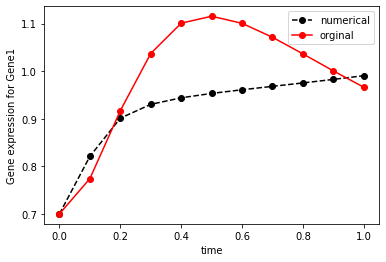

In [119]:
plt.plot(ts, final_gene_expression[:,0], marker='o', color='black', linestyle='dashed'  )
plt.plot(ts, ge_original[:,0], marker='o', color='red')
plt.xlabel('time')
plt.ylabel('Gene expression for Gene1')
plt.legend(('numerical','orginal'))
plt.show()

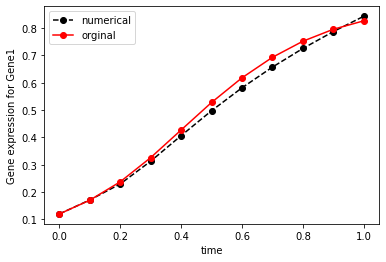

In [120]:
plt.plot(ts, final_gene_expression[:,1], marker='o', color='black', linestyle='dashed'  )
plt.plot(ts, ge_original[:,1], marker='o', color='red')
plt.xlabel('time')
plt.ylabel('Gene expression for Gene1')
plt.legend(('numerical','orginal'))
plt.show()

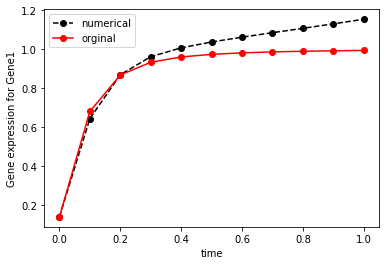

In [121]:
plt.plot(ts, final_gene_expression[:,2], marker='o', color='black', linestyle='dashed'  )
plt.plot(ts, ge_original[:,2], marker='o', color='red')
plt.xlabel('time')
plt.ylabel('Gene expression for Gene1')
plt.legend(('numerical','orginal'))
plt.show()

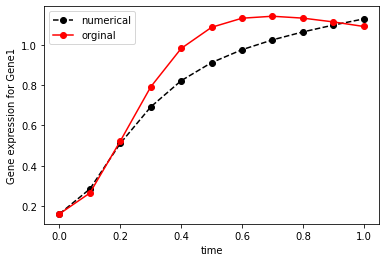

In [122]:
plt.plot(ts, final_gene_expression[:,3], marker='o', color='black', linestyle='dashed'  )
plt.plot(ts, ge_original[:,3], marker='o', color='red')
plt.xlabel('time')
plt.ylabel('Gene expression for Gene1')
plt.legend(('numerical','orginal'))
plt.show()

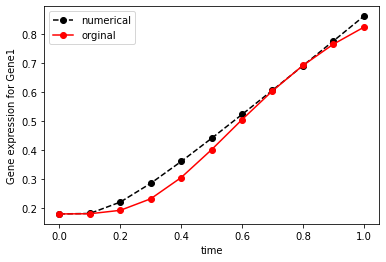

In [123]:
plt.plot(ts, final_gene_expression[:,4], marker='o', color='black', linestyle='dashed'  )
plt.plot(ts, ge_original[:,4], marker='o', color='red')
plt.xlabel('time')
plt.ylabel('Gene expression for Gene1')
plt.legend(('numerical','orginal'))
plt.show()

In [ ]:
(np.array([4,1,2,3,-5])<0).any()

In [ ]:
x=1
y=2

In [ ]:
x,y<1

In [ ]:
abc = random_population()
abcde =  np.array([[ 0.23995412, -25.25395704,  2.20821677,  0.57119182, -2.89922857],
        [-1.45582126,  0.42684459, -2.67608813,  1.84258079, -2.63221532],
        [-0.341528  , -0.78642164,  0.50312521, -0.83162554,  0.80743471],
        [-0.76038282, -1.43018882,  1.25787571,  0.58250259, -2.99517712],
        [-0.37758462, -0.93504208,  0.74771658, -1.32550173, -1.60948487]])

In [ ]:
import numpy as np
abcd = np.array([13.74317507,  58.54779089,  -18.85324073, 12.23335026,  3.65828499])

In [ ]:
cb(abcde,-3,3)

In [ ]:
def cb(parameters, low, high ):
    while((parameters<low).any() or (parameters>high).any()):
        InBounds=[]
        for x in np.nditer(parameters):
            if(x<low):
                InBounds.append(2*low-x)
            elif(x>high):
                InBounds.append(2*high-x)
            else:
                InBounds.append(x)
        parameters = np.array(InBounds).reshape(parameters.shape)
        #print(parameters)
    
    return(parameters)
    
        
        

In [ ]:
(abcd>20).any()

In [ ]:
abcd>20

In [ ]:
A =np.array([ 5,10,10,8,10])
B = np.array([ 10,10,10,10,10])
g = np.array([[ 1,2,0,0,0],
        [0,-1,1,0,0],
        [ -1,0,1,0,0 ],
        [0,-1,-1,-1,0],
        [-1,0,1,0,1]])
h= np.array([[2,0,0,0,0],
        [0,2,0,0,0],
        [0,0,2,0,0],
        [ 0,-1,0,2,1],
        [ -1,0,0,1,2]])

G1 = orginal_gene_expression[:,0]
G2 = orginal_gene_expression[:,1]
G3 = orginal_gene_expression[:,2]
G4 = orginal_gene_expression[:,3]
G5 = orginal_gene_expression[:,4]

t1 = orginal_gene_expression[1]

print(A[0]*(np.prod(np.power(t1,g[0])))-(B[0]*(np.prod(np.power(t1,h[0])))))
print(G1[0])

In [ ]:
orginal_gene_expression[:,1]

In [ ]:

def define_equation(A,B,g,h,Y):
    
    dydt = (A*(np.prod(np.power(Y,g))))-(B*(np.prod(np.power(Y,h))))

    return dydt


def get_dydt(ln):
    CalcGenes = []
    for j in range(n):
        temp = []
        for i in range(len(orginal_gene_expression)):
            temp.append(define_equation(ln['A'][j],ln['B'][j],ln['g'][j],ln['h'][j],orginal_gene_expression[i]))
        CalcGenes.append(temp)
    return(CalcGenes)